# **ANALIZA WYDAJNOŚCI GRADIENTOWYCH ALGORYTMÓW UCZENIA**  
# **SEBASTIAN GÓRSKI NR ALBUMU : 22354**


**PODPINANIE DYSKU GOOGLE**

In [ ]:
from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


**WYPAKOWANIE ZBIORU ZWIERZĄT Z PLIKU .RAR**

In [ ]:
!unrar x /content/drive/MyDrive/Animal.rar /

Strumieniowane dane wyjściowe obcięte do 5000 ostatnich wierszy.
Extracting  /Animal/train/HORSE/Img-11461.jpg                             44%  OK 
Extracting  /Animal/train/HORSE/Img-11486.jpg                             44%  OK 
Extracting  /Animal/train/HORSE/Img-11496.jpg                             44%  OK 
Extracting  /Animal/train/HORSE/Img-11506.jpg                             44%  OK 
Extracting  /Animal/train/HORSE/Img-11508.jpg                             44%  OK 
Extracting  /Animal/train/HORSE/Img-11516.jpg                             44%  OK 
Extracting  /Animal/train/HORSE/Img-11518.jpg                             44%  OK 
Extracting  /Animal/train/HORSE/Img-11520.jpg                             44%  OK 
Extracting  /Animal/train/HORSE/Img-11531.jpg                             44%  OK 
Extracting  /Animal/train/HORSE/Img-11539.jpg                             44%  OK 
Extracting  /An

**WYPAKOWANIE ZBIORU PTAKÓW Z PLIKU .RAR**

In [ ]:
!unrar x /content/drive/MyDrive/Birds.rar /

Strumieniowane dane wyjściowe obcięte do 5000 ostatnich wierszy.
Extracting  /Birds/train/White-Breasted-Waterhen/White-Breasted-Waterhen_973.jpg      85%  OK 
Extracting  /Birds/train/White-Breasted-Waterhen/White-Breasted-Waterhen_974.jpg      85%  OK 
Extracting  /Birds/train/White-Breasted-Waterhen/White-Breasted-Waterhen_975.jpg      85%  OK 
Extracting  /Birds/train/White-Breasted-Waterhen/White-Breasted-Waterhen_977.jpg      85%  OK 
Extracting  /Birds/train/White-Breasted-Waterhen/White-Breasted-Waterhen_979.jpg      85%  OK 
Extracting  /Birds/train/White-Breasted-Waterhen/White-Breasted-Waterhen_98.jpg      85%  OK 
Extracting  /Birds/train/White-Breasted-Waterhen/White-Breasted-Waterhen_980.jpg      85%  OK 
Extracting  /Birds/train/White-Breasted-Waterhen/White-Breasted-Waterhen_981.jpg      85%  OK 
Extracting  /Birds/train/White-Breasted-Waterhen/White-Breasted-Waterhen_982.jpg      85%  OK 


**WYPAKOWANIE ZBIORU PRODUKTÓW SPOŻYWCZYCH Z PLIKU .RAR**

In [ ]:
!unrar x /content/drive/MyDrive/Food.rar /

Strumieniowane dane wyjściowe obcięte do 5000 ostatnich wierszy.
Extracting  /Food_new1/train/tomato/tomato.289_3.jpg                      84%  OK 
Extracting  /Food_new1/train/tomato/tomato.28_1_1_1.jpg                   84%  OK 
Extracting  /Food_new1/train/tomato/tomato.290.jpg                        84%  OK 
Extracting  /Food_new1/train/tomato/tomato.290_1_1.jpg                    84%  OK 
Extracting  /Food_new1/train/tomato/tomato.291_1.jpg                      84%  OK 
Extracting  /Food_new1/train/tomato/tomato.292_1_1.jpg                    84%  OK 
Extracting  /Food_new1/train/tomato/tomato.293_1_1.jpg                    84%  OK 
Extracting  /Food_new1/train/tomato/tomato.293_2.jpg                      84%  OK 
Extracting  /Food_new1/train/tomato/tomato.294.jpg                        84%  OK 
Extracting  /Food_new1/train/tomato/tomato.295_1_1.jpg                    84%  OK 
Extracting  /Fo

**IMPORT BIBLIOTEK**

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense
from tensorflow.keras.optimizers import SGD, Adam, RMSprop, Adagrad, Adamax
from tensorflow.keras.callbacks import EarlyStopping
from sklearn.metrics import classification_report
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import os
import time
from concurrent.futures import ThreadPoolExecutor
from tensorflow.keras.utils import to_categorical
import cv2
from tqdm import tqdm
from google.colab.patches import cv2_imshow
import random
import glob
from PIL import Image
from tensorflow.keras import models, layers
from sklearn.metrics import confusion_matrix ,ConfusionMatrixDisplay , precision_recall_fscore_support, accuracy_score
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize
import seaborn as sns
import shutil
from sklearn.model_selection import train_test_split

In [ ]:
dataset_paths = {
    "Animal": "/Animal",
    "Birds": "/Birds",
    "Food": "/Food"
}

**ZMIANA PROPORCJI ZBIORU ANIMAL NA ( 70 - 15 - 15 )**  
**70 - ZBIÓR TRENINGOWY**  
**15 - ZBIÓR WALIDACYJNY**  
**15 - ZBIÓR TESTOWY**

In [ ]:
base_dir = '/Animal'
train_dir = os.path.join(base_dir, 'train')
val_dir = os.path.join(base_dir, 'val')
test_dir = os.path.join(base_dir, 'test')

temp_dir = os.path.join(base_dir, 'temp_all_data')
os.makedirs(temp_dir, exist_ok=True)

for folder in [train_dir, val_dir, test_dir]:
    for class_name in os.listdir(folder):
        source_class_dir = os.path.join(folder, class_name)
        target_class_dir = os.path.join(temp_dir, class_name)
        os.makedirs(target_class_dir, exist_ok=True)

        for file in os.listdir(source_class_dir):
            shutil.move(os.path.join(source_class_dir, file), os.path.join(target_class_dir, file))

for dir in [train_dir, val_dir, test_dir]:
    shutil.rmtree(dir, ignore_errors=True)
    os.makedirs(dir)

for class_name in os.listdir(temp_dir):
    class_temp_dir = os.path.join(temp_dir, class_name)
    class_train_dir = os.path.join(train_dir, class_name)
    class_val_dir = os.path.join(val_dir, class_name)
    class_test_dir = os.path.join(test_dir, class_name)

    os.makedirs(class_train_dir, exist_ok=True)
    os.makedirs(class_val_dir, exist_ok=True)
    os.makedirs(class_test_dir, exist_ok=True)

    files = os.listdir(class_temp_dir)
    train_files, temp_files = train_test_split(files, test_size=0.30)
    val_files, test_files = train_test_split(temp_files, test_size=0.50)

    for file in train_files:
        shutil.move(os.path.join(class_temp_dir, file), os.path.join(class_train_dir, file))

    for file in val_files:
        shutil.move(os.path.join(class_temp_dir, file), os.path.join(class_val_dir, file))

    for file in test_files:
        shutil.move(os.path.join(class_temp_dir, file), os.path.join(class_test_dir, file))

shutil.rmtree(temp_dir)
print("Proporcje zmienione na 70-15-15 dla całego zbioru.")


Proporcje zmienione na 70-15-15 dla całego zbioru.


**FUNKCJA PRZETWARZAJĄCA OBRAZY W MOMENCIE WCZYTANIA ZBIORU DANYCH** 

In [ ]:
def process_image(img_path, class_name, class_mapping, img_size):
    try:
        img = cv2.imread(img_path)
        if img is None:
            return None, None
        img = cv2.resize(img, img_size)
        label = class_mapping[class_name]
        return img, label
    except Exception as e:
        print(f"Błąd przy wczytywaniu obrazu {img_path}: {e}")
        return None, None

**FUNKCJA UMOŻLIWIAJĄCA WCZYTANIE DANYCH ORAZ PRZESKALOWANIE ICH DO WARTOŚCI PIKSELI Z PRZEDZIAŁU [0,1]**

In [ ]:
def load_data(base_path, img_size=(128, 128)):
    lbl = []
    img = []
    cls_names = sorted(os.listdir(base_path))
    class_mapping = {class_name: idx for idx, class_name in enumerate(cls_names)}

    tasks = []
    with ThreadPoolExecutor() as executor:
        for class_name in tqdm(cls_names, desc="Wczytywanie klas"):
            class_folder = os.path.join(base_path, class_name)
            if not os.path.isdir(class_folder):
                continue

            for img_file in os.listdir(class_folder):
                img_path = os.path.join(class_folder, img_file)
                tasks.append(executor.submit(process_image, img_path, class_name, class_mapping, img_size))

        for future in tqdm(tasks, desc="Przetwarzanie obrazów"):
            image, label = future.result()
            if image is not None and label is not None:
                img.append(image)
                lbl.append(label)

    return cls_names, np.array(lbl), np.array(img, dtype="float32") / 255.0


**FUNKCJA UMOŻLIWIAJĄCA PRZYGOTOWANIE DANYCH DO TRENINGU MODELU CNN**  
**(DANE PODZIELONE ZOSTAJĄ NA ZBIÓR TRENINGOWY , WALIDACYJNY ORAZ TESTOWY)**

In [ ]:
def prepare_data_for_cnn(base_path, img_size=(128, 128)):
    train_path = os.path.join(base_path, "train")
    val_path = os.path.join(base_path, "val")
    test_path = os.path.join(base_path, "test")

    X_train, y_train, class_names = load_data(train_path, img_size)
    X_val, y_val, _ = load_data(val_path, img_size)
    X_test, y_test, _ = load_data(test_path, img_size)

    return (X_train, y_train), (X_val, y_val), (X_test, y_test), class_names



# **ZBIÓR 1  - ANIMAL**

**WYWOŁANIE FUNKCJI DO WCZYTYWANIA DANYCH , PRZETWARZANIA ORAZ**  
**DO PODZIAŁU NA ODPOWIEDNIE ZBIORY UMOŻLIWIAJĄCE TRENING MODELU CNN**  
**ZDJECIA WCZYTYWYWANE DO MODELU ROZMIAR 128X128**

In [ ]:
base_path = dataset_paths["Animal"]
(X_train_animal, y_train_animal), (X_val_animal, y_val_animal), (X_test_animal, y_test_animal), class_names_animal = prepare_data_for_cnn(base_path, img_size=(128, 128))

Przetwarzanie obrazów: 100%|██████████| 2252/2252 [00:00<00:00, 4436.16it/s]


**WYMIAR POJEDYŃCZEGO OBRAZU W ZBIORZE TRENINGOWYM (POMINIĘTA LICZBA PRÓBEK)**  
**128 - DŁUGOŚĆ**  
**128 - SZEROKOŚĆ**   
**3 - LICZBA KANAŁÓW RGB**

In [ ]:
X_train_animal.shape[1:]

(128, 128, 3)

**TABLICA NUMPY WARTOŚCI PIKSELI OBRAZÓW ZE ZBIORU TRENINGOWEGO PO NORMALIZACJI**

In [ ]:
X_train_animal

array([[[[0.9607843 , 0.91764706, 0.80784315],
         [0.9607843 , 0.91764706, 0.80784315],
         [0.9647059 , 0.92156863, 0.8117647 ],
         ...,
         [0.9372549 , 0.8666667 , 0.72156864],
         [0.93333334, 0.8627451 , 0.7176471 ],
         [0.93333334, 0.8627451 , 0.7176471 ]],

        [[0.9607843 , 0.91764706, 0.80784315],
         [0.9607843 , 0.91764706, 0.80784315],
         [0.9607843 , 0.91764706, 0.80784315],
         ...,
         [0.9372549 , 0.8666667 , 0.72156864],
         [0.9372549 , 0.8666667 , 0.72156864],
         [0.9372549 , 0.8666667 , 0.72156864]],

        [[0.95686275, 0.9137255 , 0.8039216 ],
         [0.95686275, 0.9137255 , 0.8039216 ],
         [0.9607843 , 0.91764706, 0.80784315],
         ...,
         [0.9411765 , 0.87058824, 0.7254902 ],
         [0.9411765 , 0.87058824, 0.7254902 ],
         [0.9411765 , 0.87058824, 0.7254902 ]],

        ...,

        [[0.3882353 , 0.5254902 , 0.5294118 ],
         [0.39215687, 0.5294118 , 0.5372549 ]

**WYMIAR POJEDYŃCZEGO OBRAZU W ZBIORZE WALIDACYJNYM (POMINIĘTA LICZBA PRÓBEK)**  
**128 - DŁUGOŚĆ**  
**128 - SZEROKOŚĆ**    
**3 - LICZBA KANAŁÓW RGB**  

In [ ]:
X_val_animal.shape[1:]

(128, 128, 3)

**TABLICA NUMPY WARTOŚCI PIKSELI OBRAZÓW ZE ZBIORU WALIDACYJNEGO PO NORMALIZACJI**

In [ ]:
X_val_animal

array([[[[0.96862745, 0.95686275, 0.9372549 ],
         [0.96862745, 0.95686275, 0.9372549 ],
         [0.972549  , 0.9607843 , 0.9411765 ],
         ...,
         [0.9372549 , 0.91764706, 0.9137255 ],
         [0.9372549 , 0.92156863, 0.91764706],
         [0.9372549 , 0.92156863, 0.91764706]],

        [[0.96862745, 0.95686275, 0.9372549 ],
         [0.96862745, 0.95686275, 0.9372549 ],
         [0.96862745, 0.95686275, 0.9372549 ],
         ...,
         [0.9411765 , 0.92156863, 0.9137255 ],
         [0.9372549 , 0.92156863, 0.91764706],
         [0.9372549 , 0.92156863, 0.91764706]],

        [[0.9647059 , 0.9529412 , 0.93333334],
         [0.9647059 , 0.9529412 , 0.93333334],
         [0.9647059 , 0.9529412 , 0.93333334],
         ...,
         [0.94509804, 0.9254902 , 0.91764706],
         [0.9411765 , 0.92156863, 0.91764706],
         [0.9372549 , 0.92156863, 0.91764706]],

        ...,

        [[0.33333334, 0.59607846, 0.5372549 ],
         [0.32156864, 0.5882353 , 0.5294118 ]

In [ ]:
X_test_animal.shape[1:]

(128, 128, 3)

**TABLICA NUMPY WARTOŚCI PIKSELI OBRAZÓW ZE ZBIORU TESTOWEGO PO NORMALIZACJI**

In [ ]:
X_test_animal

array([[[[0.33333334, 0.5529412 , 0.5019608 ],
         [0.32156864, 0.5411765 , 0.49019608],
         [0.29411766, 0.52156866, 0.47058824],
         ...,
         [0.6745098 , 0.6745098 , 0.5176471 ],
         [0.62352943, 0.62352943, 0.46666667],
         [0.59607846, 0.6       , 0.44313726]],

        [[0.3254902 , 0.54509807, 0.49411765],
         [0.31764707, 0.5372549 , 0.4862745 ],
         [0.29411766, 0.5254902 , 0.47058824],
         ...,
         [0.73333335, 0.7294118 , 0.5764706 ],
         [0.67058825, 0.6666667 , 0.5137255 ],
         [0.6392157 , 0.6392157 , 0.48235294]],

        [[0.3137255 , 0.53333336, 0.48235294],
         [0.30588236, 0.5294118 , 0.47843137],
         [0.29803923, 0.5254902 , 0.4745098 ],
         ...,
         [0.8509804 , 0.8352941 , 0.6862745 ],
         [0.7647059 , 0.7529412 , 0.6039216 ],
         [0.72156864, 0.7137255 , 0.5647059 ]],

        ...,

        [[0.6313726 , 0.6784314 , 0.6862745 ],
         [0.654902  , 0.70980394, 0.7176471 ]

**LICZBA PRÓBEK - ZBIÓR TRENINGOWY**

In [ ]:
len(X_train_animal)

10494

**LICZBA PRÓBEK - ZBIÓR WALIDACYJNY**

In [ ]:
len(X_val_animal)

2250

**LICZBA PRÓBEK - ZBIÓR TESTOWY**

In [ ]:
len(X_test_animal)

2252

**NAZWY KLAS W ZBIORZE DANYCH**

In [ ]:
class_names_animal

['ELEPHANT', 'HORSE', 'LION', 'cat', 'dog']

**FUNKCJA WYŚWIETLAJĄCA LICZBĘ PRÓBEK TRENINGOWYCH W KAŻDEJ Z KLAS**

In [ ]:
def count_samples(data_dir):

    class_counts = {}
    for class_folder in os.listdir(data_dir):
        class_path = os.path.join(data_dir, class_folder)
        if os.path.isdir(class_path):

            num_samples = len(os.listdir(class_path))
            class_counts[class_folder] = num_samples
    return class_counts


train_dir_animal = "/Animal/train"



animal_counts = count_samples(train_dir_animal)



print("Liczba próbek treningowych:")
for class_name, count in animal_counts.items():
    print(f"  {class_name}: {count} próbek")

Liczba próbek treningowych:
  LION: 2087 próbek
  dog: 2048 próbek
  HORSE: 2106 próbek
  cat: 2125 próbek
  ELEPHANT: 2128 próbek


**PRZYKŁADOWA PRÓBKA ZE ZBIORU TRENINGOWEGO**

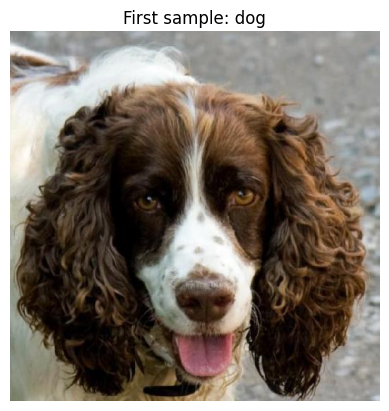

In [ ]:

def display_first_sample_from_animal(data_dir):
    class_folders = [f for f in os.listdir(data_dir) if os.path.isdir(os.path.join(data_dir, f))]
    first_class = sorted(class_folders)[4]
    class_folder = os.path.join(data_dir, first_class)
    image_paths = glob.glob(f"{class_folder}/*")
    first_image_path = image_paths[0]
    img = Image.open(first_image_path)
    plt.imshow(img)
    plt.axis('off')
    plt.title(f"First sample: {first_class}")
    plt.show()

train_dir_animal = "/Animal/train"
display_first_sample_from_animal(train_dir_animal)




# **ZBIÓR 2 -BIRDS**

**WYWOŁANIE FUNKCJI DO WCZYTYWANIA DANYCH , PRZETWARZANIA ORAZ**  
**DO PODZIAŁU NA ODPOWIEDNIE ZBIORY UMOŻLIWIAJĄCE TRENING MODELU CNN**

In [ ]:
base_path = dataset_paths["Birds"]
(X_train_birds, y_train_birds), (X_val_birds, y_val_birds), (X_test_birds, y_test_birds), class_names_birds = prepare_data_for_cnn(base_path, img_size=(128, 128))



Przetwarzanie obrazów: 100%|██████████| 3750/3750 [00:02<00:00, 1625.40it/s]


**WYMIAR POJEDYŃCZEGO OBRAZU W ZBIORZE TRENINGOWYM (POMINIĘTA LICZBA PRÓBEK)**  
**128 - DŁUGOŚĆ**  
**128 - SZEROKOŚĆ**   
**3 - LICZBA KANAŁÓW RGB**

In [ ]:
X_train_birds.shape[1:]

(128, 128, 3)

**TABLICA NUMPY WARTOŚCI PIKSELI OBRAZÓW ZE ZBIORU TRENINGOWEGO PO NORMALIZACJI**

In [ ]:
X_train_birds

array([[[[0.43529412, 0.60784316, 0.5568628 ],
         [0.4509804 , 0.6117647 , 0.58431375],
         [0.44313726, 0.6117647 , 0.6       ],
         ...,
         [0.30588236, 0.5372549 , 0.48235294],
         [0.3019608 , 0.52156866, 0.47058824],
         [0.30588236, 0.5254902 , 0.4745098 ]],

        [[0.43137255, 0.60784316, 0.5411765 ],
         [0.42352942, 0.59607846, 0.54901963],
         [0.39607844, 0.5882353 , 0.5568628 ],
         ...,
         [0.3137255 , 0.5372549 , 0.5058824 ],
         [0.3137255 , 0.53333336, 0.48235294],
         [0.3137255 , 0.53333336, 0.48235294]],

        [[0.42352942, 0.6156863 , 0.5372549 ],
         [0.4       , 0.5921569 , 0.5137255 ],
         [0.3529412 , 0.56078434, 0.52156866],
         ...,
         [0.3372549 , 0.53333336, 0.5254902 ],
         [0.32156864, 0.54901963, 0.50980395],
         [0.32156864, 0.5529412 , 0.49411765]],

        ...,

        [[0.16470589, 0.3019608 , 0.2509804 ],
         [0.1764706 , 0.30588236, 0.27450982]

**WYMIAR POJEDYŃCZEGO OBRAZU W ZBIORZE WALIDACYJNYM (POMINIĘTA LICZBA PRÓBEK)**  
**128 - DŁUGOŚĆ**  
**128 - SZEROKOŚĆ**   
**3 - LICZBA KANAŁÓW RGB**

In [ ]:
X_val_birds.shape[1:]

(128, 128, 3)

**TABLICA NUMPY WARTOŚCI PIKSELI OBRAZÓW ZE ZBIORU WALIDACYJNEGO PO NORMALIZACJI**

In [ ]:
X_val_birds

array([[[[0.4509804 , 0.68235296, 0.7176471 ],
         [0.4392157 , 0.67058825, 0.7058824 ],
         [0.4392157 , 0.67058825, 0.7058824 ],
         ...,
         [0.42745098, 0.65882355, 0.69803923],
         [0.42352942, 0.6431373 , 0.6862745 ],
         [0.42745098, 0.64705884, 0.6901961 ]],

        [[0.44705883, 0.6784314 , 0.7137255 ],
         [0.44313726, 0.6745098 , 0.70980394],
         [0.43529412, 0.6666667 , 0.7019608 ],
         ...,
         [0.41960785, 0.6509804 , 0.6901961 ],
         [0.43529412, 0.654902  , 0.69803923],
         [0.43529412, 0.654902  , 0.69803923]],

        [[0.4392157 , 0.67058825, 0.7058824 ],
         [0.44313726, 0.6745098 , 0.70980394],
         [0.44705883, 0.67058825, 0.7058824 ],
         ...,
         [0.43137255, 0.6509804 , 0.69411767],
         [0.42745098, 0.64705884, 0.6901961 ],
         [0.43137255, 0.6509804 , 0.69411767]],

        ...,

        [[0.45490196, 0.7137255 , 0.6666667 ],
         [0.4509804 , 0.70980394, 0.6627451 ]

**WYMIAR POJEDYŃCZEGO OBRAZU W ZBIORZE TESTOWYM (POMINIĘTA LICZBA PRÓBEK)**  
**128 - DŁUGOŚĆ**  
**128 - SZEROKOŚĆ**   
**3 - LICZBA KANAŁÓW RGB**

In [ ]:
X_test_birds.shape[1:]

(128, 128, 3)

**TABLICA NUMPY WARTOŚCI PIKSELI OBRAZÓW ZE ZBIORU TESTOWEGO PO NORMALIZACJI**

In [ ]:
X_test_birds

array([[[[0.2901961 , 0.52156866, 0.37254903],
         [0.25882354, 0.5176471 , 0.34509805],
         [0.29803923, 0.5372549 , 0.3882353 ],
         ...,
         [0.49019608, 0.6313726 , 0.6313726 ],
         [0.53333336, 0.65882355, 0.654902  ],
         [0.53333336, 0.65882355, 0.654902  ]],

        [[0.29803923, 0.5294118 , 0.38039216],
         [0.27058825, 0.5254902 , 0.35686275],
         [0.3019608 , 0.5411765 , 0.39215687],
         ...,
         [0.47058824, 0.6039216 , 0.6039216 ],
         [0.5058824 , 0.6392157 , 0.6392157 ],
         [0.5137255 , 0.64705884, 0.64705884]],

        [[0.31764707, 0.54901963, 0.39607844],
         [0.28627452, 0.54509807, 0.37254903],
         [0.3137255 , 0.5529412 , 0.40392157],
         ...,
         [0.4509804 , 0.5686275 , 0.57254905],
         [0.47058824, 0.6156863 , 0.6313726 ],
         [0.4745098 , 0.61960787, 0.63529414]],

        ...,

        [[0.28627452, 0.5568628 , 0.4392157 ],
         [0.28235295, 0.5568628 , 0.4392157 ]

**LICZBA PRÓBEK - ZBIÓR TRENINGOWY**

In [ ]:
len(X_train_birds)

30000

**LICZBA PRÓBEK - ZBIÓR WALIDACYJNY**

In [ ]:
len(X_val_birds)

3750

**LICZBA PRÓBEK - ZBIÓR TESTOWY**

In [ ]:
len(X_test_birds)

3750

**NAZWY KLAS ZE ZBIORU PTAKÓW**


In [ ]:
class_names_birds

['Asian-Green-Bee-Eater',
 'Brown-Headed-Barbet',
 'Cattle-Egret',
 'Common-Kingfisher',
 'Common-Myna',
 'Common-Rosefinch',
 'Common-Tailorbird',
 'Coppersmith-Barbet',
 'Forest-Wagtail',
 'Gray-Wagtail',
 'Hoopoe',
 'House-Crow',
 'Indian-Grey-Hornbill',
 'Indian-Peacock',
 'Indian-Pitta',
 'Indian-Roller',
 'Jungle-Babbler',
 'Northern-Lapwing',
 'Red-Wattled-Lapwing',
 'Ruddy-Shelduck',
 'Rufous-Treepie',
 'Sarus-Crane',
 'White-Breasted-Kingfisher',
 'White-Breasted-Waterhen',
 'White-Wagtail']

**FUNKCJA ZLICZAJĄCA LICZBĘ PRÓBEK W KLASACH**

In [ ]:
def count_samples(data_dir):

    class_counts = {}
    for class_folder in os.listdir(data_dir):
        class_path = os.path.join(data_dir, class_folder)
        if os.path.isdir(class_path):

            num_samples = len(os.listdir(class_path))
            class_counts[class_folder] = num_samples
    return class_counts


train_dir_animal = "/Birds/train"



animal_counts = count_samples(train_dir_animal)



print("Liczba próbek treningowych:")
for class_name, count in animal_counts.items():
    print(f"  {class_name}: {count} próbek")

Liczba próbek treningowych:
  Jungle-Babbler: 1200 próbek
  Common-Myna: 1200 próbek
  Northern-Lapwing: 1200 próbek
  Coppersmith-Barbet: 1200 próbek
  Ruddy-Shelduck: 1200 próbek
  White-Wagtail: 1200 próbek
  Forest-Wagtail: 1200 próbek
  Asian-Green-Bee-Eater: 1200 próbek
  Gray-Wagtail: 1200 próbek
  Common-Rosefinch: 1200 próbek
  Common-Tailorbird: 1200 próbek
  Indian-Roller: 1200 próbek
  Rufous-Treepie: 1200 próbek
  Common-Kingfisher: 1200 próbek
  Indian-Pitta: 1200 próbek
  Brown-Headed-Barbet: 1200 próbek
  Indian-Grey-Hornbill: 1200 próbek
  Red-Wattled-Lapwing: 1200 próbek
  House-Crow: 1200 próbek
  White-Breasted-Kingfisher: 1200 próbek
  Indian-Peacock: 1200 próbek
  White-Breasted-Waterhen: 1200 próbek
  Sarus-Crane: 1200 próbek
  Cattle-Egret: 1200 próbek
  Hoopoe: 1200 próbek


**PRZYKŁADOWA PRÓBKA ZE ZBIORU PTAKÓW**

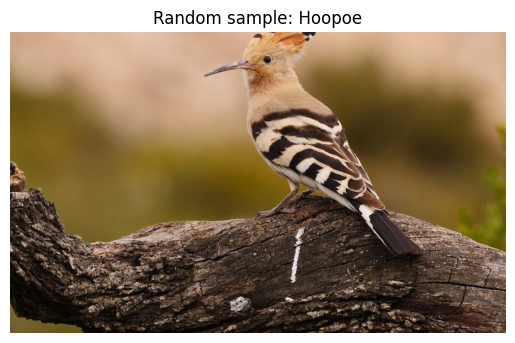

In [ ]:
def display_random_sample_from_birds(data_dir):

    class_folders = [f for f in os.listdir(data_dir) if os.path.isdir(os.path.join(data_dir, f))]


    random_class = random.choice(class_folders)

    class_folder = os.path.join(data_dir, random_class)


    image_paths = glob.glob(f"{class_folder}/*")

    random_image_path = random.choice(image_paths)


    img = Image.open(random_image_path)
    plt.imshow(img)
    plt.axis('off')
    plt.title(f"Random sample: {random_class}")
    plt.show()


train_dir_birds = "/Birds/train"


display_random_sample_from_birds(train_dir_birds)




# **ZBIÓR 3 -FOOD**

**WYWOŁANIE FUNKCJI DO WCZYTYWANIA DANYCH , PRZETWARZANIA ORAZ**  
**DO PODZIAŁU NA ODPOWIEDNIE ZBIORY UMOŻLIWIAJĄCE TRENING MODELU CNN**

In [120]:
base_path = dataset_paths["Food"]
(X_train_food, y_train_food), (X_val_food, y_val_food), (X_test_food, y_test_food), class_names_food = prepare_data_for_cnn(base_path, img_size=(128, 128))


Przetwarzanie obrazów: 100%|██████████| 3204/3204 [00:00<00:00, 87855.48it/s]


**WYMIAR POJEDYŃCZEGO OBRAZU W ZBIORZE TRENINGOWYM (POMINIĘTA LICZBA PRÓBEK)**  
**128 - DŁUGOŚĆ**  
**128 - SZEROKOŚĆ**   
**3 - LICZBA KANAŁÓW RGB**

In [121]:
X_train_food.shape[1:]

(128, 128, 3)

**TABLICA NUMPY WARTOŚCI PIKSELI OBRAZÓW ZE ZBIORU TRENINGOWEGO PO NORMALIZACJI**

In [122]:
X_train_food

array([[[[1.        , 1.        , 1.        ],
         [1.        , 1.        , 1.        ],
         [1.        , 1.        , 1.        ],
         ...,
         [1.        , 1.        , 1.        ],
         [1.        , 1.        , 1.        ],
         [1.        , 1.        , 1.        ]],

        [[1.        , 1.        , 1.        ],
         [1.        , 1.        , 1.        ],
         [1.        , 1.        , 1.        ],
         ...,
         [1.        , 1.        , 1.        ],
         [1.        , 1.        , 1.        ],
         [1.        , 1.        , 1.        ]],

        [[1.        , 1.        , 1.        ],
         [1.        , 1.        , 1.        ],
         [1.        , 1.        , 1.        ],
         ...,
         [1.        , 1.        , 1.        ],
         [1.        , 1.        , 1.        ],
         [1.        , 1.        , 1.        ]],

        ...,

        [[1.        , 1.        , 1.        ],
         [1.        , 1.        , 1.        ]

**WYMIAR POJEDYŃCZEGO OBRAZU W ZBIORZE WALIDACYJNYM (POMINIĘTA LICZBA PRÓBEK)**  
**128 - DŁUGOŚĆ**  
**128 - SZEROKOŚĆ**   
**3 - LICZBA KANAŁÓW RGB**

In [123]:
X_val_food.shape[1:]

(128, 128, 3)

**TABLICA NUMPY WARTOŚCI PIKSELI OBRAZÓW ZE ZBIORU WALIDACYJNEGO PO NORMALIZACJI**

In [124]:
X_val_food

array([[[[0.9607843 , 0.96862745, 0.972549  ],
         [0.9607843 , 0.96862745, 0.972549  ],
         [0.9607843 , 0.96862745, 0.972549  ],
         ...,
         [0.99215686, 0.9882353 , 0.99607843],
         [0.99215686, 0.9882353 , 0.99607843],
         [0.99215686, 0.9882353 , 0.99607843]],

        [[0.9607843 , 0.96862745, 0.972549  ],
         [0.9607843 , 0.96862745, 0.972549  ],
         [0.9607843 , 0.96862745, 0.972549  ],
         ...,
         [0.99215686, 0.9882353 , 0.99607843],
         [0.99215686, 0.9882353 , 0.99607843],
         [0.99215686, 0.9882353 , 0.99607843]],

        [[0.95686275, 0.9647059 , 0.96862745],
         [0.95686275, 0.9647059 , 0.96862745],
         [0.95686275, 0.9647059 , 0.96862745],
         ...,
         [0.99215686, 0.9882353 , 0.99607843],
         [0.99215686, 0.9882353 , 0.99607843],
         [0.99215686, 0.9882353 , 0.99607843]],

        ...,

        [[0.54509807, 0.7137255 , 0.93333334],
         [0.5411765 , 0.70980394, 0.92941177]

**WYMIAR POJEDYŃCZEGO OBRAZU W ZBIORZE TESTOWYM (POMINIĘTA LICZBA PRÓBEK)**  
**128 - DŁUGOŚĆ**  
**128 - SZEROKOŚĆ**   
**3 - LICZBA KANAŁÓW RGB**

In [125]:
X_test_food.shape[1:]

(128, 128, 3)

**TABLICA NUMPY WARTOŚCI PIKSELI OBRAZÓW ZE ZBIORU TESTOWEGO PO NORMALIZACJI**

In [126]:
X_test_food

array([[[[0.9372549 , 0.9372549 , 0.9372549 ],
         [0.9372549 , 0.9372549 , 0.9372549 ],
         [0.9372549 , 0.9372549 , 0.9372549 ],
         ...,
         [0.96862745, 0.96862745, 0.96862745],
         [0.972549  , 0.972549  , 0.972549  ],
         [0.972549  , 0.972549  , 0.972549  ]],

        [[0.92941177, 0.92941177, 0.92941177],
         [0.92941177, 0.92941177, 0.92941177],
         [0.92941177, 0.92941177, 0.92941177],
         ...,
         [0.96862745, 0.96862745, 0.96862745],
         [0.972549  , 0.972549  , 0.972549  ],
         [0.972549  , 0.972549  , 0.972549  ]],

        [[0.91764706, 0.91764706, 0.91764706],
         [0.91764706, 0.91764706, 0.91764706],
         [0.91764706, 0.91764706, 0.91764706],
         ...,
         [0.96862745, 0.96862745, 0.96862745],
         [0.972549  , 0.972549  , 0.972549  ],
         [0.972549  , 0.972549  , 0.972549  ]],

        ...,

        [[0.7372549 , 0.7921569 , 0.8156863 ],
         [0.7058824 , 0.7607843 , 0.78431374]

**LICZBA PRÓBEK W ZBIORZE TRENINGOWYM**

In [127]:
len(X_train_food)

25422

**LICZBA PRÓBEK W ZBIORZE WALIDACYJNYM**

In [128]:
len(X_val_food)

3193

**LICZBA PRÓBEK W ZBIORZE TESTOWYM**

In [129]:
len(X_test_food)

3204

**NAZWY KLAS ZE ZBIORU PRODUKTÓW SPOŻYWCZYCH**

In [130]:
class_names_food

['bacon',
 'banana',
 'bread',
 'broccoli',
 'butter',
 'carrots',
 'cheese',
 'chicken',
 'cucumber',
 'eggs',
 'fish',
 'lettuce',
 'milk',
 'onions',
 'peppers',
 'potatoes',
 'sausages',
 'spinach',
 'tomato',
 'yogurt']

**LICZBA PRÓBEK W KLASACH**

In [131]:
def count_samples(data_dir):

    class_counts = {}
    for class_folder in os.listdir(data_dir):
        class_path = os.path.join(data_dir, class_folder)
        if os.path.isdir(class_path):

            num_samples = len(os.listdir(class_path))
            class_counts[class_folder] = num_samples
    return class_counts


train_dir_animal = "/Food/train"



animal_counts = count_samples(train_dir_animal)



print("Liczba próbek treningowych:")
for class_name, count in animal_counts.items():
    print(f"  {class_name}: {count} próbek")

Liczba próbek treningowych:
  yogurt: 993 próbek
  cucumber: 810 próbek
  milk: 1699 próbek
  broccoli: 1159 próbek
  peppers: 1096 próbek
  carrots: 1559 próbek
  chicken: 987 próbek
  bread: 1418 próbek
  bacon: 897 próbek
  lettuce: 1305 próbek
  spinach: 978 próbek
  banana: 876 próbek
  cheese: 1265 próbek
  onions: 1745 próbek
  sausages: 1112 próbek
  tomato: 1361 próbek
  eggs: 1703 próbek
  butter: 1409 próbek
  fish: 1352 próbek
  potatoes: 1698 próbek


**PRZYKŁADOWA PRÓBKA ZE ZBIORU PRODUKTÓW SPOŻYWCZYCH**

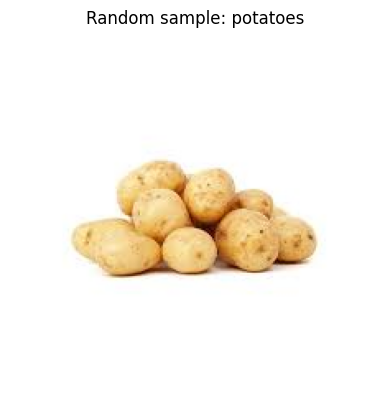

In [134]:
def display_random_sample_from_food(data_dir):

    class_folders = [f for f in os.listdir(data_dir) if os.path.isdir(os.path.join(data_dir, f))]


    random_class = random.choice(class_folders)

    class_folder = os.path.join(data_dir, random_class)


    image_paths = glob.glob(f"{class_folder}/*")

    random_image_path = random.choice(image_paths)


    img = Image.open(random_image_path)
    plt.imshow(img)
    plt.axis('off')
    plt.title(f"Random sample: {random_class}")
    plt.show()


train_dir_food = "/Food/train"


display_random_sample_from_food(train_dir_food)




# **TRENING ZBIORU ANIMAL NA 3 MODELACH**

**MODEL PROSTY - 3 WARSTWY CONV**

In [ ]:
X_train, y_train = X_train_animal, y_train_animal
X_val, y_val = X_val_animal, y_val_animal
X_test, y_test = X_test_animal, y_test_animal
input_shape = X_train.shape[1:]
num_classes = len(class_names_animal)

In [ ]:
def three_layer_model(input_shape, num_classes):
    model = models.Sequential([
        layers.Conv2D(64, (3, 3), activation='relu', input_shape=input_shape),

        layers.MaxPooling2D((2, 2)),
        layers.Dropout(0.2),

        layers.Conv2D(128, (3, 3), activation='relu'),

        layers.MaxPooling2D((2, 2)),
        layers.Dropout(0.2),

        layers.Conv2D(256, (3, 3), activation='relu'),

        layers.MaxPooling2D((2, 2)),
        layers.Dropout(0.3),

        layers.GlobalAveragePooling2D(),
        layers.Dense(256, activation='relu'),
        layers.Dropout(0.4),
        layers.Dense(num_classes, activation='softmax')
    ])
    return model




In [ ]:
EPOCHS = 100
results = []
classification_reports = {}
y_pred_probs = {}
confusion_matrices = {}

optimizers = {
    'SGD': SGD(learning_rate=0.01),
    'Momentum': SGD(learning_rate=0.01, momentum=0.9),
    'NAG': SGD(learning_rate=0.01, momentum=0.9, nesterov=True),
    'AdaGrad': Adagrad(learning_rate=0.01),
    'RMSProp': RMSprop(learning_rate=0.001),
    'Adam': Adam(learning_rate=0.001),
    'AdaMax': Adamax(learning_rate=0.001),
}

for optimizer_name, optimizer in optimizers.items():
    print(f"\nTrening na zbiorze: Animal z optymalizatorem: {optimizer_name}")

    model = three_layer_model(input_shape, num_classes)
    model.compile(optimizer=optimizer,
                  loss='sparse_categorical_crossentropy',
                  metrics=['accuracy'])

    early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

    start_time = time.time()
    history = model.fit(
        X_train, y_train,
        validation_data=(X_val, y_val),
        epochs=EPOCHS,
        callbacks=[early_stopping],
        verbose=1
    )
    elapsed_time = round(time.time() - start_time, 2)

    test_loss, test_accuracy = model.evaluate(X_test, y_test, verbose=0)
    y_pred = np.argmax(model.predict(X_test), axis=-1)
    y_true = y_test

    precision, recall, f1, _ = precision_recall_fscore_support(y_true, y_pred, average="weighted",zero_division=0)
    accuracy = accuracy_score(y_true, y_pred)

    results.append({
        "Dataset": "Animal",
        "Optimizer": optimizer_name,
        "Test Accuracy": accuracy,
        "Precision": precision,
        "Recall": recall,
        "F1 Score": f1,
        "Convergence Speed": len(history.history['loss']),
        "Training Time (s)": elapsed_time,
        "Test Loss": test_loss
    })

    classification_reports[optimizer_name] = classification_report(y_true, y_pred, target_names=[str(i) for i in np.unique(y_true)], zero_division=0)

    y_pred_probs[optimizer_name] = model.predict(X_test)

    confusion_matrices[optimizer_name] = confusion_matrix(y_true, y_pred)



Trening na zbiorze: Animal z optymalizatorem: SGD


/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
328/328 ━━━━━━━━━━━━━━━━━━━━ 25s 46ms/step - accuracy: 0.2120 - loss: 1.6057 - val_accuracy: 0.2649 - val_loss: 1.6013
Epoch 2/100
328/328 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.2710 - loss: 1.5950 - val_accuracy: 0.2716 - val_loss: 1.5899
Epoch 3/100
328/328 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.3057 - loss: 1.5790 - val_accuracy: 0.3382 - val_loss: 1.5613
Epoch 4/100
328/328 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.3131 - loss: 1.5484 - val_accuracy: 0.3622 - val_loss: 1.5309
Epoch 5/100
328/328 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.3292 - loss: 1.5137 - val_accuracy: 0.3587 - val_loss: 1.4895
Epoch 6/100
328/328 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.3482 - loss: 1.4878 - val_accuracy: 0.3924 - val_loss: 1.4483
Epoch 7/100
328/328 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.3488 - loss: 1.4642 - val_accuracy: 0.3302 - val_loss: 1.4791
Epoch 8/100
328/328 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.3561 - loss: 1.4403 - val_ac

/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
328/328 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - accuracy: 0.2476 - loss: 1.5917 - val_accuracy: 0.3413 - val_loss: 1.5130
Epoch 2/100
328/328 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.3419 - loss: 1.4740 - val_accuracy: 0.3569 - val_loss: 1.4707
Epoch 3/100
328/328 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.3828 - loss: 1.3874 - val_accuracy: 0.4200 - val_loss: 1.3273
Epoch 4/100
328/328 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.4262 - loss: 1.3042 - val_accuracy: 0.4493 - val_loss: 1.2483
Epoch 5/100
328/328 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.4637 - loss: 1.2515 - val_accuracy: 0.4698 - val_loss: 1.2314
Epoch 6/100
328/328 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.4865 - loss: 1.1899 - val_accuracy: 0.5147 - val_loss: 1.1407
Epoch 7/100
328/328 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.5219 - loss: 1.1051 - val_accuracy: 0.5858 - val_loss: 1.0306
Epoch 8/100
328/328 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.5284 - loss: 1.0841 - val_ac

/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
328/328 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - accuracy: 0.2421 - loss: 1.5938 - val_accuracy: 0.3738 - val_loss: 1.4642
Epoch 2/100
328/328 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.3484 - loss: 1.4572 - val_accuracy: 0.3298 - val_loss: 1.4923
Epoch 3/100
328/328 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.4061 - loss: 1.3621 - val_accuracy: 0.4578 - val_loss: 1.2529
Epoch 4/100
328/328 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.4760 - loss: 1.2448 - val_accuracy: 0.5413 - val_loss: 1.0765
Epoch 5/100
328/328 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.4963 - loss: 1.1691 - val_accuracy: 0.4987 - val_loss: 1.2487
Epoch 6/100
328/328 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.5315 - loss: 1.0838 - val_accuracy: 0.5742 - val_loss: 1.0083
Epoch 7/100
328/328 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.5530 - loss: 1.0344 - val_accuracy: 0.6133 - val_loss: 0.9644
Epoch 8/100
328/328 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.5680 - loss: 1.0013 - val_ac

/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
328/328 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - accuracy: 0.2218 - loss: 1.6059 - val_accuracy: 0.2196 - val_loss: 1.5979
Epoch 2/100
328/328 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.3060 - loss: 1.5663 - val_accuracy: 0.3467 - val_loss: 1.5306
Epoch 3/100
328/328 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.3401 - loss: 1.5064 - val_accuracy: 0.4169 - val_loss: 1.4318
Epoch 4/100
328/328 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.3904 - loss: 1.4213 - val_accuracy: 0.3964 - val_loss: 1.3881
Epoch 5/100
328/328 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.4146 - loss: 1.3714 - val_accuracy: 0.4711 - val_loss: 1.3025
Epoch 6/100
328/328 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.4436 - loss: 1.3136 - val_accuracy: 0.4884 - val_loss: 1.2572
Epoch 7/100
328/328 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.4556 - loss: 1.2772 - val_accuracy: 0.4796 - val_loss: 1.2370
Epoch 8/100
328/328 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.4797 - loss: 1.2297 - val_ac

/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
328/328 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - accuracy: 0.2900 - loss: 1.5489 - val_accuracy: 0.4093 - val_loss: 1.3188
Epoch 2/100
328/328 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.4355 - loss: 1.3092 - val_accuracy: 0.5000 - val_loss: 1.1515
Epoch 3/100
328/328 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.5048 - loss: 1.1760 - val_accuracy: 0.5013 - val_loss: 1.1776
Epoch 4/100
328/328 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.5475 - loss: 1.0758 - val_accuracy: 0.6244 - val_loss: 0.9373
Epoch 5/100
328/328 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.5842 - loss: 0.9965 - val_accuracy: 0.6329 - val_loss: 0.9092
Epoch 6/100
328/328 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.6289 - loss: 0.9169 - val_accuracy: 0.6551 - val_loss: 0.8364
Epoch 7/100
328/328 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.6584 - loss: 0.8537 - val_accuracy: 0.7018 - val_loss: 0.8174
Epoch 8/100
328/328 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.6842 - loss: 0.8036 - val_ac

/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
328/328 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step - accuracy: 0.2784 - loss: 1.5447 - val_accuracy: 0.3933 - val_loss: 1.3947
Epoch 2/100
328/328 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.4708 - loss: 1.2208 - val_accuracy: 0.5693 - val_loss: 1.0112
Epoch 3/100
328/328 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.5645 - loss: 1.0320 - val_accuracy: 0.6547 - val_loss: 0.8652
Epoch 4/100
328/328 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.6212 - loss: 0.9028 - val_accuracy: 0.6636 - val_loss: 0.8714
Epoch 5/100
328/328 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.6517 - loss: 0.8521 - val_accuracy: 0.7280 - val_loss: 0.7038
Epoch 6/100
328/328 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.6939 - loss: 0.7577 - val_accuracy: 0.7684 - val_loss: 0.6327
Epoch 7/100
328/328 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.7286 - loss: 0.6919 - val_accuracy: 0.7578 - val_loss: 0.6112
Epoch 8/100
328/328 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.7398 - loss: 0.6673 - val_ac

/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
328/328 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step - accuracy: 0.2816 - loss: 1.5263 - val_accuracy: 0.4116 - val_loss: 1.3277
Epoch 2/100
328/328 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.4714 - loss: 1.2346 - val_accuracy: 0.5511 - val_loss: 1.0888
Epoch 3/100
328/328 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.5152 - loss: 1.1142 - val_accuracy: 0.5462 - val_loss: 1.0373
Epoch 4/100
328/328 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.5528 - loss: 1.0334 - val_accuracy: 0.5653 - val_loss: 0.9755
Epoch 5/100
328/328 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.5893 - loss: 0.9797 - val_accuracy: 0.6453 - val_loss: 0.8942
Epoch 6/100
328/328 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.6214 - loss: 0.9013 - val_accuracy: 0.6724 - val_loss: 0.8266
Epoch 7/100
328/328 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.6293 - loss: 0.8748 - val_accuracy: 0.6916 - val_loss: 0.7799
Epoch 8/100
328/328 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.6597 - loss: 0.8303 - val_ac

In [ ]:
results_df = pd.DataFrame(results)
results_df.to_csv("training_results.csv", index=False)

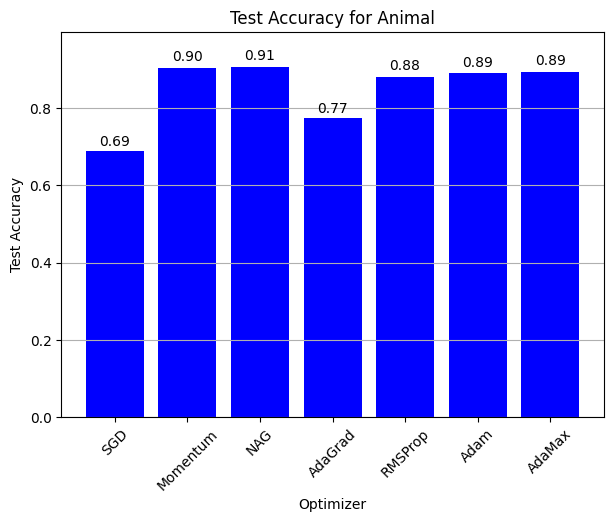

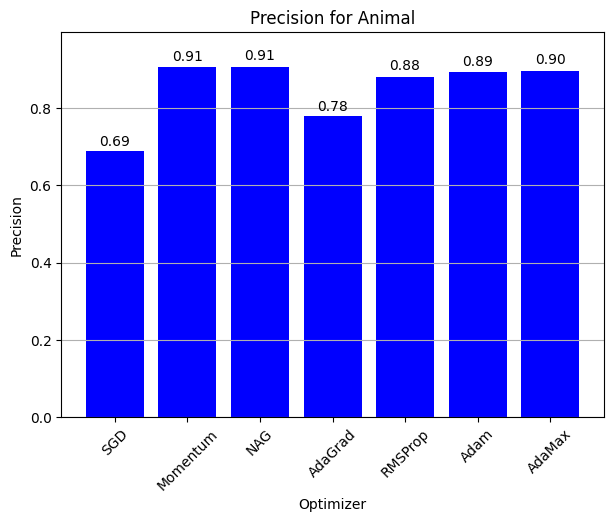

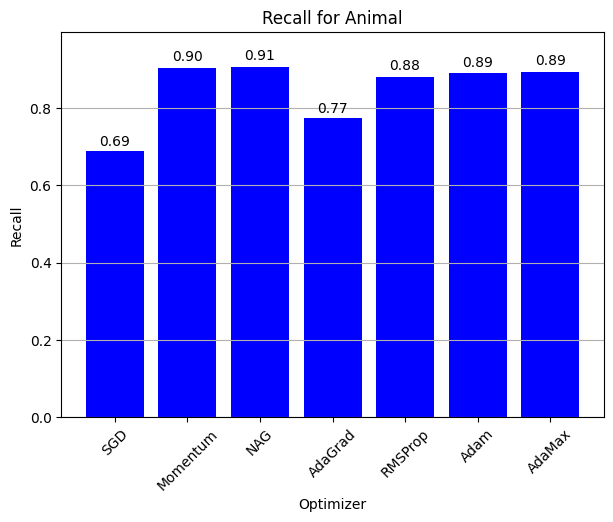

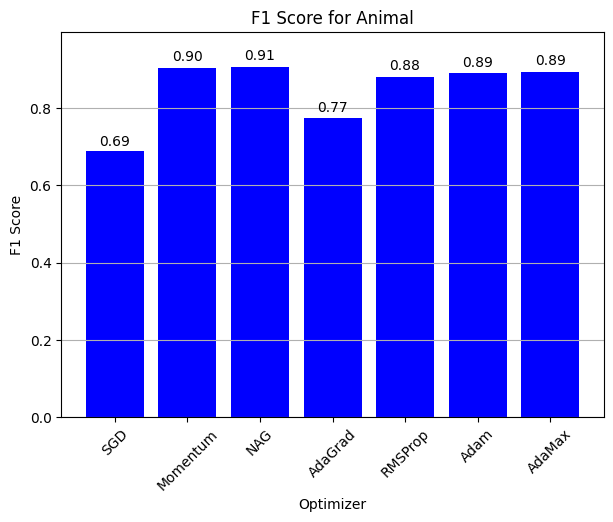

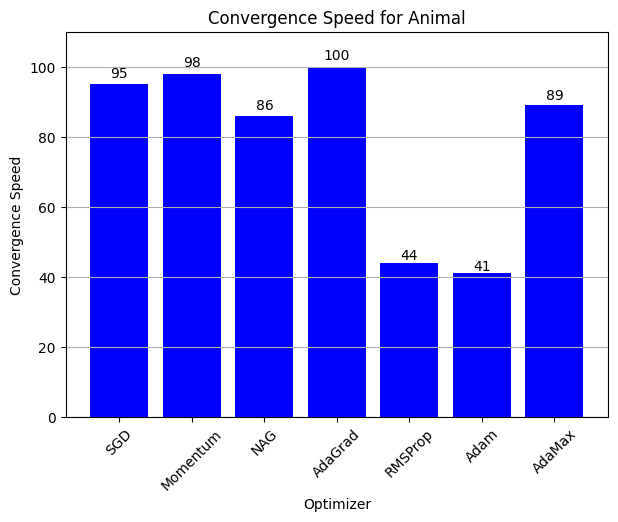

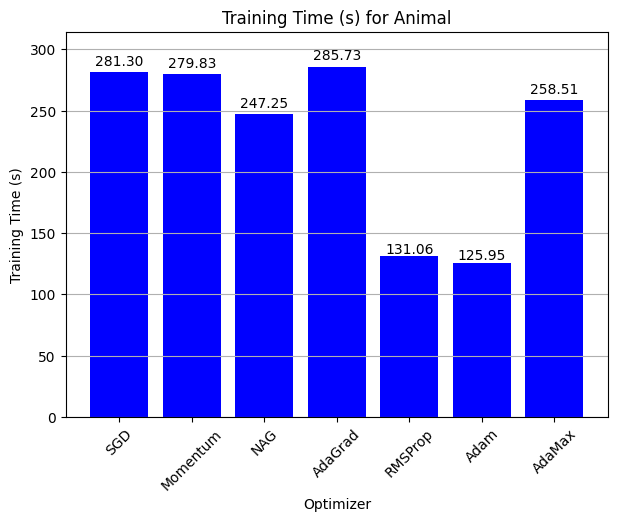

In [ ]:
metrics = ["Test Accuracy", "Precision", "Recall", "F1 Score", "Convergence Speed", "Training Time (s)"]

for metric in metrics:
    plt.figure(figsize=(7, 5))

    subset = results_df[results_df["Dataset"] == "Animal"]

    bars = plt.bar(subset["Optimizer"], subset[metric], color='blue')
    plt.title(f"{metric} for Animal")
    plt.xlabel("Optimizer")
    plt.ylabel(metric)
    plt.xticks(rotation=45)
    plt.grid(axis='y')

    plt.ylim(0, max(subset[metric]) * 1.1)

    for bar in bars:
        yval = bar.get_height()
        if metric == "Convergence Speed":
            plt.text(bar.get_x() + bar.get_width() / 2, yval * 1.02, f'{int(yval)}', ha='center')
        else:
            plt.text(bar.get_x() + bar.get_width() / 2, yval * 1.02, f'{yval:.2f}', ha='center')

    plt.savefig(f"{metric}_Animal_comparison.png")

    plt.show()

**RAPORT KLASYFIKACJI DLA KAŻDEGO Z OPTYMALIZATORÓW**

In [ ]:
for optimizer_name, report in classification_reports.items():
    print(f"\nClassification Report - {optimizer_name} (Animal):\n")
    print(report)



Classification Report - SGD (Animal):

              precision    recall  f1-score   support

           0       0.61      0.61      0.61       456
           1       0.66      0.66      0.66       452
           2       0.71      0.66      0.68       448
           3       0.73      0.82      0.78       456
           4       0.74      0.69      0.72       440

    accuracy                           0.69      2252
   macro avg       0.69      0.69      0.69      2252
weighted avg       0.69      0.69      0.69      2252


Classification Report - Momentum (Animal):

              precision    recall  f1-score   support

           0       0.81      0.85      0.83       456
           1       0.90      0.80      0.85       452
           2       0.84      0.89      0.86       448
           3       1.00      1.00      1.00       456
           4       0.99      0.98      0.99       440

    accuracy                           0.90      2252
   macro avg       0.91      0.90      0.90   

**MACIERZ POMYŁEK DLA SIEDMIU OPTYMALIZATORÓW**

<Figure size 1170x830 with 0 Axes>

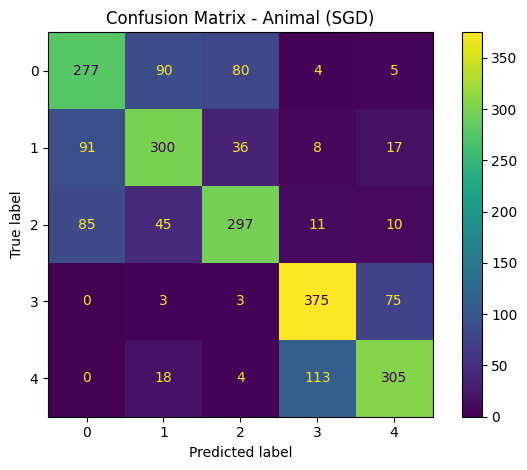

<Figure size 1170x830 with 0 Axes>

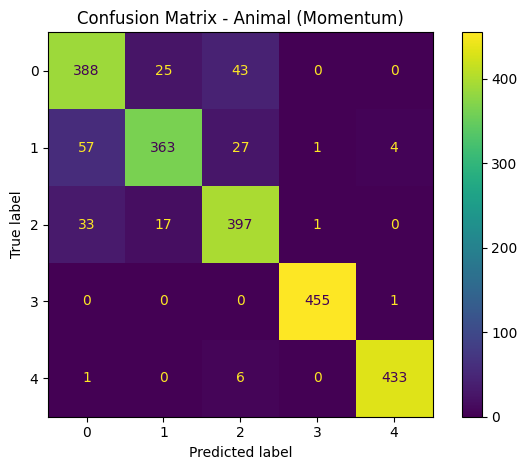

<Figure size 1170x830 with 0 Axes>

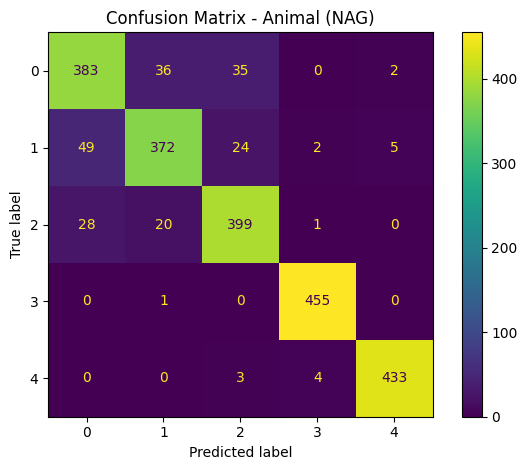

<Figure size 1170x830 with 0 Axes>

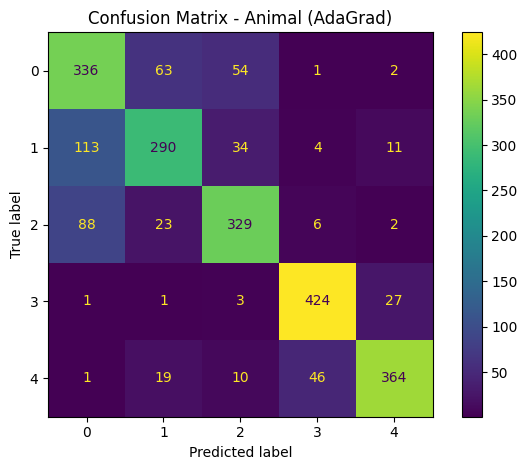

<Figure size 1170x830 with 0 Axes>

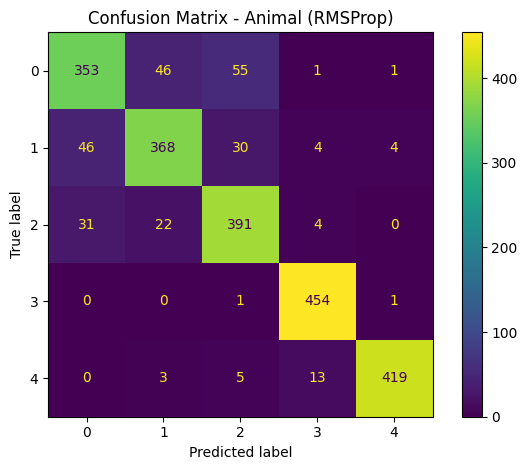

<Figure size 1170x830 with 0 Axes>

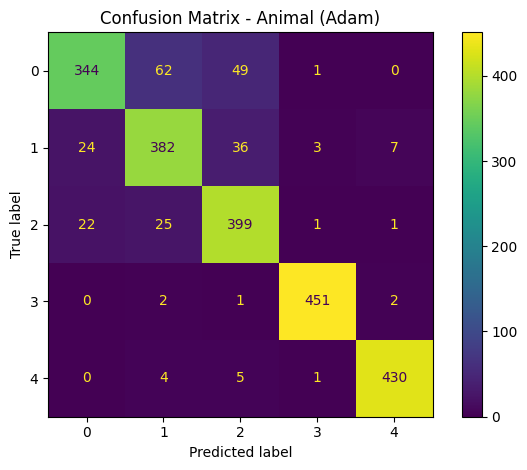

<Figure size 1170x830 with 0 Axes>

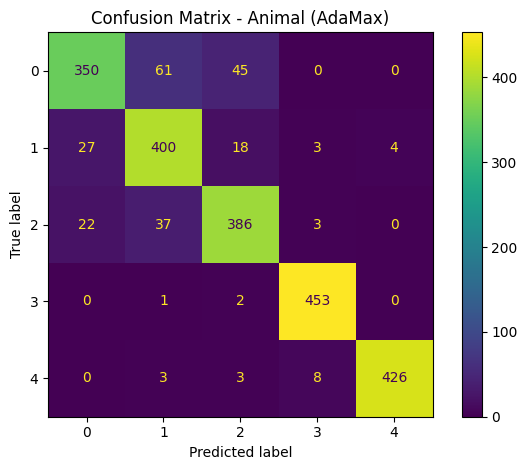

In [ ]:
for optimizer_name, cm in confusion_matrices.items():
    plt.figure(figsize=(11.7, 8.3))
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=np.arange(num_classes))
    disp.plot(cmap='viridis', values_format='d')
    plt.title(f"Confusion Matrix - Animal ({optimizer_name})")
    plt.grid(False)
    plt.tight_layout()
    plt.show()


**KRZYWE ROC-AUC DLA SIEDMIU OPTYMALIZATORÓW**

In [ ]:
plt.figure(figsize=(11.7, 8.3))

y_test_binarized = label_binarize(y_test, classes=np.arange(num_classes))

for optimizer_name, y_pred_prob in y_pred_probs.items():
    print(f"Generowanie krzywej ROC-AUC dla optymalizatora: {optimizer_name}")

    fpr_macro = np.unique(np.concatenate([
        roc_curve(y_test_binarized[:, j], y_pred_prob[:, j])[0]
        for j in range(num_classes) if np.sum(y_test_binarized[:, j]) > 0
    ]))

    mean_tpr = np.zeros_like(fpr_macro)

    for j in range(num_classes):
        if np.sum(y_test_binarized[:, j]) == 0:
            continue
        fpr, tpr, _ = roc_curve(y_test_binarized[:, j], y_pred_prob[:, j])
        mean_tpr += np.interp(fpr_macro, fpr, tpr)

    mean_tpr /= num_classes
    auc_macro = auc(fpr_macro, mean_tpr)

    plt.plot(fpr_macro, mean_tpr, linestyle='-', label=f'{optimizer_name} (Macro AUC = {auc_macro:.2f})', linewidth=2)

plt.plot([0, 1], [0, 1], color='gray', linestyle='--', label='Losowa klasyfikacja')


**WYŚWIETLENIE KRZYWYCH**

Generowanie krzywej ROC-AUC dla optymalizatora: SGD
Generowanie krzywej ROC-AUC dla optymalizatora: Momentum
Generowanie krzywej ROC-AUC dla optymalizatora: NAG
Generowanie krzywej ROC-AUC dla optymalizatora: AdaGrad
Generowanie krzywej ROC-AUC dla optymalizatora: RMSProp
Generowanie krzywej ROC-AUC dla optymalizatora: Adam
Generowanie krzywej ROC-AUC dla optymalizatora: AdaMax


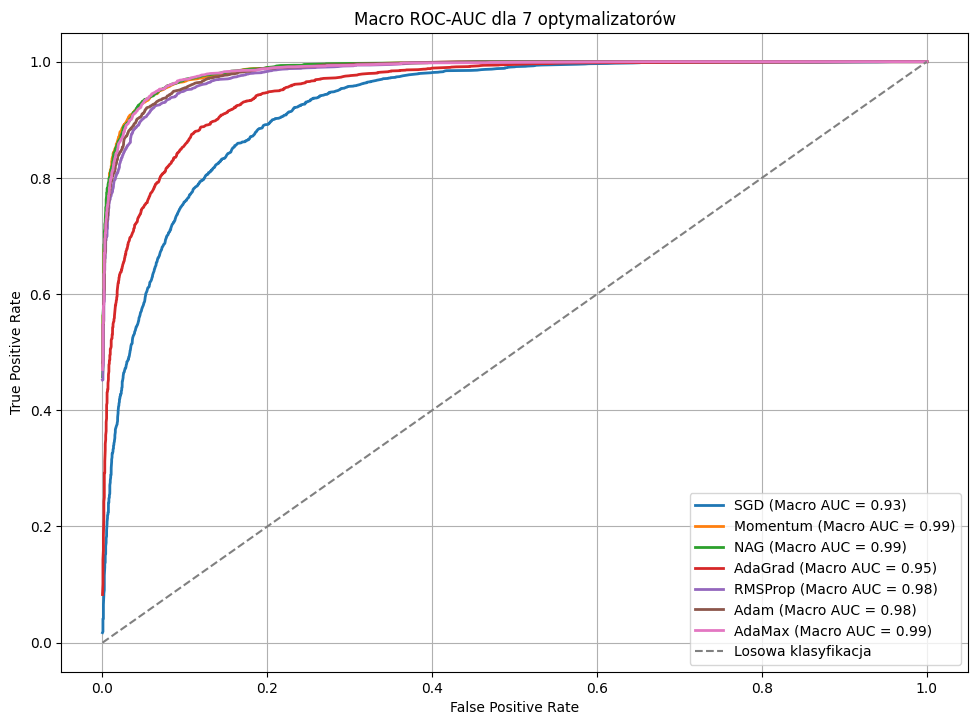

In [ ]:

plt.title("Macro ROC-AUC dla 7 optymalizatorów")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.legend(loc="lower right")
plt.grid(True)

plt.savefig("Macro_ROC_AUC_5_classes.png")
plt.show()


# **MODEL ŚREDNIOZAAWANSOWANY - 5 WARSTW CONV**

**ARCHITEKTURA MODELU PIĘCIOWARSTWOWEGO**

In [ ]:
def five_layer_model(input_shape, num_classes):
    model = models.Sequential([
        layers.Conv2D(64, (3, 3), activation='relu', input_shape=input_shape),
        layers.BatchNormalization(),
        layers.MaxPooling2D((2, 2)),
        layers.Dropout(0.3),

        layers.Conv2D(128, (3, 3), activation='relu'),
        layers.BatchNormalization(),
        layers.MaxPooling2D((2, 2)),
        layers.Dropout(0.3),

        layers.Conv2D(256, (3, 3), activation='relu'),
        layers.BatchNormalization(),
        layers.MaxPooling2D((2, 2)),
        layers.Dropout(0.4),

        layers.Conv2D(512, (3, 3), activation='relu'),
        layers.BatchNormalization(),
        layers.MaxPooling2D((2, 2)),
        layers.Dropout(0.4),


        layers.Conv2D(1024, (3, 3), activation='relu'),
        layers.BatchNormalization(),
        layers.MaxPooling2D((2, 2)),
        layers.Dropout(0.4),

        layers.GlobalAveragePooling2D(),
        layers.Dense(256, activation='relu'),
        layers.Dropout(0.5),
        layers.Dense(num_classes, activation='softmax')
    ])
    return model

**PROCES TRENINGU MODELU**

In [ ]:
EPOCHS = 100
results = []
classification_reports = {}
y_pred_probs = {}
confusion_matrices = {}

optimizers = {
    'SGD': SGD(learning_rate=0.01),
    'Momentum': SGD(learning_rate=0.01, momentum=0.9),
    'NAG': SGD(learning_rate=0.01, momentum=0.9, nesterov=True),
    'AdaGrad': Adagrad(learning_rate=0.01),
    'RMSProp': RMSprop(learning_rate=0.001),
    'Adam': Adam(learning_rate=0.001),
    'AdaMax': Adamax(learning_rate=0.001),
}



for optimizer_name, optimizer in optimizers.items():
        print(f"\nTrening na zbiorze: Animal z optymalizatorem: {optimizer_name}")

        model = five_layer_model(input_shape, num_classes)
        model.compile(optimizer=optimizer,
                      loss='sparse_categorical_crossentropy',
                      metrics=['accuracy'])

        early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

        start_time = time.time()
        history = model.fit(
            X_train, y_train,
            validation_data=(X_val, y_val),
            epochs=EPOCHS,
            callbacks=[early_stopping],
            verbose=1
        )
        elapsed_time = time.time() - start_time

        test_loss, test_accuracy = model.evaluate(X_test, y_test, verbose=0)
        y_pred = np.argmax(model.predict(X_test), axis=-1)
        y_true = y_test
        precision, recall, f1, _ = precision_recall_fscore_support(y_true, y_pred, average="weighted",zero_division=0)
        accuracy = accuracy_score(y_true, y_pred)

        results.append({
            "Dataset": "Animal",
            "Optimizer": optimizer_name,
            "Test Accuracy": accuracy,
            "Precision": precision,
            "Recall": recall,
            "F1 Score": f1,
            "Convergence Speed": len(history.history['loss']),
            "Training Time (s)": elapsed_time,
            "Test Loss": test_loss
        })
        classification_reports[optimizer_name] = classification_report(y_true, y_pred, target_names=[str(i) for i in np.unique(y_true)], zero_division=0)

        y_pred_probs[optimizer_name] = model.predict(X_test)
        confusion_matrices[optimizer_name] = confusion_matrix(y_true, y_pred)



Trening na zbiorze: Animal z optymalizatorem: SGD


/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
328/328 ━━━━━━━━━━━━━━━━━━━━ 28s 53ms/step - accuracy: 0.4125 - loss: 1.5829 - val_accuracy: 0.2036 - val_loss: 5.3406
Epoch 2/100
328/328 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.6014 - loss: 1.0018 - val_accuracy: 0.3822 - val_loss: 2.9070
Epoch 3/100
328/328 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.6649 - loss: 0.8524 - val_accuracy: 0.5204 - val_loss: 1.8895
Epoch 4/100
328/328 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step - accuracy: 0.7083 - loss: 0.7526 - val_accuracy: 0.6071 - val_loss: 1.5649
Epoch 5/100
328/328 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step - accuracy: 0.7123 - loss: 0.7133 - val_accuracy: 0.2742 - val_loss: 5.6073
Epoch 6/100
328/328 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step - accuracy: 0.7428 - loss: 0.6527 - val_accuracy: 0.3929 - val_loss: 4.4374
Epoch 7/100
328/328 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step - accuracy: 0.7482 - loss: 0.6318 - val_accuracy: 0.6853 - val_loss: 1.1211
Epoch 8/100
328/328 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step - accuracy: 0.7781 - loss: 0.5627 -

/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
328/328 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - accuracy: 0.3772 - loss: 1.7586 - val_accuracy: 0.2027 - val_loss: 6.8052
Epoch 2/100
328/328 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.5743 - loss: 1.1004 - val_accuracy: 0.2769 - val_loss: 4.4976
Epoch 3/100
328/328 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.6521 - loss: 0.9122 - val_accuracy: 0.6667 - val_loss: 1.0071
Epoch 4/100
328/328 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.6939 - loss: 0.8007 - val_accuracy: 0.6098 - val_loss: 1.1548
Epoch 5/100
328/328 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.7207 - loss: 0.7191 - val_accuracy: 0.6902 - val_loss: 0.8669
Epoch 6/100
328/328 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.7381 - loss: 0.6868 - val_accuracy: 0.4293 - val_loss: 2.4832
Epoch 7/100
328/328 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.7646 - loss: 0.6324 - val_accuracy: 0.4942 - val_loss: 1.6206
Epoch 8/100
328/328 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.7871 - loss: 0.5697 -

/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
328/328 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - accuracy: 0.4124 - loss: 1.6236 - val_accuracy: 0.4089 - val_loss: 2.3419
Epoch 2/100
328/328 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.6208 - loss: 0.9711 - val_accuracy: 0.5444 - val_loss: 1.0931
Epoch 3/100
328/328 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.6862 - loss: 0.8155 - val_accuracy: 0.5969 - val_loss: 1.1615
Epoch 4/100
328/328 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.7361 - loss: 0.6988 - val_accuracy: 0.6107 - val_loss: 1.8057
Epoch 5/100
328/328 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.7819 - loss: 0.6100 - val_accuracy: 0.6240 - val_loss: 1.4597
Epoch 6/100
328/328 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.7902 - loss: 0.5629 - val_accuracy: 0.7236 - val_loss: 0.7190
Epoch 7/100
328/328 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.8071 - loss: 0.5188 - val_accuracy: 0.8178 - val_loss: 0.5097
Epoch 8/100
328/328 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.8176 - loss: 0.4807 -

/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
328/328 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - accuracy: 0.4413 - loss: 1.6087 - val_accuracy: 0.2542 - val_loss: 4.3594
Epoch 2/100
328/328 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.6480 - loss: 0.8711 - val_accuracy: 0.4689 - val_loss: 2.5777
Epoch 3/100
328/328 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.7200 - loss: 0.6904 - val_accuracy: 0.5893 - val_loss: 1.4528
Epoch 4/100
328/328 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.7577 - loss: 0.6251 - val_accuracy: 0.6364 - val_loss: 1.2803
Epoch 5/100
328/328 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.7871 - loss: 0.5413 - val_accuracy: 0.6147 - val_loss: 1.4637
Epoch 6/100
328/328 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.8024 - loss: 0.4980 - val_accuracy: 0.5676 - val_loss: 1.9537
Epoch 7/100
328/328 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.8103 - loss: 0.4895 - val_accuracy: 0.7311 - val_loss: 0.9192
Epoch 8/100
328/328 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.8361 - loss: 0.4233 -

/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
328/328 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - accuracy: 0.4293 - loss: 2.1062 - val_accuracy: 0.2907 - val_loss: 2.7457
Epoch 2/100
328/328 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.6991 - loss: 0.7925 - val_accuracy: 0.7093 - val_loss: 0.8514
Epoch 3/100
328/328 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.7785 - loss: 0.5974 - val_accuracy: 0.7240 - val_loss: 1.0548
Epoch 4/100
328/328 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.8062 - loss: 0.5207 - val_accuracy: 0.7796 - val_loss: 0.6602
Epoch 5/100
328/328 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.8330 - loss: 0.4675 - val_accuracy: 0.8089 - val_loss: 0.5858
Epoch 6/100
328/328 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.8486 - loss: 0.4133 - val_accuracy: 0.8480 - val_loss: 0.4727
Epoch 7/100
328/328 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.8711 - loss: 0.3507 - val_accuracy: 0.7391 - val_loss: 0.7255
Epoch 8/100
328/328 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.8825 - loss: 0.3286 -

/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
328/328 ━━━━━━━━━━━━━━━━━━━━ 24s 43ms/step - accuracy: 0.4756 - loss: 1.6496 - val_accuracy: 0.2587 - val_loss: 1.9238
Epoch 2/100
328/328 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.6897 - loss: 0.7903 - val_accuracy: 0.5431 - val_loss: 1.4183
Epoch 3/100
328/328 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.7651 - loss: 0.6102 - val_accuracy: 0.8227 - val_loss: 0.4543
Epoch 4/100
328/328 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.7979 - loss: 0.5145 - val_accuracy: 0.8164 - val_loss: 0.4508
Epoch 5/100
328/328 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.8249 - loss: 0.4457 - val_accuracy: 0.7938 - val_loss: 0.6756
Epoch 6/100
328/328 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.8488 - loss: 0.4125 - val_accuracy: 0.7382 - val_loss: 0.6313
Epoch 7/100
328/328 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.8583 - loss: 0.3698 - val_accuracy: 0.8240 - val_loss: 0.4558
Epoch 8/100
328/328 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.8758 - loss: 0.3255 -

/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
328/328 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step - accuracy: 0.4595 - loss: 1.8236 - val_accuracy: 0.1996 - val_loss: 3.5881
Epoch 2/100
328/328 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.6947 - loss: 0.7994 - val_accuracy: 0.5751 - val_loss: 1.3709
Epoch 3/100
328/328 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.7438 - loss: 0.6505 - val_accuracy: 0.7036 - val_loss: 0.9156
Epoch 4/100
328/328 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.7839 - loss: 0.5560 - val_accuracy: 0.7293 - val_loss: 0.7649
Epoch 5/100
328/328 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.8113 - loss: 0.4762 - val_accuracy: 0.7956 - val_loss: 0.5838
Epoch 6/100
328/328 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.8343 - loss: 0.4256 - val_accuracy: 0.8413 - val_loss: 0.4174
Epoch 7/100
328/328 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.8411 - loss: 0.4044 - val_accuracy: 0.8413 - val_loss: 0.4010
Epoch 8/100
328/328 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.8699 - loss: 0.3360 -

**ZAPIS WYNIKÓW DO CSV**

In [ ]:
results_df = pd.DataFrame(results)
results_df.to_csv("training_results.csv", index=False)

**PREZENTACJA WYNIKÓW W FORMIE WYKRESÓW**

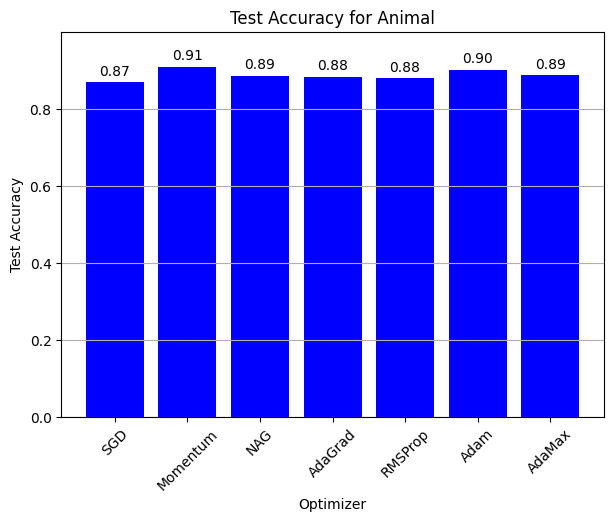

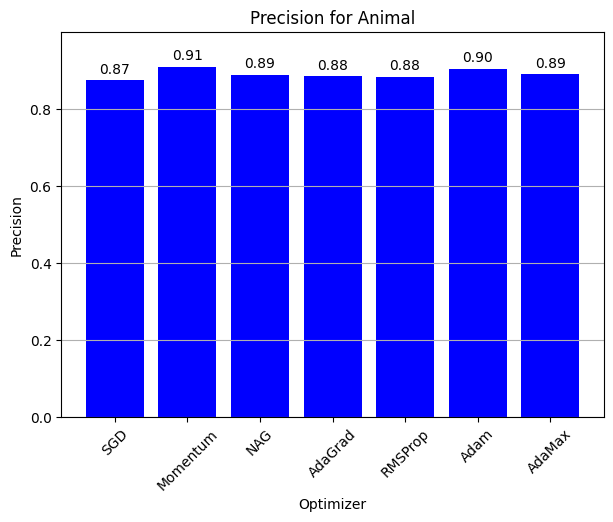

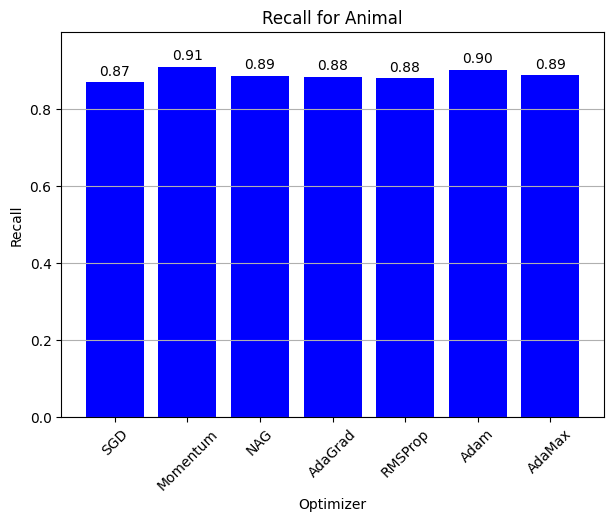

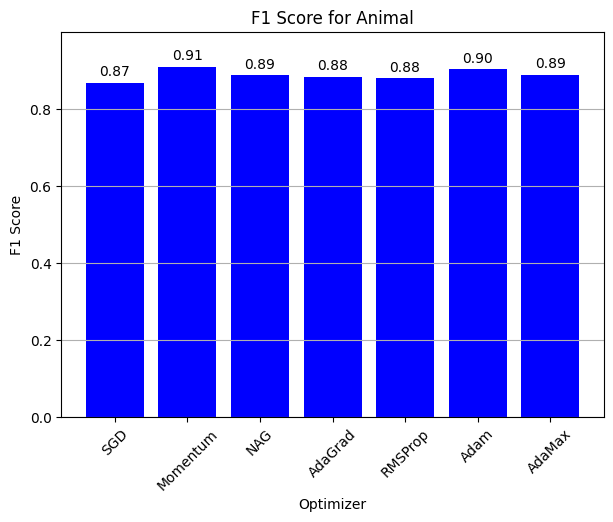

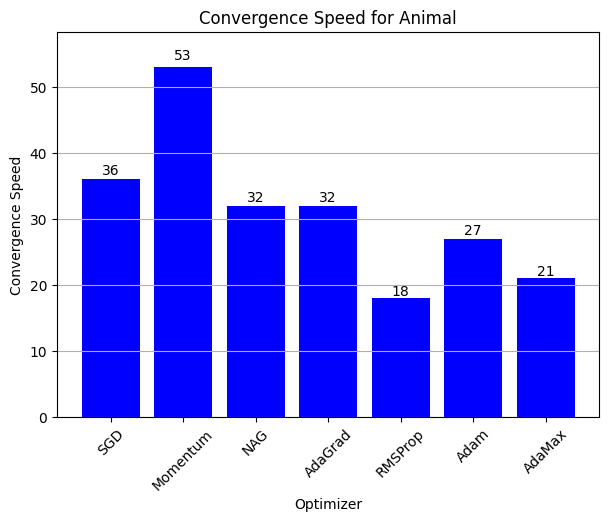

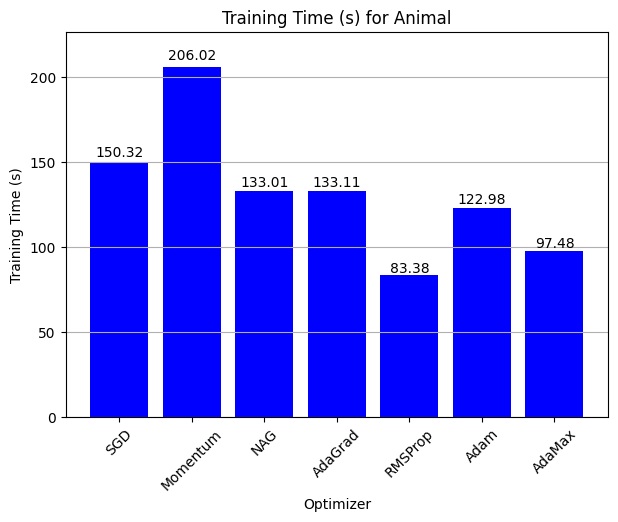

In [ ]:
metrics = ["Test Accuracy", "Precision", "Recall", "F1 Score", "Convergence Speed", "Training Time (s)"]

for metric in metrics:
    plt.figure(figsize=(7, 5))

    subset = results_df[results_df["Dataset"] == "Animal"]

    bars = plt.bar(subset["Optimizer"], subset[metric], color='blue')
    plt.title(f"{metric} for Animal")
    plt.xlabel("Optimizer")
    plt.ylabel(metric)
    plt.xticks(rotation=45)
    plt.grid(axis='y')

    plt.ylim(0, max(subset[metric]) * 1.1)

    for bar in bars:
        yval = bar.get_height()
        if metric == "Convergence Speed":
            plt.text(bar.get_x() + bar.get_width() / 2, yval * 1.02, f'{int(yval)}', ha='center')
        else:
            plt.text(bar.get_x() + bar.get_width() / 2, yval * 1.02, f'{yval:.2f}', ha='center')

    plt.savefig(f"{metric}_Animal_comparison.png")

    plt.show()

**RAPORT KLASYFIKACJI DLA SIEDMIU OPTYMALIZATORÓW**

In [ ]:
for optimizer_name, report in classification_reports.items():
    print(f"\nClassification Report - {optimizer_name} (Animal):\n")
    print(report)


Classification Report - SGD (Animal):

              precision    recall  f1-score   support

           0       0.74      0.83      0.78       456
           1       0.91      0.68      0.78       452
           2       0.80      0.84      0.82       448
           3       0.97      1.00      0.98       456
           4       0.96      1.00      0.98       440

    accuracy                           0.87      2252
   macro avg       0.87      0.87      0.87      2252
weighted avg       0.87      0.87      0.87      2252


Classification Report - Momentum (Animal):

              precision    recall  f1-score   support

           0       0.84      0.85      0.85       456
           1       0.89      0.82      0.86       452
           2       0.86      0.88      0.87       448
           3       0.98      1.00      0.99       456
           4       0.97      0.99      0.98       440

    accuracy                           0.91      2252
   macro avg       0.91      0.91      0.91   

**MACIERZ POMYŁEK DLA SIEDIU OPTYMALIZATORÓW**

<Figure size 1170x830 with 0 Axes>

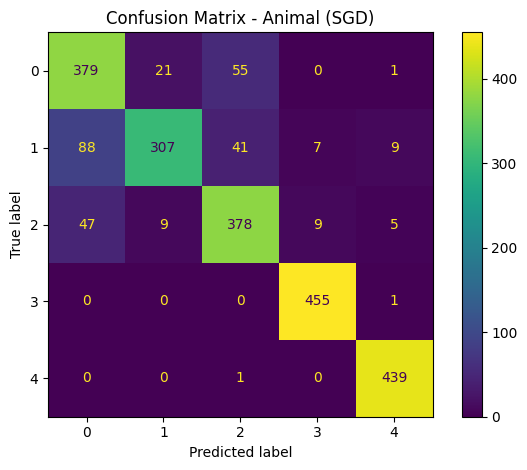

<Figure size 1170x830 with 0 Axes>

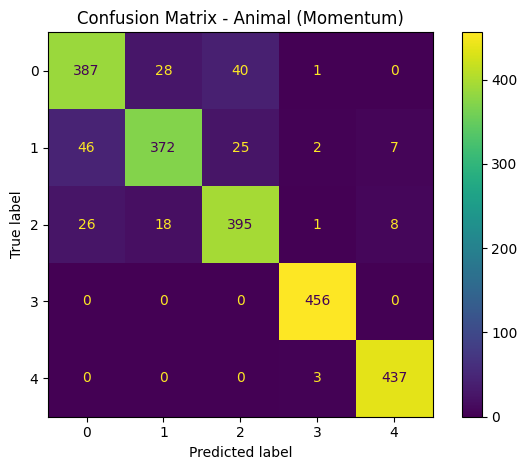

<Figure size 1170x830 with 0 Axes>

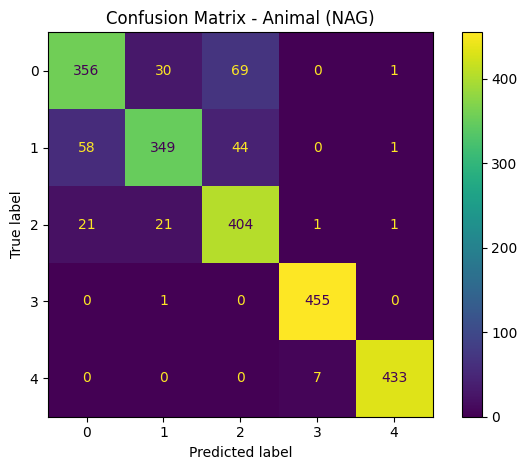

<Figure size 1170x830 with 0 Axes>

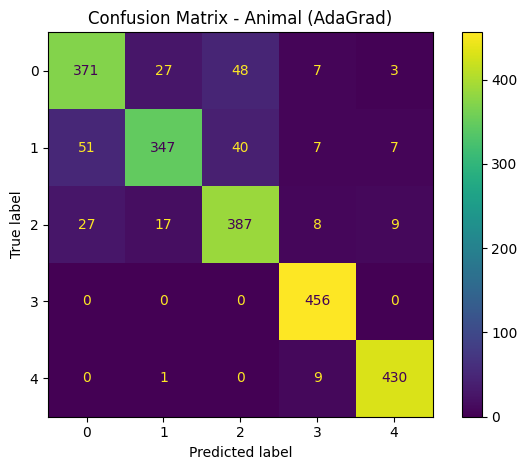

<Figure size 1170x830 with 0 Axes>

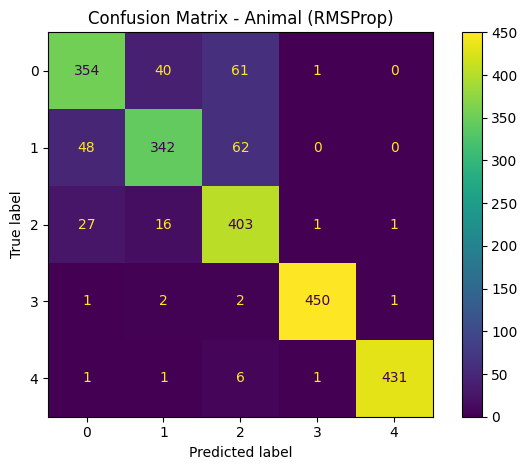

<Figure size 1170x830 with 0 Axes>

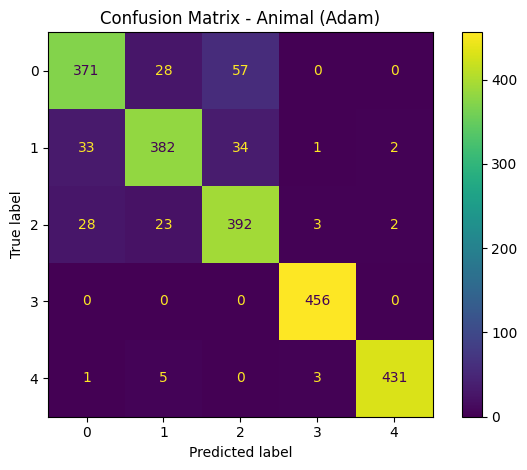

<Figure size 1170x830 with 0 Axes>

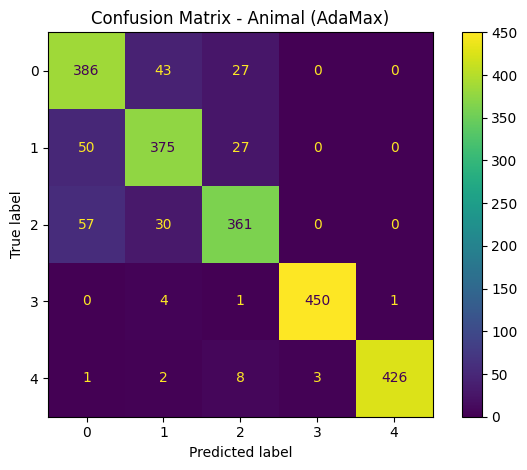

In [ ]:
for optimizer_name, cm in confusion_matrices.items():
    plt.figure(figsize=(11.7, 8.3))
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=np.arange(num_classes))
    disp.plot(cmap='viridis', values_format='d')
    plt.title(f"Confusion Matrix - Animal ({optimizer_name})")
    plt.grid(False)
    plt.tight_layout()
    plt.show()

**KRZYWE ROC-AUC DLA SIEDMIU OPTYMALIZATORÓW**

Generowanie krzywej ROC-AUC dla optymalizatora: SGD
Generowanie krzywej ROC-AUC dla optymalizatora: Momentum
Generowanie krzywej ROC-AUC dla optymalizatora: NAG
Generowanie krzywej ROC-AUC dla optymalizatora: AdaGrad
Generowanie krzywej ROC-AUC dla optymalizatora: RMSProp
Generowanie krzywej ROC-AUC dla optymalizatora: Adam
Generowanie krzywej ROC-AUC dla optymalizatora: AdaMax


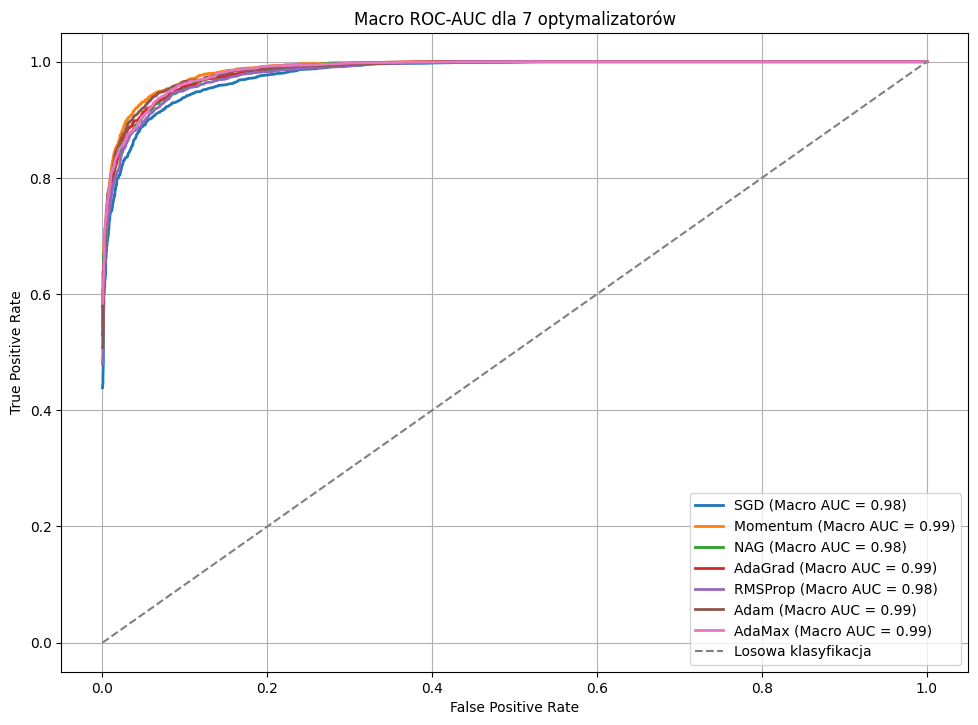

In [ ]:
plt.figure(figsize=(11.7, 8.3))

y_test_binarized = label_binarize(y_test, classes=np.arange(num_classes))

for optimizer_name, y_pred_prob in y_pred_probs.items():
    print(f"Generowanie krzywej ROC-AUC dla optymalizatora: {optimizer_name}")

    fpr_macro = np.unique(np.concatenate([
        roc_curve(y_test_binarized[:, j], y_pred_prob[:, j])[0]
        for j in range(num_classes) if np.sum(y_test_binarized[:, j]) > 0
    ]))

    mean_tpr = np.zeros_like(fpr_macro)

    for j in range(num_classes):
        if np.sum(y_test_binarized[:, j]) == 0:
            continue
        fpr, tpr, _ = roc_curve(y_test_binarized[:, j], y_pred_prob[:, j])
        mean_tpr += np.interp(fpr_macro, fpr, tpr)

    mean_tpr /= num_classes
    auc_macro = auc(fpr_macro, mean_tpr)

    plt.plot(fpr_macro, mean_tpr, linestyle='-', label=f'{optimizer_name} (Macro AUC = {auc_macro:.2f})', linewidth=2)

plt.plot([0, 1], [0, 1], color='gray', linestyle='--', label='Losowa klasyfikacja')

plt.title("Macro ROC-AUC dla 7 optymalizatorów")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.legend(loc="lower right")
plt.grid(True)

plt.savefig("Macro_ROC_AUC_5_classes.png")
plt.show()


# **MODEL ZAAWANSOWANY - 7 WARSTW CONV**

**ARCHITEKTURA MODELU SIEDMIOWARSTWOWEGO**

In [ ]:
def seven_layer_model(input_shape, num_classes):
    model = models.Sequential([

        layers.Conv2D(64, (3, 3), activation='relu', padding='same', input_shape=input_shape),
        layers.BatchNormalization(),
        layers.MaxPooling2D((2, 2)),
        layers.Dropout(0.2),


        layers.Conv2D(128, (3, 3), activation='relu', padding='same'),
        layers.BatchNormalization(),
        layers.MaxPooling2D((2, 2)),
        layers.Dropout(0.3),


        layers.Conv2D(256, (3, 3), activation='relu', padding='same'),
        layers.BatchNormalization(),
        layers.MaxPooling2D((2, 2)),
        layers.Dropout(0.3),


        layers.Conv2D(512, (3, 3), activation='relu', padding='same'),
        layers.BatchNormalization(),
        layers.MaxPooling2D((2, 2)),
        layers.Dropout(0.4),


        layers.Conv2D(512, (3, 3), activation='relu', padding='same'),
        layers.BatchNormalization(),
        layers.MaxPooling2D((2, 2)),
        layers.Dropout(0.4),


        layers.Conv2D(1024, (3, 3), activation='relu', padding='same'),
        layers.BatchNormalization(),
        layers.Dropout(0.5),


        layers.Conv2D(1024, (3, 3), activation='relu', padding='same'),
        layers.BatchNormalization(),
        layers.Dropout(0.5),


        layers.GlobalAveragePooling2D(),
        layers.Dense(512, activation='relu'),
        layers.Dropout(0.5),
        layers.Dense(num_classes, activation='softmax')
    ])
    return model


**PROCES TRENINGU MODELU**

In [ ]:
EPOCHS = 100
results = []
classification_reports = {}
y_pred_probs = {}
confusion_matrices = {}

optimizers = {
    'SGD': SGD(learning_rate=0.01),
    'Momentum': SGD(learning_rate=0.01, momentum=0.9),
    'NAG': SGD(learning_rate=0.01, momentum=0.9, nesterov=True),
    'AdaGrad': Adagrad(learning_rate=0.01),
    'RMSProp': RMSprop(learning_rate=0.001),
    'Adam': Adam(learning_rate=0.001),
    'AdaMax': Adamax(learning_rate=0.001),
}
for optimizer_name, optimizer in optimizers.items():
        print(f"\nTrening na zbiorze: Animal z optymalizatorem: {optimizer_name}")

        model = seven_layer_model(input_shape, num_classes)
        model.compile(optimizer=optimizer,
                      loss='sparse_categorical_crossentropy',
                      metrics=['accuracy'])

        early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

        start_time = time.time()
        history = model.fit(
            X_train, y_train,
            validation_data=(X_val, y_val),
            epochs=EPOCHS,
            callbacks=[early_stopping],
            verbose=1
        )
        elapsed_time = time.time() - start_time

        test_loss, test_accuracy = model.evaluate(X_test, y_test, verbose=0)
        y_pred = np.argmax(model.predict(X_test), axis=-1)
        y_true = y_test
        precision, recall, f1, _ = precision_recall_fscore_support(y_true, y_pred, average="weighted",zero_division=0)
        accuracy = accuracy_score(y_true, y_pred)

        results.append({
            "Dataset": "Animal",
            "Optimizer": optimizer_name,
            "Test Accuracy": accuracy,
            "Precision": precision,
            "Recall": recall,
            "F1 Score": f1,
            "Convergence Speed": len(history.history['loss']),
            "Training Time (s)": elapsed_time,
            "Test Loss": test_loss
        })
        classification_reports[optimizer_name] = classification_report(y_true, y_pred, target_names=[str(i) for i in np.unique(y_true)], zero_division=0)

        y_pred_probs[optimizer_name] = model.predict(X_test)
        confusion_matrices[optimizer_name] = confusion_matrix(y_true, y_pred)


Trening na zbiorze: Animal z optymalizatorem: SGD


/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
328/328 ━━━━━━━━━━━━━━━━━━━━ 40s 74ms/step - accuracy: 0.3632 - loss: 1.4682 - val_accuracy: 0.3080 - val_loss: 3.2874
Epoch 2/100
328/328 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.5716 - loss: 1.0431 - val_accuracy: 0.3676 - val_loss: 2.9721
Epoch 3/100
328/328 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.6537 - loss: 0.8731 - val_accuracy: 0.2418 - val_loss: 5.1350
Epoch 4/100
328/328 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.7119 - loss: 0.7238 - val_accuracy: 0.5418 - val_loss: 1.4809
Epoch 5/100
328/328 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.7266 - loss: 0.6875 - val_accuracy: 0.6116 - val_loss: 1.5369
Epoch 6/100
328/328 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7612 - loss: 0.6038 - val_accuracy: 0.5729 - val_loss: 1.5707
Epoch 7/100
328/328 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7646 - loss: 0.5779 - val_accuracy: 0.5853 - val_loss: 1.6881
Epoch 8/100
328/328 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.7947 - loss: 0.5361 -

/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
328/328 ━━━━━━━━━━━━━━━━━━━━ 25s 43ms/step - accuracy: 0.4126 - loss: 1.5069 - val_accuracy: 0.4991 - val_loss: 1.3617
Epoch 2/100
328/328 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.6550 - loss: 0.8799 - val_accuracy: 0.3880 - val_loss: 2.5336
Epoch 3/100
328/328 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.7440 - loss: 0.6587 - val_accuracy: 0.7453 - val_loss: 0.7974
Epoch 4/100
328/328 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.7770 - loss: 0.5646 - val_accuracy: 0.5351 - val_loss: 1.2759
Epoch 5/100
328/328 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.8141 - loss: 0.4844 - val_accuracy: 0.7787 - val_loss: 0.6254
Epoch 6/100
328/328 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.8373 - loss: 0.4229 - val_accuracy: 0.8347 - val_loss: 0.4838
Epoch 7/100
328/328 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.8472 - loss: 0.3977 - val_accuracy: 0.7471 - val_loss: 0.7991
Epoch 8/100
328/328 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.8553 - loss: 0.3575 -

/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
328/328 ━━━━━━━━━━━━━━━━━━━━ 25s 43ms/step - accuracy: 0.4355 - loss: 1.4637 - val_accuracy: 0.3689 - val_loss: 1.8750
Epoch 2/100
328/328 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.7023 - loss: 0.7608 - val_accuracy: 0.6116 - val_loss: 1.2676
Epoch 3/100
328/328 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.7623 - loss: 0.5928 - val_accuracy: 0.4818 - val_loss: 2.3158
Epoch 4/100
328/328 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.8001 - loss: 0.5346 - val_accuracy: 0.7742 - val_loss: 0.5859
Epoch 5/100
328/328 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.8146 - loss: 0.4687 - val_accuracy: 0.7791 - val_loss: 0.5927
Epoch 6/100
328/328 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.8455 - loss: 0.3991 - val_accuracy: 0.8236 - val_loss: 0.4776
Epoch 7/100
328/328 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.8588 - loss: 0.3775 - val_accuracy: 0.8422 - val_loss: 0.4063
Epoch 8/100
328/328 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.8719 - loss: 0.3245 -

/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
328/328 ━━━━━━━━━━━━━━━━━━━━ 25s 44ms/step - accuracy: 0.4333 - loss: 1.3950 - val_accuracy: 0.3551 - val_loss: 2.5367
Epoch 2/100
328/328 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.6700 - loss: 0.8368 - val_accuracy: 0.3893 - val_loss: 2.5341
Epoch 3/100
328/328 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.7512 - loss: 0.6374 - val_accuracy: 0.7204 - val_loss: 0.7970
Epoch 4/100
328/328 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.7876 - loss: 0.5458 - val_accuracy: 0.6867 - val_loss: 0.9288
Epoch 5/100
328/328 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.8192 - loss: 0.4784 - val_accuracy: 0.6107 - val_loss: 1.4211
Epoch 6/100
328/328 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.8364 - loss: 0.4307 - val_accuracy: 0.8204 - val_loss: 0.5449
Epoch 7/100
328/328 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.8369 - loss: 0.4026 - val_accuracy: 0.7622 - val_loss: 0.8037
Epoch 8/100
328/328 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.8518 - loss: 0.3734 -

/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
328/328 ━━━━━━━━━━━━━━━━━━━━ 25s 44ms/step - accuracy: 0.3890 - loss: 2.2480 - val_accuracy: 0.2480 - val_loss: 4.8112
Epoch 2/100
328/328 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step - accuracy: 0.7189 - loss: 0.7306 - val_accuracy: 0.7502 - val_loss: 0.6637
Epoch 3/100
328/328 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.7959 - loss: 0.5308 - val_accuracy: 0.7382 - val_loss: 0.8487
Epoch 4/100
328/328 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.8289 - loss: 0.4372 - val_accuracy: 0.7111 - val_loss: 0.9184
Epoch 5/100
328/328 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.8444 - loss: 0.3967 - val_accuracy: 0.8200 - val_loss: 0.4619
Epoch 6/100
328/328 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.8677 - loss: 0.3613 - val_accuracy: 0.7951 - val_loss: 0.5522
Epoch 7/100
328/328 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.8856 - loss: 0.3221 - val_accuracy: 0.7524 - val_loss: 0.6325
Epoch 8/100
328/328 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step - accuracy: 0.8951 - loss: 0.2792 -

/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
328/328 ━━━━━━━━━━━━━━━━━━━━ 29s 49ms/step - accuracy: 0.4440 - loss: 1.7666 - val_accuracy: 0.4062 - val_loss: 1.8094
Epoch 2/100
328/328 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step - accuracy: 0.7374 - loss: 0.6889 - val_accuracy: 0.6053 - val_loss: 1.2347
Epoch 3/100
328/328 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step - accuracy: 0.8013 - loss: 0.5126 - val_accuracy: 0.7969 - val_loss: 0.5967
Epoch 4/100
328/328 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step - accuracy: 0.8143 - loss: 0.4745 - val_accuracy: 0.8240 - val_loss: 0.4857
Epoch 5/100
328/328 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step - accuracy: 0.8484 - loss: 0.3937 - val_accuracy: 0.8609 - val_loss: 0.3651
Epoch 6/100
328/328 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step - accuracy: 0.8681 - loss: 0.3646 - val_accuracy: 0.7996 - val_loss: 0.4909
Epoch 7/100
328/328 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step - accuracy: 0.8837 - loss: 0.3028 - val_accuracy: 0.7178 - val_loss: 0.9713
Epoch 8/100
328/328 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step - accuracy: 0.8862 - loss: 0.2861 -

/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
328/328 ━━━━━━━━━━━━━━━━━━━━ 28s 46ms/step - accuracy: 0.4096 - loss: 1.8740 - val_accuracy: 0.2098 - val_loss: 5.0498
Epoch 2/100
328/328 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step - accuracy: 0.6903 - loss: 0.8124 - val_accuracy: 0.6342 - val_loss: 1.0197
Epoch 3/100
328/328 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step - accuracy: 0.7676 - loss: 0.6007 - val_accuracy: 0.7080 - val_loss: 1.0213
Epoch 4/100
328/328 ━━━━━━━━━━━━━━━━━━━━ 5s 15ms/step - accuracy: 0.8052 - loss: 0.5038 - val_accuracy: 0.8098 - val_loss: 0.4649
Epoch 5/100
328/328 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step - accuracy: 0.8380 - loss: 0.4289 - val_accuracy: 0.7831 - val_loss: 0.6314
Epoch 6/100
328/328 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step - accuracy: 0.8517 - loss: 0.3674 - val_accuracy: 0.8156 - val_loss: 0.4469
Epoch 7/100
328/328 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step - accuracy: 0.8793 - loss: 0.3193 - val_accuracy: 0.6578 - val_loss: 1.3008
Epoch 8/100
328/328 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step - accuracy: 0.8894 - loss: 0.2926 -

**ZAPIS WYNIKÓW DO CSV**

In [ ]:
results_df = pd.DataFrame(results)
results_df.to_csv("training_results.csv", index=False)

**PREZENTACJA WYNIKÓW W FORMIE WYKRESÓW**

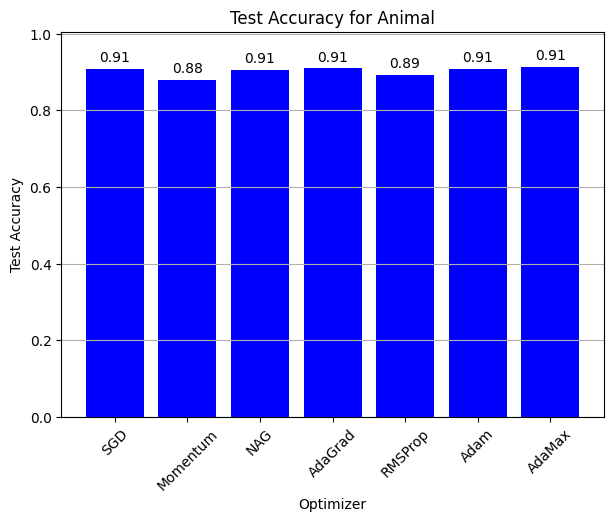

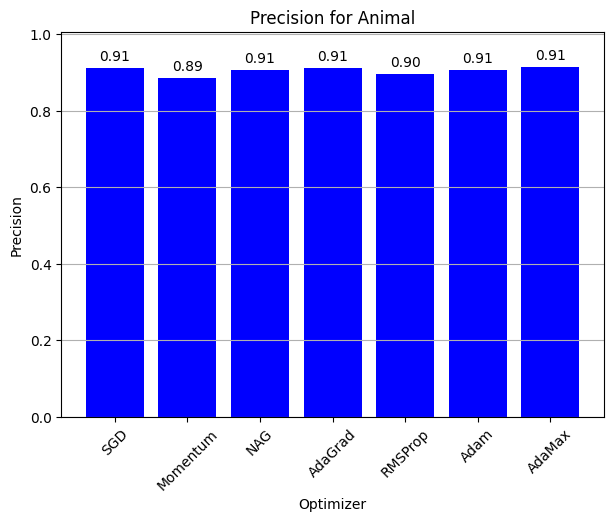

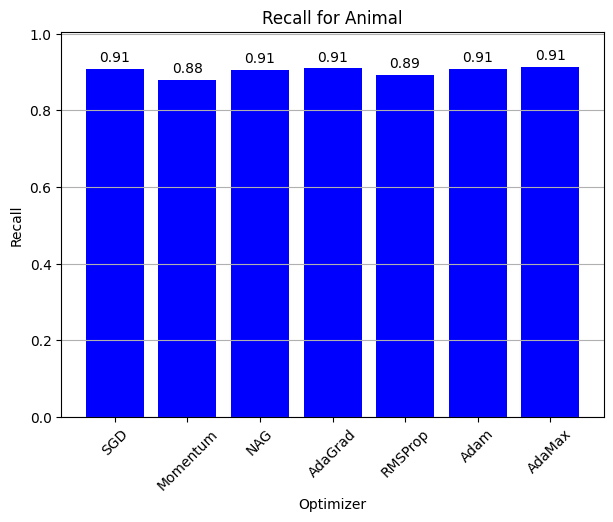

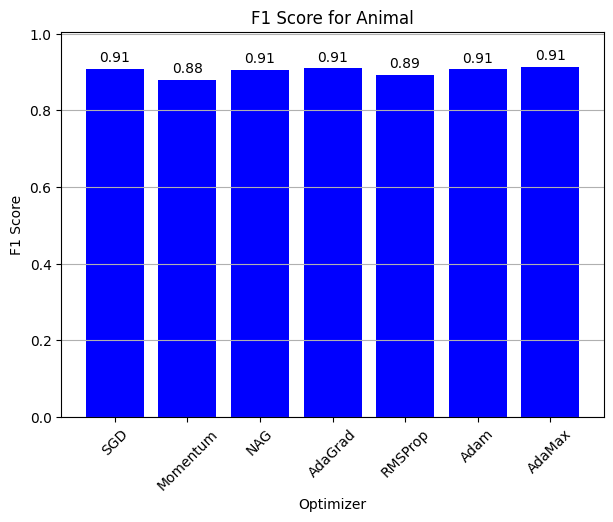

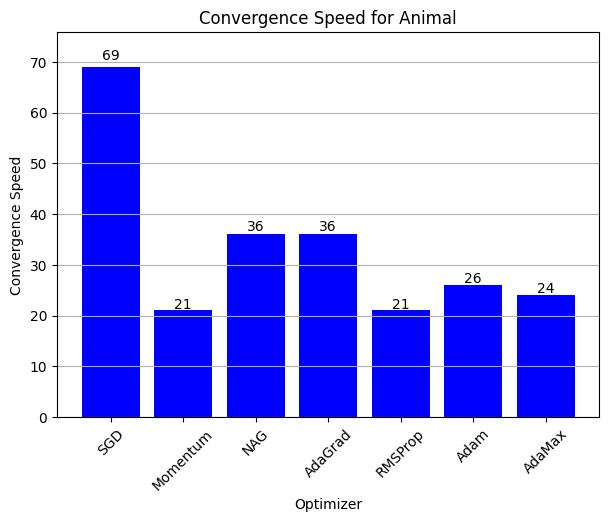

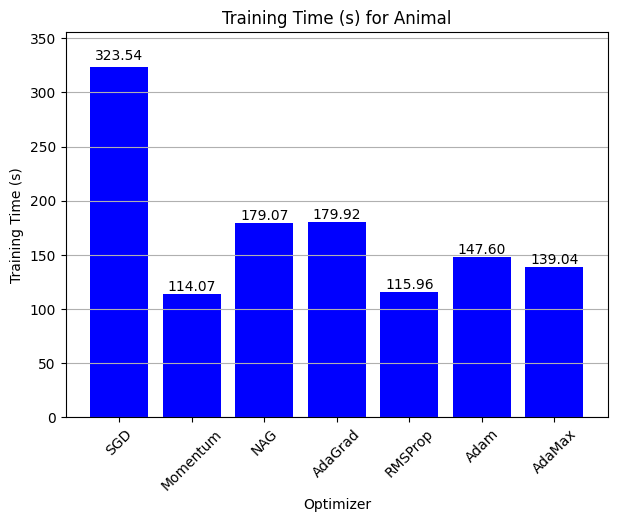

In [ ]:
metrics = ["Test Accuracy", "Precision", "Recall", "F1 Score", "Convergence Speed", "Training Time (s)"]

for metric in metrics:
    plt.figure(figsize=(7, 5))

    subset = results_df[results_df["Dataset"] == "Animal"]

    bars = plt.bar(subset["Optimizer"], subset[metric], color='blue')
    plt.title(f"{metric} for Animal")
    plt.xlabel("Optimizer")
    plt.ylabel(metric)
    plt.xticks(rotation=45)
    plt.grid(axis='y')

    plt.ylim(0, max(subset[metric]) * 1.1)

    for bar in bars:
        yval = bar.get_height()
        if metric == "Convergence Speed":
            plt.text(bar.get_x() + bar.get_width() / 2, yval * 1.02, f'{int(yval)}', ha='center')
        else:
            plt.text(bar.get_x() + bar.get_width() / 2, yval * 1.02, f'{yval:.2f}', ha='center')

    plt.savefig(f"{metric}_Animal_comparison.png")

    plt.show()


**RAPORT KLASYFIKACJI DLA SIEDMIU OPTYMALIZATORÓW**

In [ ]:
for optimizer_name, report in classification_reports.items():
    print(f"\nClassification Report - {optimizer_name} (Animal):\n")
    print(report)


Classification Report - SGD (Animal):

              precision    recall  f1-score   support

           0       0.91      0.79      0.84       456
           1       0.89      0.87      0.88       452
           2       0.79      0.93      0.85       448
           3       0.98      0.99      0.99       456
           4       0.99      0.97      0.98       440

    accuracy                           0.91      2252
   macro avg       0.91      0.91      0.91      2252
weighted avg       0.91      0.91      0.91      2252


Classification Report - Momentum (Animal):

              precision    recall  f1-score   support

           0       0.83      0.77      0.80       456
           1       0.88      0.76      0.81       452
           2       0.75      0.92      0.82       448
           3       0.98      0.99      0.99       456
           4       0.99      0.97      0.98       440

    accuracy                           0.88      2252
   macro avg       0.89      0.88      0.88   

**MACIERZ POMYŁEK DLA SIEDMIU OPTYMALIZATORÓW**

<Figure size 1170x830 with 0 Axes>

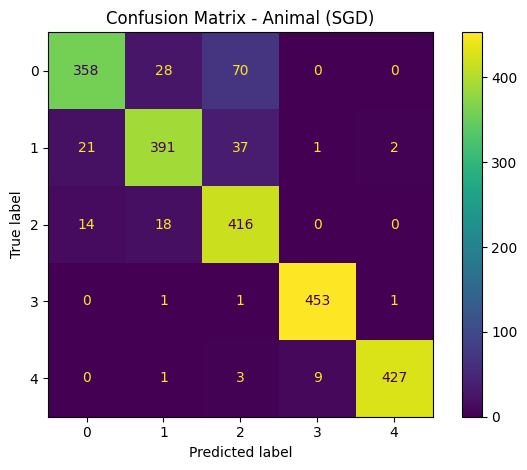

<Figure size 1170x830 with 0 Axes>

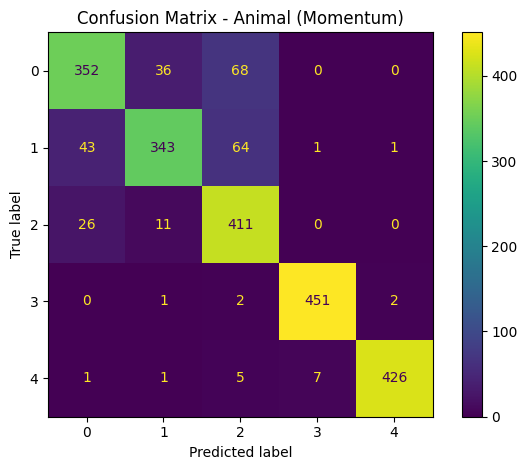

<Figure size 1170x830 with 0 Axes>

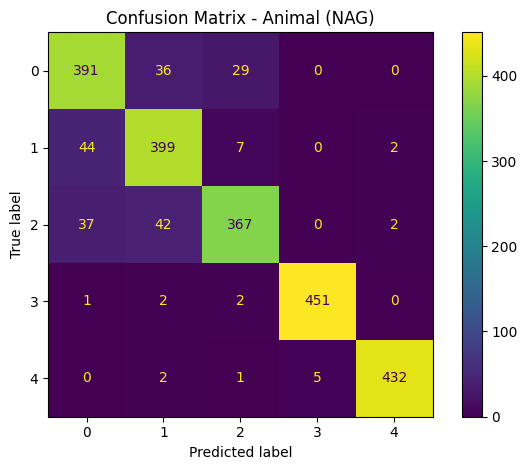

<Figure size 1170x830 with 0 Axes>

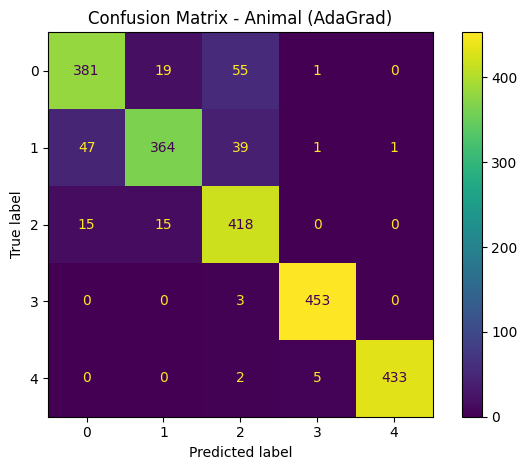

<Figure size 1170x830 with 0 Axes>

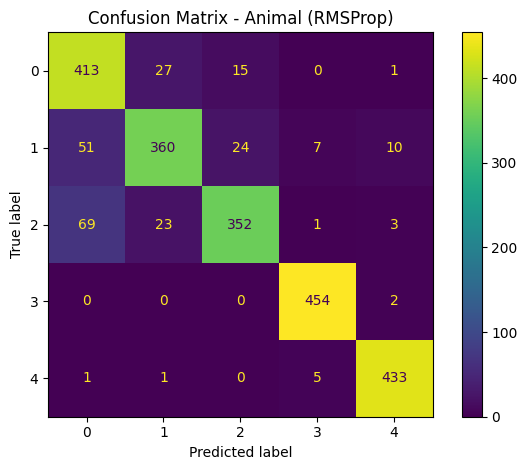

<Figure size 1170x830 with 0 Axes>

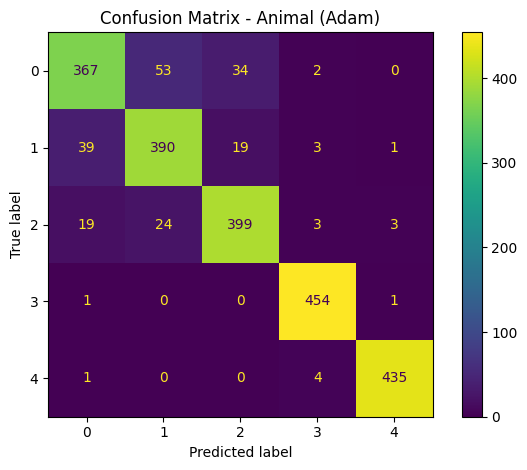

<Figure size 1170x830 with 0 Axes>

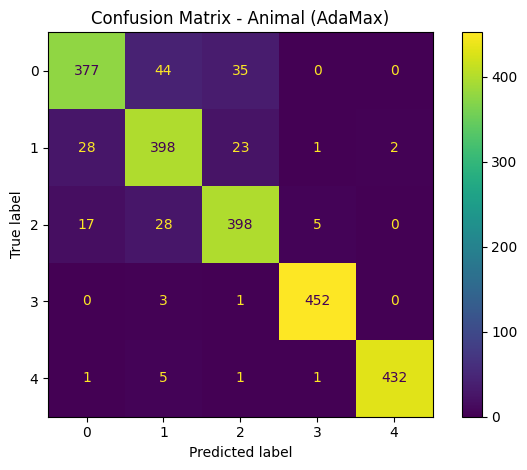

In [ ]:
for optimizer_name, cm in confusion_matrices.items():
    plt.figure(figsize=(11.7, 8.3))
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=np.arange(num_classes))
    disp.plot(cmap='viridis', values_format='d')
    plt.title(f"Confusion Matrix - Animal ({optimizer_name})")
    plt.grid(False)
    plt.tight_layout()
    plt.show()

**KRZYWE ROC - AUC DLA SIEDMIU OPTYMALIZATORÓW**

Generowanie krzywej ROC-AUC dla optymalizatora: SGD
Generowanie krzywej ROC-AUC dla optymalizatora: Momentum
Generowanie krzywej ROC-AUC dla optymalizatora: NAG
Generowanie krzywej ROC-AUC dla optymalizatora: AdaGrad
Generowanie krzywej ROC-AUC dla optymalizatora: RMSProp
Generowanie krzywej ROC-AUC dla optymalizatora: Adam
Generowanie krzywej ROC-AUC dla optymalizatora: AdaMax


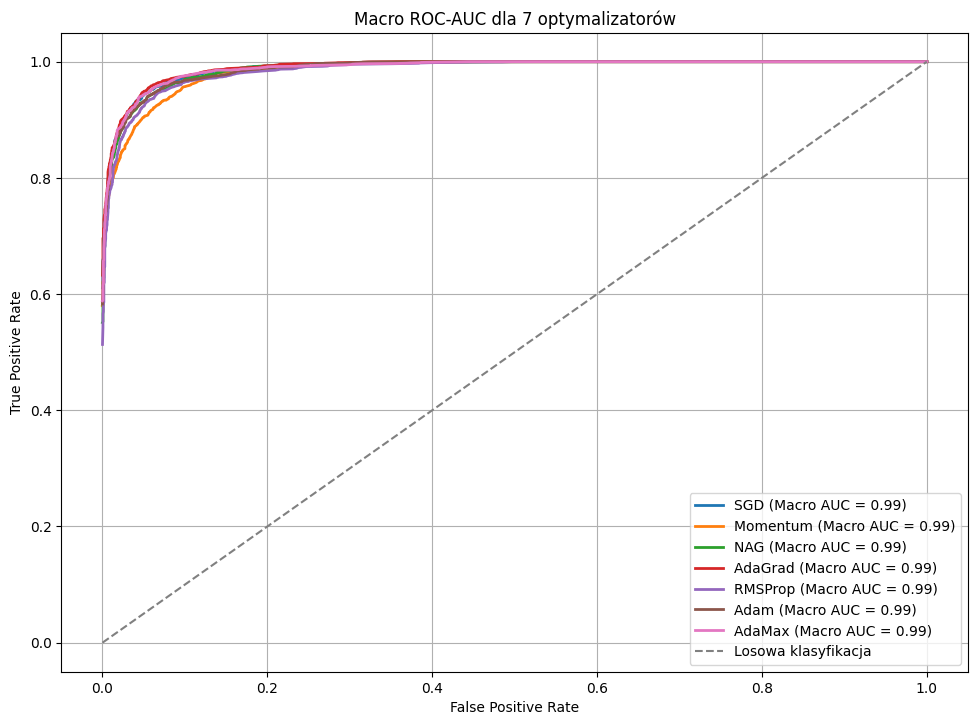

In [ ]:
plt.figure(figsize=(11.7, 8.3))

y_test_binarized = label_binarize(y_test, classes=np.arange(num_classes))

for optimizer_name, y_pred_prob in y_pred_probs.items():
    print(f"Generowanie krzywej ROC-AUC dla optymalizatora: {optimizer_name}")

    fpr_macro = np.unique(np.concatenate([
        roc_curve(y_test_binarized[:, j], y_pred_prob[:, j])[0]
        for j in range(num_classes) if np.sum(y_test_binarized[:, j]) > 0
    ]))

    mean_tpr = np.zeros_like(fpr_macro)

    for j in range(num_classes):
        if np.sum(y_test_binarized[:, j]) == 0:
            continue
        fpr, tpr, _ = roc_curve(y_test_binarized[:, j], y_pred_prob[:, j])
        mean_tpr += np.interp(fpr_macro, fpr, tpr)

    mean_tpr /= num_classes
    auc_macro = auc(fpr_macro, mean_tpr)

    plt.plot(fpr_macro, mean_tpr, linestyle='-', label=f'{optimizer_name} (Macro AUC = {auc_macro:.2f})', linewidth=2)

plt.plot([0, 1], [0, 1], color='gray', linestyle='--', label='Losowa klasyfikacja')

plt.title("Macro ROC-AUC dla 7 optymalizatorów")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.legend(loc="lower right")
plt.grid(True)

plt.savefig("Macro_ROC_AUC_5_classes.png")
plt.show()


# **TRENING ZBIORU BIRDS NA 3 MODELACH**

**MODEL PROSTY - 3 WARSTWY CONV**

In [ ]:
X_train, y_train = X_train_birds, y_train_birds
X_val, y_val = X_val_birds, y_val_birds
X_test, y_test = X_test_birds, y_test_birds
input_shape = X_train.shape[1:]
num_classes = len(class_names_birds)

**ARCHITEKTURA MODELU 3 - WARSTWOWEGO**

In [ ]:
def three_layer_model(input_shape, num_classes):
    model = models.Sequential([
        layers.Conv2D(64, (3, 3), activation='relu', input_shape=input_shape),

        layers.MaxPooling2D((2, 2)),
        layers.Dropout(0.2),

        layers.Conv2D(128, (3, 3), activation='relu'),

        layers.MaxPooling2D((2, 2)),
        layers.Dropout(0.2),

        layers.Conv2D(256, (3, 3), activation='relu'),

        layers.MaxPooling2D((2, 2)),
        layers.Dropout(0.3),

        layers.GlobalAveragePooling2D(),
        layers.Dense(256, activation='relu'),
        layers.Dropout(0.4),
        layers.Dense(num_classes, activation='softmax')
    ])
    return model



**PROCES TRENINGU MODELU**

In [ ]:
EPOCHS = 100
results = []
classification_reports = {}
y_pred_probs = {}
confusion_matrices = {}

optimizers = {
    'SGD': SGD(learning_rate=0.01),
    'Momentum': SGD(learning_rate=0.01, momentum=0.9),
    'NAG': SGD(learning_rate=0.01, momentum=0.9, nesterov=True),
    'AdaGrad': Adagrad(learning_rate=0.01),
    'RMSProp': RMSprop(learning_rate=0.001),
    'Adam': Adam(learning_rate=0.001),
    'AdaMax': Adamax(learning_rate=0.001),
}

for optimizer_name, optimizer in optimizers.items():
    print(f"\nTrening modelu Birds z optymalizatorem: {optimizer_name}")

    model = three_layer_model(input_shape, num_classes)
    model.compile(optimizer=optimizer,
                  loss='sparse_categorical_crossentropy',
                  metrics=['accuracy'])

    early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

    start_time = time.time()
    history = model.fit(
        X_train, y_train,
        validation_data=(X_val, y_val),
        epochs=EPOCHS,
        callbacks=[early_stopping],
        verbose=1
    )
    elapsed_time = time.time() - start_time

    test_loss, test_accuracy = model.evaluate(X_test, y_test, verbose=0)
    y_pred = np.argmax(model.predict(X_test), axis=-1)
    y_true = y_test

    precision, recall, f1, _ = precision_recall_fscore_support(y_true, y_pred, average="weighted",zero_division=0)
    accuracy = accuracy_score(y_true, y_pred)

    results.append({
        "Dataset": "Birds",
        "Optimizer": optimizer_name,
        "Test Accuracy": accuracy,
        "Precision": precision,
        "Recall": recall,
        "F1 Score": f1,
        "Convergence Speed": len(history.history['loss']),
        "Training Time (s)": elapsed_time,
        "Test Loss": test_loss
    })

    classification_reports[optimizer_name] = classification_report(y_true, y_pred, target_names=[str(i) for i in np.unique(y_true)], zero_division=0)


    y_pred_probs[optimizer_name] = model.predict(X_test)
    confusion_matrices[optimizer_name] = confusion_matrix(y_true, y_pred)




Trening modelu Birds z optymalizatorem: SGD


/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
938/938 ━━━━━━━━━━━━━━━━━━━━ 16s 13ms/step - accuracy: 0.0411 - loss: 3.2193 - val_accuracy: 0.0621 - val_loss: 3.2151
Epoch 2/100
938/938 ━━━━━━━━━━━━━━━━━━━━ 8s 8ms/step - accuracy: 0.0508 - loss: 3.2111 - val_accuracy: 0.0568 - val_loss: 3.2042
Epoch 3/100
938/938 ━━━━━━━━━━━━━━━━━━━━ 8s 8ms/step - accuracy: 0.0615 - loss: 3.1942 - val_accuracy: 0.0637 - val_loss: 3.1827
Epoch 4/100
938/938 ━━━━━━━━━━━━━━━━━━━━ 8s 8ms/step - accuracy: 0.0671 - loss: 3.1725 - val_accuracy: 0.0851 - val_loss: 3.1680
Epoch 5/100
938/938 ━━━━━━━━━━━━━━━━━━━━ 8s 8ms/step - accuracy: 0.0732 - loss: 3.1578 - val_accuracy: 0.0925 - val_loss: 3.1476
Epoch 6/100
938/938 ━━━━━━━━━━━━━━━━━━━━ 7s 8ms/step - accuracy: 0.0858 - loss: 3.1369 - val_accuracy: 0.0936 - val_loss: 3.1269
Epoch 7/100
938/938 ━━━━━━━━━━━━━━━━━━━━ 7s 8ms/step - accuracy: 0.0931 - loss: 3.1098 - val_accuracy: 0.0883 - val_loss: 3.1026
Epoch 8/100
938/938 ━━━━━━━━━━━━━━━━━━━━ 7s 8ms/step - accuracy: 0.1020 - loss: 3.0766 - val_ac

/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
938/938 ━━━━━━━━━━━━━━━━━━━━ 16s 13ms/step - accuracy: 0.0474 - loss: 3.2085 - val_accuracy: 0.0795 - val_loss: 3.1343
Epoch 2/100
938/938 ━━━━━━━━━━━━━━━━━━━━ 7s 8ms/step - accuracy: 0.0908 - loss: 3.0894 - val_accuracy: 0.1227 - val_loss: 2.8602
Epoch 3/100
938/938 ━━━━━━━━━━━━━━━━━━━━ 7s 8ms/step - accuracy: 0.1445 - loss: 2.7962 - val_accuracy: 0.1984 - val_loss: 2.6462
Epoch 4/100
938/938 ━━━━━━━━━━━━━━━━━━━━ 7s 8ms/step - accuracy: 0.1817 - loss: 2.6344 - val_accuracy: 0.2448 - val_loss: 2.5053
Epoch 5/100
938/938 ━━━━━━━━━━━━━━━━━━━━ 7s 8ms/step - accuracy: 0.2240 - loss: 2.5001 - val_accuracy: 0.2800 - val_loss: 2.3165
Epoch 6/100
938/938 ━━━━━━━━━━━━━━━━━━━━ 7s 8ms/step - accuracy: 0.2857 - loss: 2.2947 - val_accuracy: 0.3344 - val_loss: 2.1210
Epoch 7/100
938/938 ━━━━━━━━━━━━━━━━━━━━ 7s 8ms/step - accuracy: 0.3200 - loss: 2.1509 - val_accuracy: 0.3541 - val_loss: 1.9783
Epoch 8/100
938/938 ━━━━━━━━━━━━━━━━━━━━ 7s 8ms/step - accuracy: 0.3601 - loss: 2.0288 - val_ac

/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
938/938 ━━━━━━━━━━━━━━━━━━━━ 16s 13ms/step - accuracy: 0.0497 - loss: 3.2043 - val_accuracy: 0.0792 - val_loss: 3.1451
Epoch 2/100
938/938 ━━━━━━━━━━━━━━━━━━━━ 7s 8ms/step - accuracy: 0.0934 - loss: 3.0994 - val_accuracy: 0.0976 - val_loss: 3.0626
Epoch 3/100
938/938 ━━━━━━━━━━━━━━━━━━━━ 7s 8ms/step - accuracy: 0.1331 - loss: 2.9051 - val_accuracy: 0.1837 - val_loss: 2.6644
Epoch 4/100
938/938 ━━━━━━━━━━━━━━━━━━━━ 7s 8ms/step - accuracy: 0.1966 - loss: 2.6229 - val_accuracy: 0.2477 - val_loss: 2.4436
Epoch 5/100
938/938 ━━━━━━━━━━━━━━━━━━━━ 7s 8ms/step - accuracy: 0.2591 - loss: 2.3993 - val_accuracy: 0.3269 - val_loss: 2.1733
Epoch 6/100
938/938 ━━━━━━━━━━━━━━━━━━━━ 7s 8ms/step - accuracy: 0.3085 - loss: 2.2036 - val_accuracy: 0.3360 - val_loss: 2.1058
Epoch 7/100
938/938 ━━━━━━━━━━━━━━━━━━━━ 7s 8ms/step - accuracy: 0.3465 - loss: 2.0654 - val_accuracy: 0.3915 - val_loss: 1.9251
Epoch 8/100
938/938 ━━━━━━━━━━━━━━━━━━━━ 7s 8ms/step - accuracy: 0.3795 - loss: 1.9331 - val_ac

/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
938/938 ━━━━━━━━━━━━━━━━━━━━ 16s 13ms/step - accuracy: 0.0424 - loss: 3.2175 - val_accuracy: 0.0600 - val_loss: 3.1896
Epoch 2/100
938/938 ━━━━━━━━━━━━━━━━━━━━ 7s 8ms/step - accuracy: 0.0602 - loss: 3.1786 - val_accuracy: 0.0752 - val_loss: 3.1602
Epoch 3/100
938/938 ━━━━━━━━━━━━━━━━━━━━ 7s 8ms/step - accuracy: 0.0754 - loss: 3.1508 - val_accuracy: 0.1061 - val_loss: 3.1147
Epoch 4/100
938/938 ━━━━━━━━━━━━━━━━━━━━ 7s 8ms/step - accuracy: 0.0954 - loss: 3.0993 - val_accuracy: 0.1157 - val_loss: 3.0488
Epoch 5/100
938/938 ━━━━━━━━━━━━━━━━━━━━ 7s 8ms/step - accuracy: 0.1075 - loss: 3.0505 - val_accuracy: 0.1307 - val_loss: 3.0021
Epoch 6/100
938/938 ━━━━━━━━━━━━━━━━━━━━ 7s 8ms/step - accuracy: 0.1186 - loss: 3.0148 - val_accuracy: 0.1408 - val_loss: 2.9717
Epoch 7/100
938/938 ━━━━━━━━━━━━━━━━━━━━ 7s 8ms/step - accuracy: 0.1351 - loss: 2.9626 - val_accuracy: 0.1624 - val_loss: 2.9041
Epoch 8/100
938/938 ━━━━━━━━━━━━━━━━━━━━ 7s 8ms/step - accuracy: 0.1527 - loss: 2.8994 - val_ac

/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
938/938 ━━━━━━━━━━━━━━━━━━━━ 16s 13ms/step - accuracy: 0.0721 - loss: 3.0271 - val_accuracy: 0.1688 - val_loss: 2.6195
Epoch 2/100
938/938 ━━━━━━━━━━━━━━━━━━━━ 7s 8ms/step - accuracy: 0.1744 - loss: 2.5723 - val_accuracy: 0.2491 - val_loss: 2.3490
Epoch 3/100
938/938 ━━━━━━━━━━━━━━━━━━━━ 7s 8ms/step - accuracy: 0.2874 - loss: 2.2655 - val_accuracy: 0.3419 - val_loss: 2.1194
Epoch 4/100
938/938 ━━━━━━━━━━━━━━━━━━━━ 8s 8ms/step - accuracy: 0.3659 - loss: 2.0147 - val_accuracy: 0.4104 - val_loss: 1.8514
Epoch 5/100
938/938 ━━━━━━━━━━━━━━━━━━━━ 7s 8ms/step - accuracy: 0.4236 - loss: 1.8201 - val_accuracy: 0.4035 - val_loss: 1.8921
Epoch 6/100
938/938 ━━━━━━━━━━━━━━━━━━━━ 7s 8ms/step - accuracy: 0.4667 - loss: 1.6987 - val_accuracy: 0.5211 - val_loss: 1.5357
Epoch 7/100
938/938 ━━━━━━━━━━━━━━━━━━━━ 7s 8ms/step - accuracy: 0.5024 - loss: 1.5993 - val_accuracy: 0.5699 - val_loss: 1.4053
Epoch 8/100
938/938 ━━━━━━━━━━━━━━━━━━━━ 7s 8ms/step - accuracy: 0.5352 - loss: 1.5150 - val_ac

/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
938/938 ━━━━━━━━━━━━━━━━━━━━ 17s 13ms/step - accuracy: 0.0812 - loss: 2.9578 - val_accuracy: 0.2048 - val_loss: 2.5086
Epoch 2/100
938/938 ━━━━━━━━━━━━━━━━━━━━ 8s 8ms/step - accuracy: 0.1949 - loss: 2.4663 - val_accuracy: 0.3101 - val_loss: 2.1774
Epoch 3/100
938/938 ━━━━━━━━━━━━━━━━━━━━ 8s 8ms/step - accuracy: 0.3034 - loss: 2.1369 - val_accuracy: 0.3933 - val_loss: 1.9207
Epoch 4/100
938/938 ━━━━━━━━━━━━━━━━━━━━ 8s 8ms/step - accuracy: 0.3837 - loss: 1.9163 - val_accuracy: 0.4600 - val_loss: 1.7093
Epoch 5/100
938/938 ━━━━━━━━━━━━━━━━━━━━ 8s 8ms/step - accuracy: 0.4409 - loss: 1.7462 - val_accuracy: 0.4968 - val_loss: 1.5863
Epoch 6/100
938/938 ━━━━━━━━━━━━━━━━━━━━ 8s 8ms/step - accuracy: 0.4768 - loss: 1.6260 - val_accuracy: 0.5280 - val_loss: 1.4942
Epoch 7/100
938/938 ━━━━━━━━━━━━━━━━━━━━ 8s 8ms/step - accuracy: 0.5225 - loss: 1.4906 - val_accuracy: 0.5829 - val_loss: 1.3490
Epoch 8/100
938/938 ━━━━━━━━━━━━━━━━━━━━ 8s 8ms/step - accuracy: 0.5591 - loss: 1.3850 - val_ac

/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
938/938 ━━━━━━━━━━━━━━━━━━━━ 17s 13ms/step - accuracy: 0.0748 - loss: 3.0384 - val_accuracy: 0.1957 - val_loss: 2.6759
Epoch 2/100
938/938 ━━━━━━━━━━━━━━━━━━━━ 8s 8ms/step - accuracy: 0.1707 - loss: 2.6261 - val_accuracy: 0.2400 - val_loss: 2.4142
Epoch 3/100
938/938 ━━━━━━━━━━━━━━━━━━━━ 8s 8ms/step - accuracy: 0.2407 - loss: 2.3904 - val_accuracy: 0.3219 - val_loss: 2.1529
Epoch 4/100
938/938 ━━━━━━━━━━━━━━━━━━━━ 8s 8ms/step - accuracy: 0.3167 - loss: 2.1486 - val_accuracy: 0.3595 - val_loss: 2.0276
Epoch 5/100
938/938 ━━━━━━━━━━━━━━━━━━━━ 8s 8ms/step - accuracy: 0.3645 - loss: 1.9879 - val_accuracy: 0.4029 - val_loss: 1.8482
Epoch 6/100
938/938 ━━━━━━━━━━━━━━━━━━━━ 8s 8ms/step - accuracy: 0.4032 - loss: 1.8535 - val_accuracy: 0.4469 - val_loss: 1.7059
Epoch 7/100
938/938 ━━━━━━━━━━━━━━━━━━━━ 8s 8ms/step - accuracy: 0.4324 - loss: 1.7766 - val_accuracy: 0.4645 - val_loss: 1.6662
Epoch 8/100
938/938 ━━━━━━━━━━━━━━━━━━━━ 8s 8ms/step - accuracy: 0.4614 - loss: 1.6723 - val_ac

**ZAPIS WYNIKÓW DO CSV**

In [ ]:
results_df = pd.DataFrame(results)
results_df.to_csv("training_results.csv", index=False)

**PREZENTACJA WYNIKÓW W FORMIE WYKRESÓW**

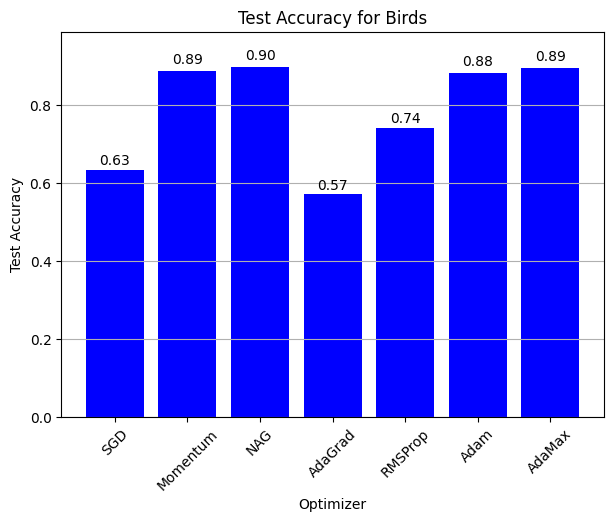

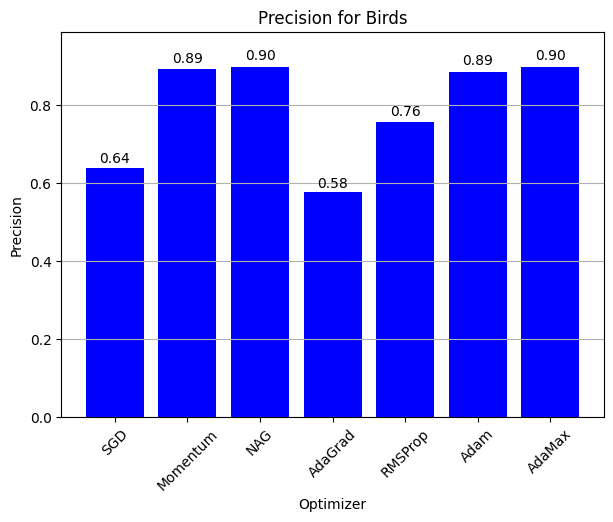

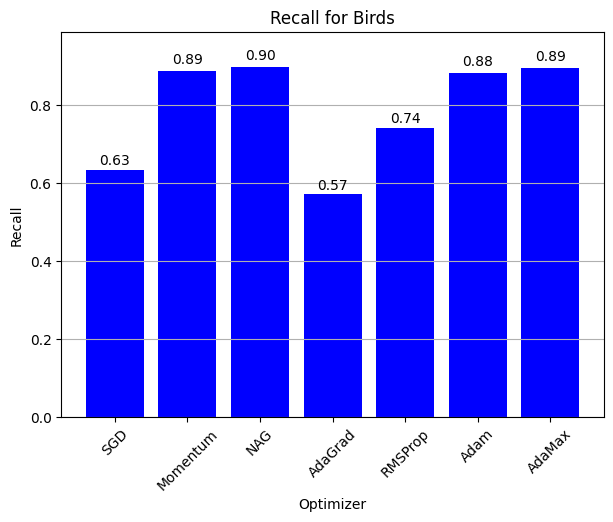

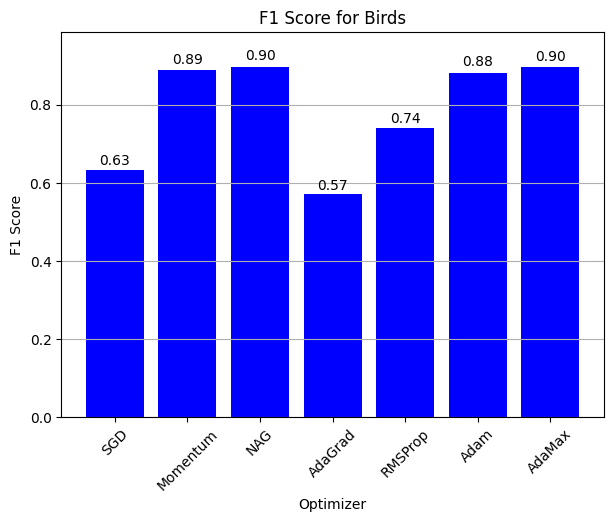

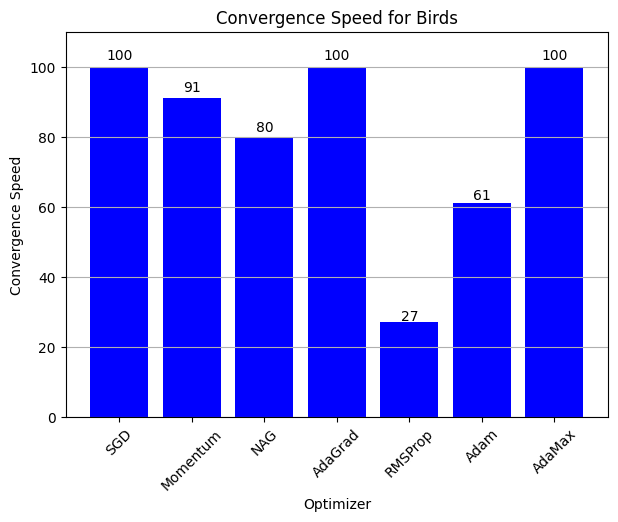

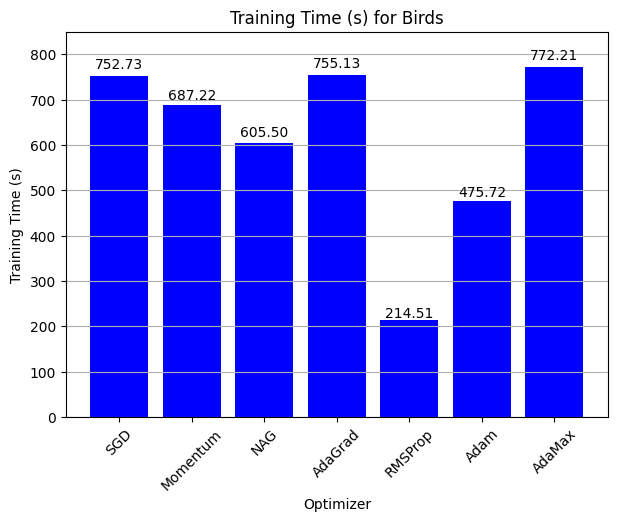

In [ ]:
metrics = ["Test Accuracy", "Precision", "Recall", "F1 Score", "Convergence Speed", "Training Time (s)"]

for metric in metrics:
    plt.figure(figsize=(7, 5))

    subset = results_df[results_df["Dataset"] == "Birds"]

    bars = plt.bar(subset["Optimizer"], subset[metric], color='blue')
    plt.title(f"{metric} for Birds")
    plt.xlabel("Optimizer")
    plt.ylabel(metric)
    plt.xticks(rotation=45)
    plt.grid(axis='y')

    plt.ylim(0, max(subset[metric]) * 1.1)

    for bar in bars:
        yval = bar.get_height()
        if metric == "Convergence Speed":
            plt.text(bar.get_x() + bar.get_width() / 2, yval * 1.02, f'{int(yval)}', ha='center')
        else:
            plt.text(bar.get_x() + bar.get_width() / 2, yval * 1.02, f'{yval:.2f}', ha='center')

    plt.savefig(f"{metric}_Birds_comparison.png")

    plt.show()


**RAPORT KLASYFIKACJI DLA SIEDMIU OPTYMALIZATORÓW**

In [ ]:
for optimizer_name, report in classification_reports.items():
    print(f"\nClassification Report - {optimizer_name} (Birds):\n")
    print(report)



Classification Report - SGD (Birds):

              precision    recall  f1-score   support

           0       0.69      0.71      0.70       150
           1       0.35      0.37      0.36       150
           2       0.81      0.81      0.81       150
           3       0.82      0.75      0.78       150
           4       0.60      0.45      0.51       150
           5       0.50      0.48      0.49       150
           6       0.48      0.39      0.43       150
           7       0.54      0.51      0.53       150
           8       0.51      0.73      0.60       150
           9       0.69      0.55      0.61       150
          10       0.62      0.73      0.67       150
          11       0.58      0.71      0.64       150
          12       0.54      0.54      0.54       150
          13       0.88      0.73      0.80       150
          14       0.64      0.67      0.66       150
          15       0.72      0.75      0.73       150
          16       0.72      0.60      0.6

**MACIERZ POMYŁEK DLA SIEDMIU OPTYMALIZATORÓW (TOP10 NAJCZĘŚCIEJ MYLĄCYCH SIĘ KLAS)**

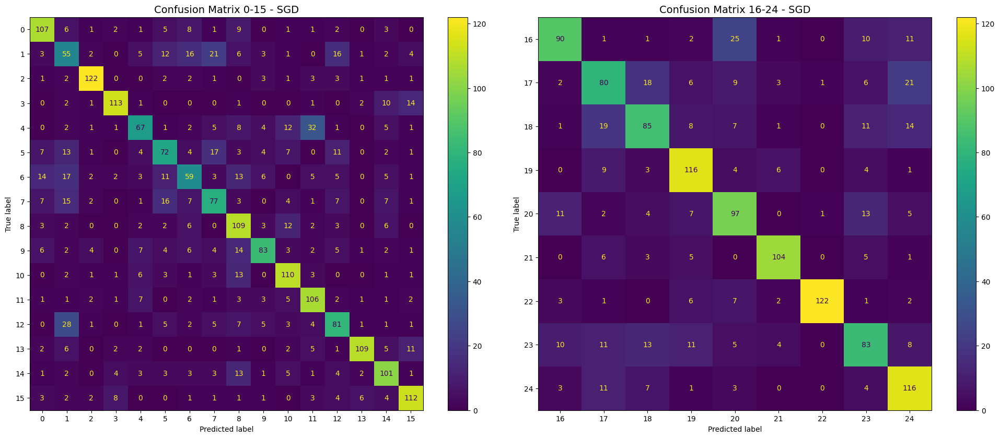

<Figure size 1170x830 with 0 Axes>

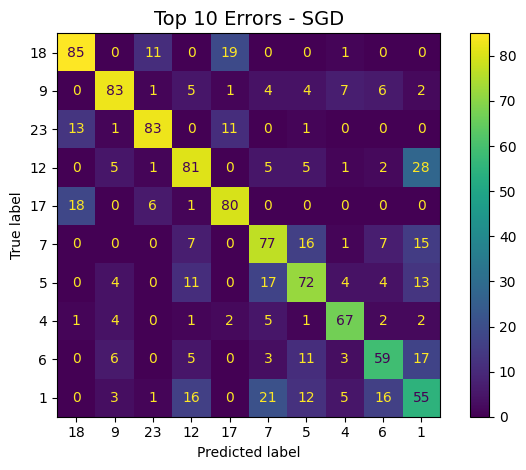

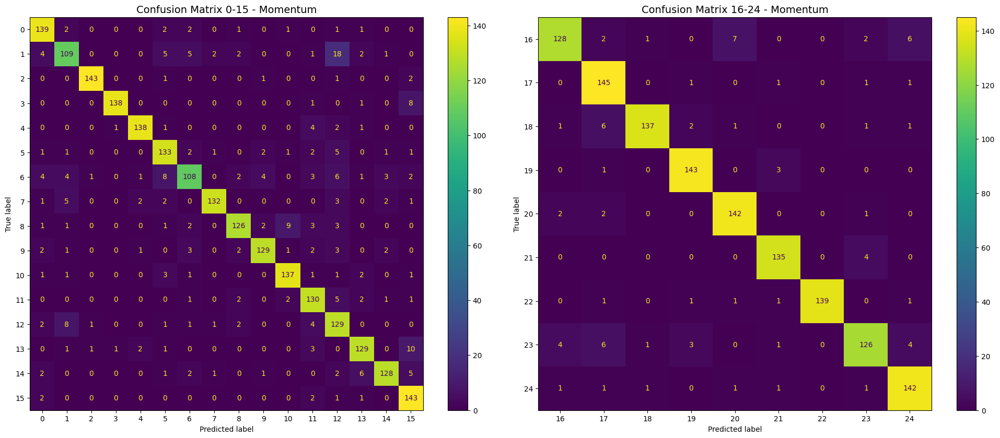

<Figure size 1170x830 with 0 Axes>

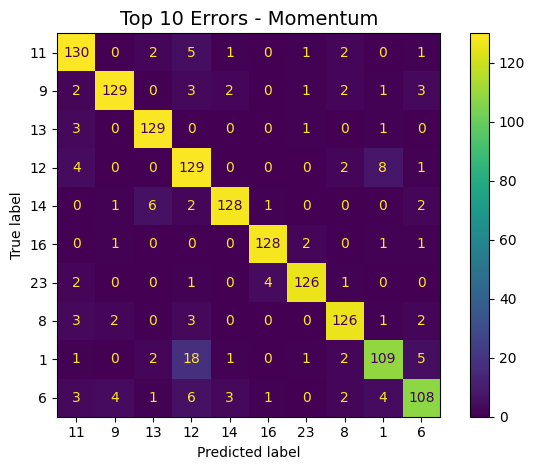

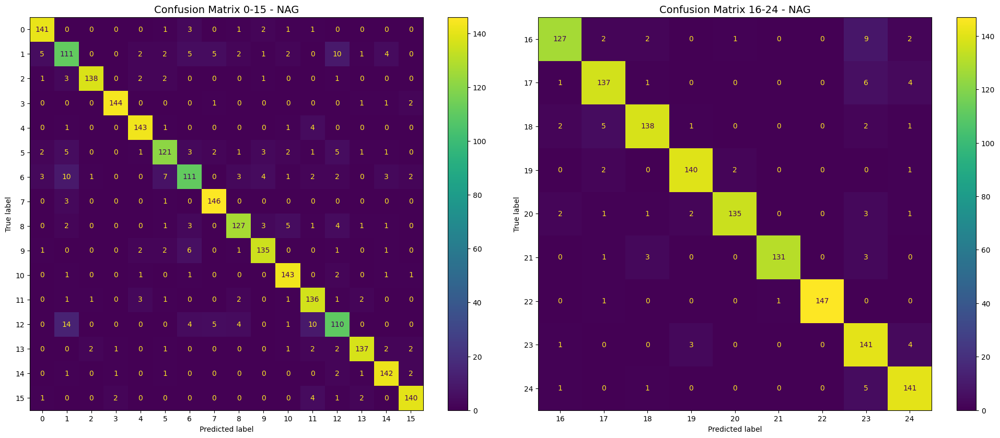

<Figure size 1170x830 with 0 Axes>

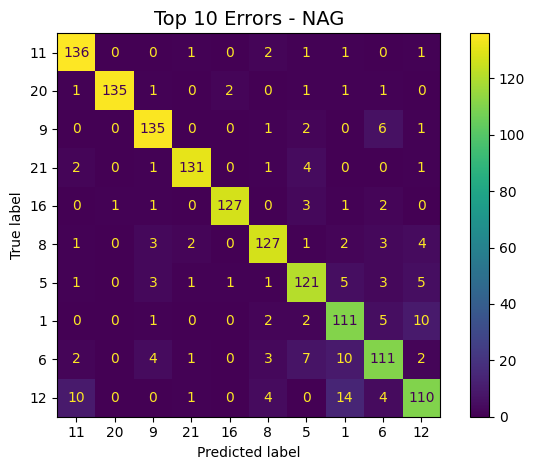

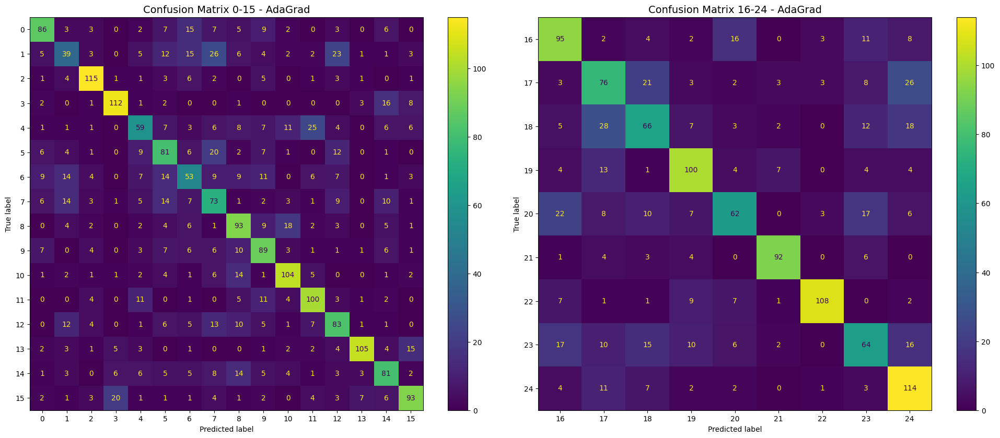

<Figure size 1170x830 with 0 Axes>

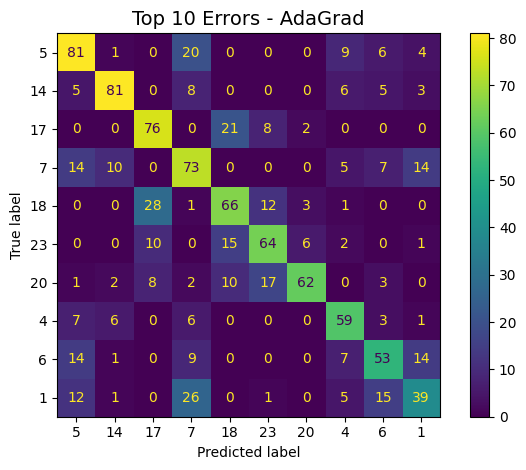

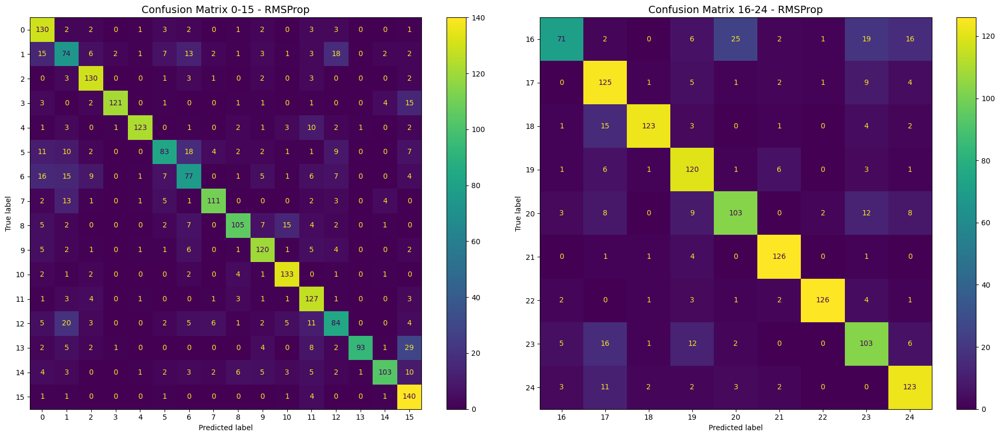

<Figure size 1170x830 with 0 Axes>

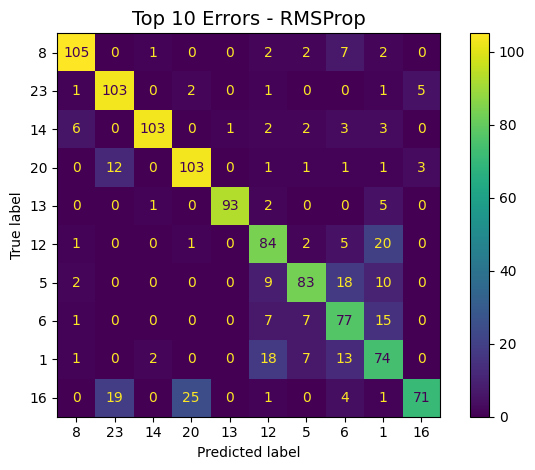

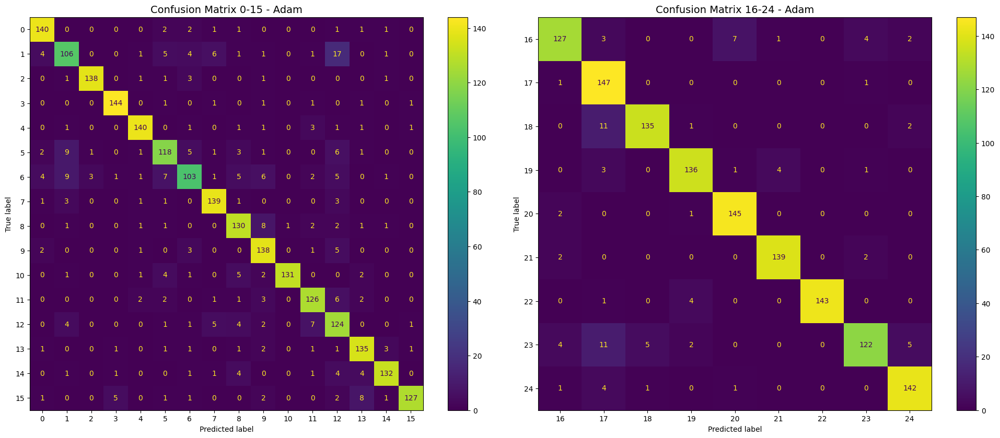

<Figure size 1170x830 with 0 Axes>

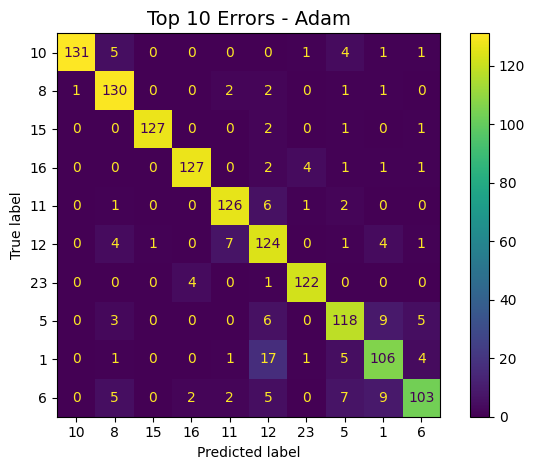

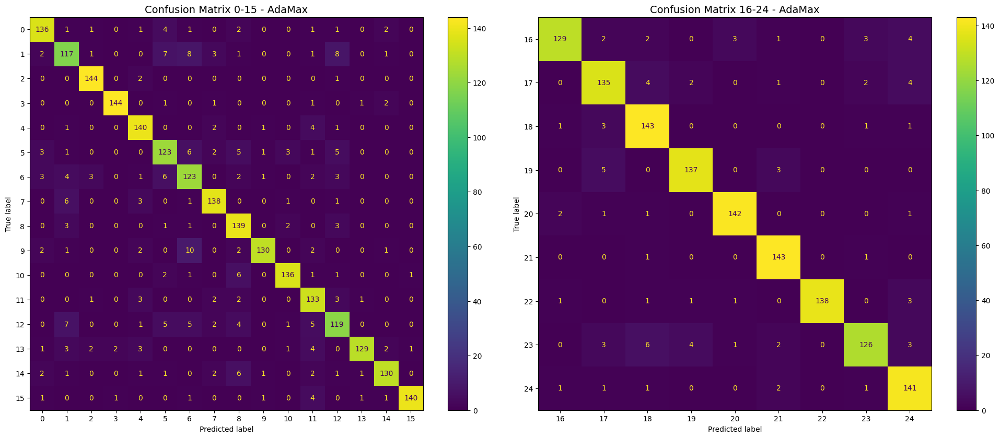

<Figure size 1170x830 with 0 Axes>

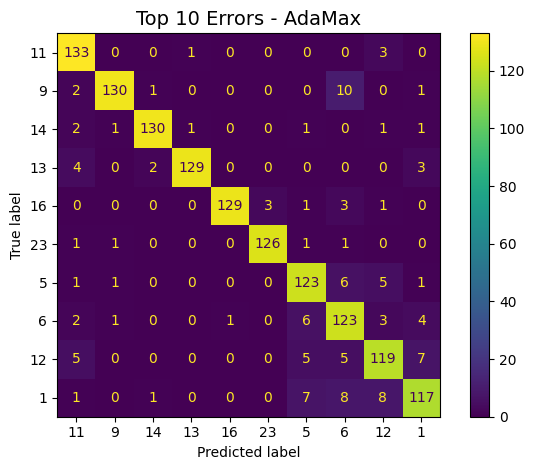

In [102]:
def filter_top_errors(cm, top_n=10):
    errors = np.sum(cm, axis=1) - np.diag(cm)
    top_classes = np.argsort(errors)[-top_n:]

    filtered_cm = cm[np.ix_(top_classes, top_classes)]
    return filtered_cm, top_classes
for optimizer_name, cm in confusion_matrices.items():
    fig, axes = plt.subplots(1, 2, figsize=(20, 8))

    max_classes = cm.shape[0]
    disp_0_15 = ConfusionMatrixDisplay(confusion_matrix=cm[:16, :16], display_labels=np.arange(0, min(16, max_classes)))
    disp_0_15.plot(cmap='viridis', values_format='d', ax=axes[0])
    axes[0].set_title(f"Confusion Matrix 0-15 - {optimizer_name}", fontsize=14)
    axes[0].tick_params(axis='both', labelsize=10)

    start_idx = 16
    end_idx = min(max_classes, 26)
    disp_16_25 = ConfusionMatrixDisplay(confusion_matrix=cm[start_idx:end_idx, start_idx:end_idx],
                                        display_labels=np.arange(start_idx, end_idx))
    disp_16_25.plot(cmap='viridis', values_format='d', ax=axes[1])
    axes[1].set_title(f"Confusion Matrix {start_idx}-{end_idx-1} - {optimizer_name}", fontsize=14)
    axes[1].tick_params(axis='both', labelsize=10)

    plt.tight_layout()
    plt.show()

    plt.figure(figsize=(11.7, 8.3))
    filtered_cm, top_classes = filter_top_errors(cm, top_n=10)
    disp_top_10 = ConfusionMatrixDisplay(confusion_matrix=filtered_cm, display_labels=top_classes)
    disp_top_10.plot(cmap='viridis', values_format='d')
    plt.title(f"Top 10 Errors - {optimizer_name}", fontsize=14)
    plt.xticks(fontsize=10)
    plt.yticks(fontsize=10)
    plt.grid(False)
    plt.tight_layout()
    plt.show()


**KRZYWE ROC-AUC DLA SIEDMIU OPTYMALIZATORÓW**

Generowanie krzywej ROC-AUC dla optymalizatora: SGD
Generowanie krzywej ROC-AUC dla optymalizatora: Momentum
Generowanie krzywej ROC-AUC dla optymalizatora: NAG
Generowanie krzywej ROC-AUC dla optymalizatora: AdaGrad
Generowanie krzywej ROC-AUC dla optymalizatora: RMSProp
Generowanie krzywej ROC-AUC dla optymalizatora: Adam
Generowanie krzywej ROC-AUC dla optymalizatora: AdaMax


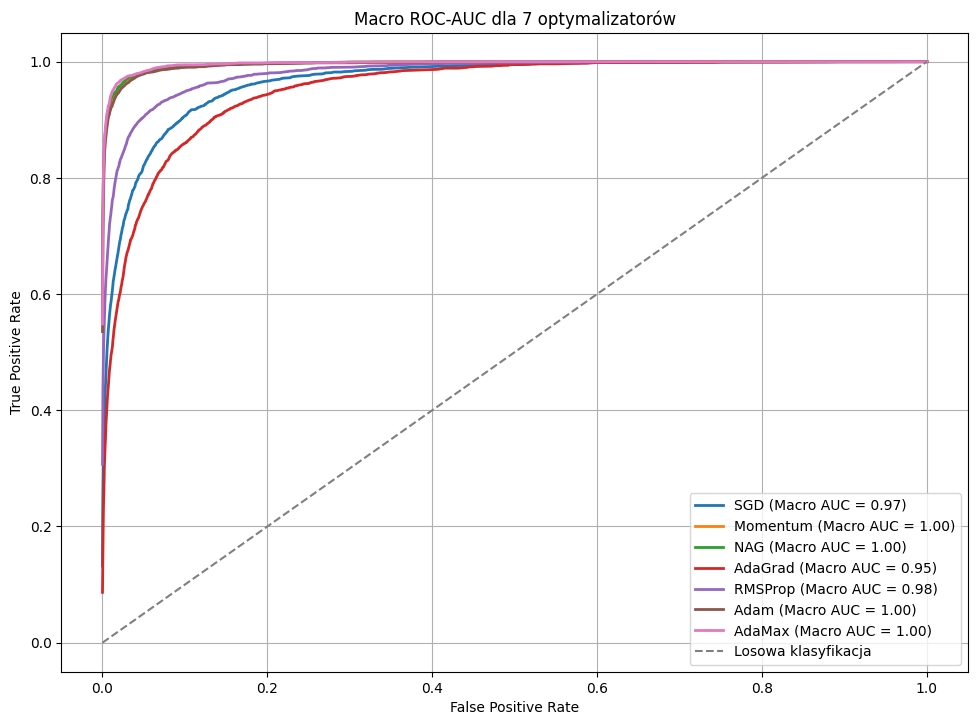

In [103]:
plt.figure(figsize=(11.7, 8.3))

y_test_binarized = label_binarize(y_test, classes=np.arange(num_classes))

for optimizer_name, y_pred_prob in y_pred_probs.items():
    print(f"Generowanie krzywej ROC-AUC dla optymalizatora: {optimizer_name}")

    fpr_macro = np.unique(np.concatenate([
        roc_curve(y_test_binarized[:, j], y_pred_prob[:, j])[0]
        for j in range(num_classes) if np.sum(y_test_binarized[:, j]) > 0
    ]))

    mean_tpr = np.zeros_like(fpr_macro)

    for j in range(num_classes):
        if np.sum(y_test_binarized[:, j]) == 0:
            continue
        fpr, tpr, _ = roc_curve(y_test_binarized[:, j], y_pred_prob[:, j])
        mean_tpr += np.interp(fpr_macro, fpr, tpr)

    mean_tpr /= num_classes
    auc_macro = auc(fpr_macro, mean_tpr)

    plt.plot(fpr_macro, mean_tpr, linestyle='-', label=f'{optimizer_name} (Macro AUC = {auc_macro:.2f})', linewidth=2)

plt.plot([0, 1], [0, 1], color='gray', linestyle='--', label='Losowa klasyfikacja')

plt.title("Macro ROC-AUC dla 7 optymalizatorów")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.legend(loc="lower right")
plt.grid(True)

plt.savefig("Macro_ROC_AUC_25_classes.png")
plt.show()


# **MODEL ŚREDNIOZAAWANSOWANY - 5 WARSTW CONV**

**ARCHITEKTURA MODELU 5-WARSTWOWEGO**

In [105]:
def five_layer_model(input_shape, num_classes):
    model = models.Sequential([
        layers.Conv2D(64, (3, 3), activation='relu', input_shape=input_shape),
        layers.BatchNormalization(),
        layers.MaxPooling2D((2, 2)),
        layers.Dropout(0.3),

        layers.Conv2D(128, (3, 3), activation='relu'),
        layers.BatchNormalization(),
        layers.MaxPooling2D((2, 2)),
        layers.Dropout(0.3),

        layers.Conv2D(256, (3, 3), activation='relu'),
        layers.BatchNormalization(),
        layers.MaxPooling2D((2, 2)),
        layers.Dropout(0.4),

        layers.Conv2D(512, (3, 3), activation='relu'),
        layers.BatchNormalization(),
        layers.MaxPooling2D((2, 2)),
        layers.Dropout(0.4),


        layers.Conv2D(1024, (3, 3), activation='relu'),
        layers.BatchNormalization(),
        layers.MaxPooling2D((2, 2)),
        layers.Dropout(0.4),

        layers.GlobalAveragePooling2D(),
        layers.Dense(256, activation='relu'),
        layers.Dropout(0.5),
        layers.Dense(num_classes, activation='softmax')
    ])
    return model

**PROCES TRENINGU MODELU**

In [106]:
EPOCHS = 100
results = []
classification_reports = {}
y_pred_probs = {}
confusion_matrices = {}

optimizers = {
    'SGD': SGD(learning_rate=0.01),
    'Momentum': SGD(learning_rate=0.01, momentum=0.9),
    'NAG': SGD(learning_rate=0.01, momentum=0.9, nesterov=True),
    'AdaGrad': Adagrad(learning_rate=0.01),
    'RMSProp': RMSprop(learning_rate=0.001),
    'Adam': Adam(learning_rate=0.001),
    'AdaMax': Adamax(learning_rate=0.001),
}
for optimizer_name, optimizer in optimizers.items():
        print(f"\nTrening modelu Birds z optymalizatorem: {optimizer_name}")

        model = five_layer_model(input_shape, num_classes)
        model.compile(optimizer=optimizer,
                      loss='sparse_categorical_crossentropy',
                      metrics=['accuracy'])

        early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

        start_time = time.time()
        history = model.fit(
            X_train, y_train,
            validation_data=(X_val, y_val),
            epochs=EPOCHS,
            callbacks=[early_stopping],
            verbose=1
        )
        elapsed_time = time.time() - start_time

        test_loss, test_accuracy = model.evaluate(X_test, y_test, verbose=0)
        y_pred = np.argmax(model.predict(X_test), axis=-1)
        y_true = y_test
        precision, recall, f1, _ = precision_recall_fscore_support(y_true, y_pred, average="weighted",zero_division=0)
        accuracy = accuracy_score(y_true, y_pred)

        results.append({
            "Dataset": "Birds",
            "Optimizer": optimizer_name,
            "Test Accuracy": accuracy,
            "Precision": precision,
            "Recall": recall,
            "F1 Score": f1,
            "Convergence Speed": len(history.history['loss']),
            "Training Time (s)": elapsed_time,
            "Test Loss": test_loss
        })
        classification_reports[optimizer_name] = classification_report(y_true, y_pred, target_names=[str(i) for i in np.unique(y_true)], zero_division=0)


        y_pred_probs[optimizer_name] = model.predict(X_test)
        confusion_matrices[optimizer_name] = confusion_matrix(y_true, y_pred)


Trening modelu Birds z optymalizatorem: SGD


/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
938/938 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - accuracy: 0.0824 - loss: 3.3263 - val_accuracy: 0.0869 - val_loss: 3.7668
Epoch 2/100
938/938 ━━━━━━━━━━━━━━━━━━━━ 9s 10ms/step - accuracy: 0.1913 - loss: 2.7044 - val_accuracy: 0.1621 - val_loss: 3.6387
Epoch 3/100
938/938 ━━━━━━━━━━━━━━━━━━━━ 9s 10ms/step - accuracy: 0.2742 - loss: 2.3623 - val_accuracy: 0.2789 - val_loss: 2.6532
Epoch 4/100
938/938 ━━━━━━━━━━━━━━━━━━━━ 9s 10ms/step - accuracy: 0.3479 - loss: 2.0884 - val_accuracy: 0.3331 - val_loss: 2.6082
Epoch 5/100
938/938 ━━━━━━━━━━━━━━━━━━━━ 9s 10ms/step - accuracy: 0.4062 - loss: 1.9037 - val_accuracy: 0.4027 - val_loss: 2.1865
Epoch 6/100
938/938 ━━━━━━━━━━━━━━━━━━━━ 9s 10ms/step - accuracy: 0.4454 - loss: 1.7659 - val_accuracy: 0.4117 - val_loss: 2.3167
Epoch 7/100
938/938 ━━━━━━━━━━━━━━━━━━━━ 9s 10ms/step - accuracy: 0.4909 - loss: 1.6208 - val_accuracy: 0.4613 - val_loss: 2.0331
Epoch 8/100
938/938 ━━━━━━━━━━━━━━━━━━━━ 10s 10ms/step - accuracy: 0.5282 - loss: 1.5194 

/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
938/938 ━━━━━━━━━━━━━━━━━━━━ 26s 19ms/step - accuracy: 0.0739 - loss: 3.3133 - val_accuracy: 0.1288 - val_loss: 3.1014
Epoch 2/100
938/938 ━━━━━━━━━━━━━━━━━━━━ 10s 11ms/step - accuracy: 0.1544 - loss: 2.7849 - val_accuracy: 0.1819 - val_loss: 2.6936
Epoch 3/100
938/938 ━━━━━━━━━━━━━━━━━━━━ 10s 11ms/step - accuracy: 0.2238 - loss: 2.5192 - val_accuracy: 0.2933 - val_loss: 2.2242
Epoch 4/100
938/938 ━━━━━━━━━━━━━━━━━━━━ 10s 10ms/step - accuracy: 0.2812 - loss: 2.3087 - val_accuracy: 0.2899 - val_loss: 2.3853
Epoch 5/100
938/938 ━━━━━━━━━━━━━━━━━━━━ 10s 10ms/step - accuracy: 0.3395 - loss: 2.1077 - val_accuracy: 0.4264 - val_loss: 1.7396
Epoch 6/100
938/938 ━━━━━━━━━━━━━━━━━━━━ 10s 10ms/step - accuracy: 0.3960 - loss: 1.9223 - val_accuracy: 0.4509 - val_loss: 1.7631
Epoch 7/100
938/938 ━━━━━━━━━━━━━━━━━━━━ 10s 10ms/step - accuracy: 0.4324 - loss: 1.7935 - val_accuracy: 0.5288 - val_loss: 1.5403
Epoch 8/100
938/938 ━━━━━━━━━━━━━━━━━━━━ 10s 10ms/step - accuracy: 0.4888 - loss: 1

/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
938/938 ━━━━━━━━━━━━━━━━━━━━ 26s 19ms/step - accuracy: 0.0822 - loss: 3.2709 - val_accuracy: 0.1043 - val_loss: 3.0769
Epoch 2/100
938/938 ━━━━━━━━━━━━━━━━━━━━ 10s 11ms/step - accuracy: 0.1695 - loss: 2.7042 - val_accuracy: 0.2208 - val_loss: 2.4965
Epoch 3/100
938/938 ━━━━━━━━━━━━━━━━━━━━ 10s 10ms/step - accuracy: 0.2287 - loss: 2.4859 - val_accuracy: 0.2712 - val_loss: 2.4380
Epoch 4/100
938/938 ━━━━━━━━━━━━━━━━━━━━ 10s 10ms/step - accuracy: 0.3039 - loss: 2.2288 - val_accuracy: 0.3715 - val_loss: 2.0121
Epoch 5/100
938/938 ━━━━━━━━━━━━━━━━━━━━ 10s 10ms/step - accuracy: 0.3598 - loss: 2.0501 - val_accuracy: 0.3088 - val_loss: 2.4082
Epoch 6/100
938/938 ━━━━━━━━━━━━━━━━━━━━ 10s 10ms/step - accuracy: 0.4107 - loss: 1.8727 - val_accuracy: 0.5109 - val_loss: 1.5304
Epoch 7/100
938/938 ━━━━━━━━━━━━━━━━━━━━ 10s 10ms/step - accuracy: 0.4655 - loss: 1.7369 - val_accuracy: 0.5651 - val_loss: 1.4524
Epoch 8/100
938/938 ━━━━━━━━━━━━━━━━━━━━ 10s 10ms/step - accuracy: 0.5241 - loss: 1

/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
938/938 ━━━━━━━━━━━━━━━━━━━━ 26s 19ms/step - accuracy: 0.0888 - loss: 3.2649 - val_accuracy: 0.1600 - val_loss: 3.1938
Epoch 2/100
938/938 ━━━━━━━━━━━━━━━━━━━━ 10s 10ms/step - accuracy: 0.2525 - loss: 2.4659 - val_accuracy: 0.2741 - val_loss: 2.6092
Epoch 3/100
938/938 ━━━━━━━━━━━━━━━━━━━━ 10s 10ms/step - accuracy: 0.3721 - loss: 2.0390 - val_accuracy: 0.3624 - val_loss: 2.4037
Epoch 4/100
938/938 ━━━━━━━━━━━━━━━━━━━━ 10s 10ms/step - accuracy: 0.4484 - loss: 1.7901 - val_accuracy: 0.5091 - val_loss: 1.6229
Epoch 5/100
938/938 ━━━━━━━━━━━━━━━━━━━━ 10s 10ms/step - accuracy: 0.5147 - loss: 1.5635 - val_accuracy: 0.4885 - val_loss: 1.7728
Epoch 6/100
938/938 ━━━━━━━━━━━━━━━━━━━━ 10s 10ms/step - accuracy: 0.5625 - loss: 1.4091 - val_accuracy: 0.5821 - val_loss: 1.3775
Epoch 7/100
938/938 ━━━━━━━━━━━━━━━━━━━━ 10s 10ms/step - accuracy: 0.6050 - loss: 1.2856 - val_accuracy: 0.6253 - val_loss: 1.2701
Epoch 8/100
938/938 ━━━━━━━━━━━━━━━━━━━━ 10s 10ms/step - accuracy: 0.6487 - loss: 1

/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
938/938 ━━━━━━━━━━━━━━━━━━━━ 28s 19ms/step - accuracy: 0.1200 - loss: 3.3442 - val_accuracy: 0.2021 - val_loss: 3.2470
Epoch 2/100
938/938 ━━━━━━━━━━━━━━━━━━━━ 10s 10ms/step - accuracy: 0.3472 - loss: 2.1365 - val_accuracy: 0.4624 - val_loss: 1.7833
Epoch 3/100
938/938 ━━━━━━━━━━━━━━━━━━━━ 10s 10ms/step - accuracy: 0.4653 - loss: 1.7571 - val_accuracy: 0.4760 - val_loss: 1.7088
Epoch 4/100
938/938 ━━━━━━━━━━━━━━━━━━━━ 10s 10ms/step - accuracy: 0.5302 - loss: 1.5706 - val_accuracy: 0.5413 - val_loss: 1.5379
Epoch 5/100
938/938 ━━━━━━━━━━━━━━━━━━━━ 10s 10ms/step - accuracy: 0.5791 - loss: 1.4152 - val_accuracy: 0.6445 - val_loss: 1.2032
Epoch 6/100
938/938 ━━━━━━━━━━━━━━━━━━━━ 10s 10ms/step - accuracy: 0.6017 - loss: 1.3783 - val_accuracy: 0.6245 - val_loss: 1.3908
Epoch 7/100
938/938 ━━━━━━━━━━━━━━━━━━━━ 10s 10ms/step - accuracy: 0.6384 - loss: 1.2644 - val_accuracy: 0.6355 - val_loss: 1.1911
Epoch 8/100
938/938 ━━━━━━━━━━━━━━━━━━━━ 10s 10ms/step - accuracy: 0.6640 - loss: 1

/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
938/938 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - accuracy: 0.1125 - loss: 3.2610 - val_accuracy: 0.3016 - val_loss: 2.2484
Epoch 2/100
938/938 ━━━━━━━━━━━━━━━━━━━━ 10s 11ms/step - accuracy: 0.3151 - loss: 2.1782 - val_accuracy: 0.4235 - val_loss: 1.9765
Epoch 3/100
938/938 ━━━━━━━━━━━━━━━━━━━━ 10s 11ms/step - accuracy: 0.4414 - loss: 1.7750 - val_accuracy: 0.5568 - val_loss: 1.4628
Epoch 4/100
938/938 ━━━━━━━━━━━━━━━━━━━━ 10s 11ms/step - accuracy: 0.5339 - loss: 1.5128 - val_accuracy: 0.5819 - val_loss: 1.4320
Epoch 5/100
938/938 ━━━━━━━━━━━━━━━━━━━━ 10s 11ms/step - accuracy: 0.6068 - loss: 1.2942 - val_accuracy: 0.6637 - val_loss: 1.1107
Epoch 6/100
938/938 ━━━━━━━━━━━━━━━━━━━━ 10s 11ms/step - accuracy: 0.6511 - loss: 1.1546 - val_accuracy: 0.6755 - val_loss: 1.0566
Epoch 7/100
938/938 ━━━━━━━━━━━━━━━━━━━━ 10s 11ms/step - accuracy: 0.6825 - loss: 1.0582 - val_accuracy: 0.7240 - val_loss: 0.9188
Epoch 8/100
938/938 ━━━━━━━━━━━━━━━━━━━━ 10s 11ms/step - accuracy: 0.7165 - loss: 0

/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
938/938 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - accuracy: 0.1082 - loss: 3.2655 - val_accuracy: 0.2859 - val_loss: 2.2914
Epoch 2/100
938/938 ━━━━━━━━━━━━━━━━━━━━ 10s 11ms/step - accuracy: 0.3192 - loss: 2.2344 - val_accuracy: 0.4560 - val_loss: 1.8161
Epoch 3/100
938/938 ━━━━━━━━━━━━━━━━━━━━ 10s 11ms/step - accuracy: 0.4613 - loss: 1.7443 - val_accuracy: 0.3933 - val_loss: 2.1903
Epoch 4/100
938/938 ━━━━━━━━━━━━━━━━━━━━ 10s 11ms/step - accuracy: 0.5733 - loss: 1.4063 - val_accuracy: 0.6155 - val_loss: 1.3242
Epoch 5/100
938/938 ━━━━━━━━━━━━━━━━━━━━ 10s 11ms/step - accuracy: 0.6379 - loss: 1.1783 - val_accuracy: 0.6837 - val_loss: 1.0586
Epoch 6/100
938/938 ━━━━━━━━━━━━━━━━━━━━ 10s 11ms/step - accuracy: 0.6899 - loss: 1.0160 - val_accuracy: 0.7467 - val_loss: 0.8613
Epoch 7/100
938/938 ━━━━━━━━━━━━━━━━━━━━ 10s 11ms/step - accuracy: 0.7294 - loss: 0.8799 - val_accuracy: 0.7803 - val_loss: 0.7159
Epoch 8/100
938/938 ━━━━━━━━━━━━━━━━━━━━ 10s 11ms/step - accuracy: 0.7613 - loss: 0

**ZAPIS WYNIKÓW DO CSV**

In [108]:
results_df = pd.DataFrame(results)
results_df.to_csv("training_results.csv", index=False)

**PREZENTACJA WYNIKÓW W FORMIE WYKRESÓW**

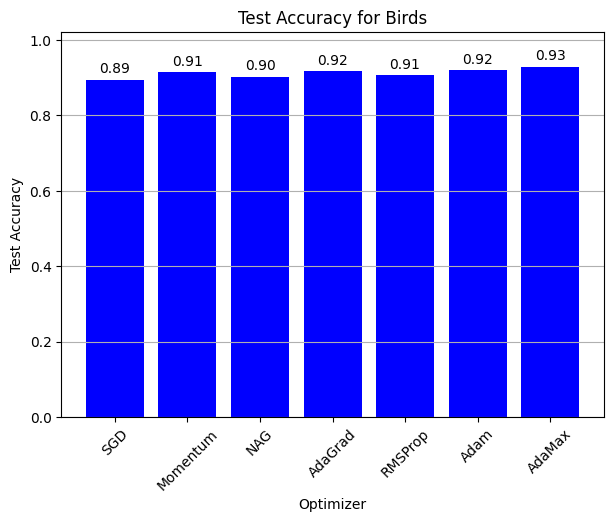

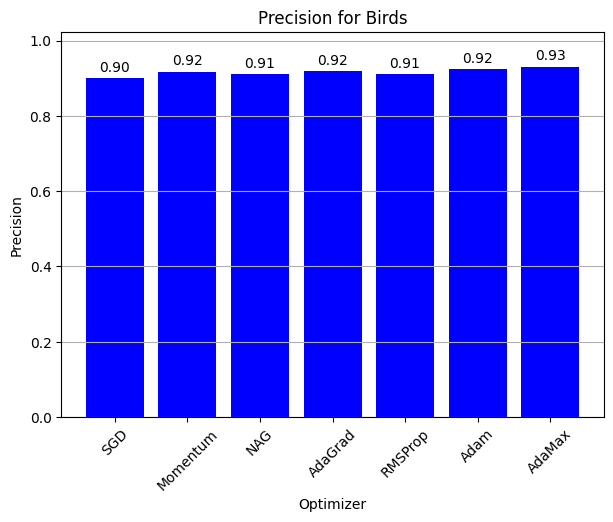

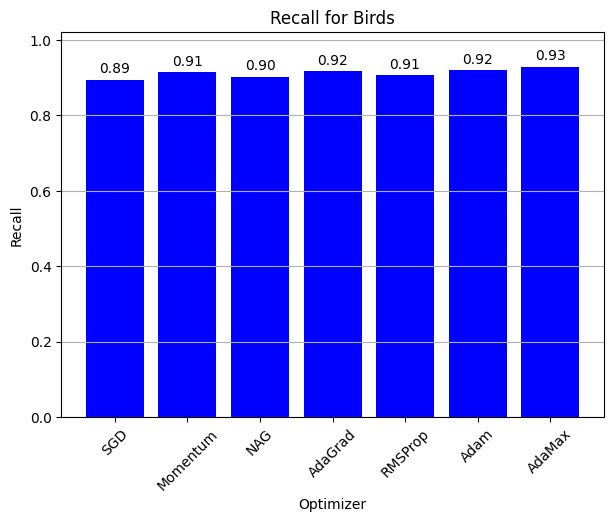

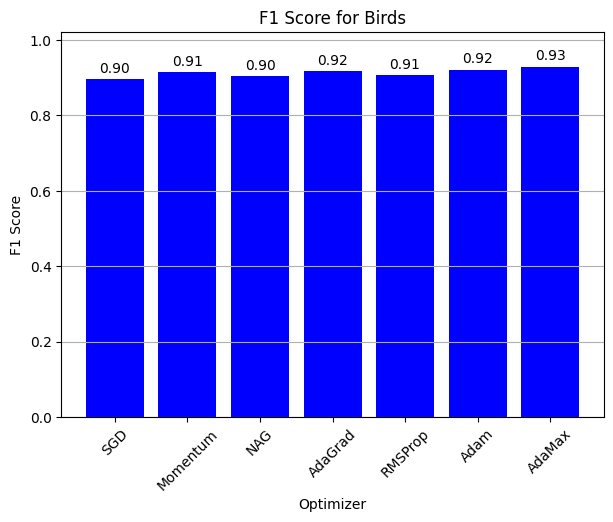

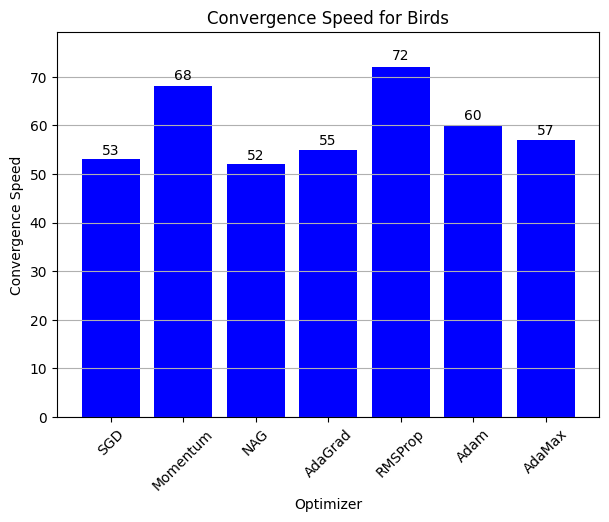

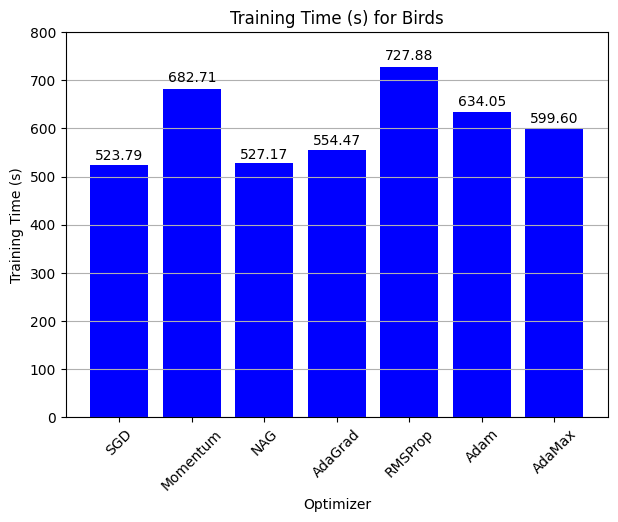

In [109]:
metrics = ["Test Accuracy", "Precision", "Recall", "F1 Score", "Convergence Speed", "Training Time (s)"]

for metric in metrics:
    plt.figure(figsize=(7, 5))

    subset = results_df[results_df["Dataset"] == "Birds"]

    bars = plt.bar(subset["Optimizer"], subset[metric], color='blue')
    plt.title(f"{metric} for Birds")
    plt.xlabel("Optimizer")
    plt.ylabel(metric)
    plt.xticks(rotation=45)
    plt.grid(axis='y')

    plt.ylim(0, max(subset[metric]) * 1.1)

    for bar in bars:
        yval = bar.get_height()
        if metric == "Convergence Speed":
            plt.text(bar.get_x() + bar.get_width() / 2, yval * 1.02, f'{int(yval)}', ha='center')
        else:
            plt.text(bar.get_x() + bar.get_width() / 2, yval * 1.02, f'{yval:.2f}', ha='center')

    plt.savefig(f"{metric}_Birds_comparison.png")

    plt.show()


**RAPORT KLASYFIKACJI DLA SIEDMIU OPTYMALIZATORÓW**

In [110]:
for optimizer_name, report in classification_reports.items():
    print(f"\nClassification Report - {optimizer_name} (Birds):\n")
    print(report)


Classification Report - SGD (Birds):

              precision    recall  f1-score   support

           0       0.97      0.94      0.95       150
           1       0.72      0.82      0.76       150
           2       0.94      0.89      0.92       150
           3       0.97      0.92      0.95       150
           4       0.99      0.92      0.96       150
           5       0.76      0.81      0.78       150
           6       0.85      0.82      0.84       150
           7       0.95      0.85      0.90       150
           8       0.94      0.89      0.92       150
           9       0.85      0.95      0.90       150
          10       0.92      0.93      0.93       150
          11       0.75      0.89      0.81       150
          12       0.79      0.80      0.79       150
          13       0.92      0.82      0.87       150
          14       0.98      0.89      0.93       150
          15       0.86      0.94      0.90       150
          16       0.96      0.92      0.9

**MACIERZ POMYŁEK DLA SIEDMIU OPTYMALIZATORÓW (TOP10 NAJCZĘSCIEJ MYLĄCYCH SIĘ KLAS)**

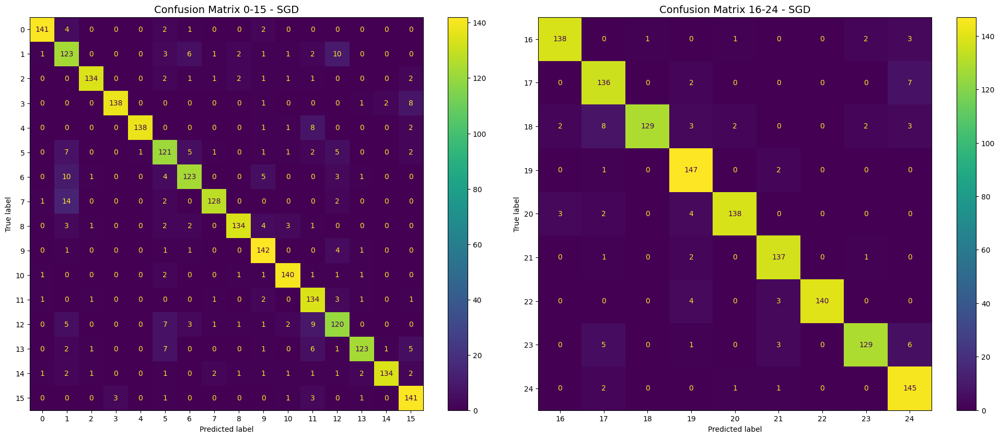

<Figure size 1170x830 with 0 Axes>

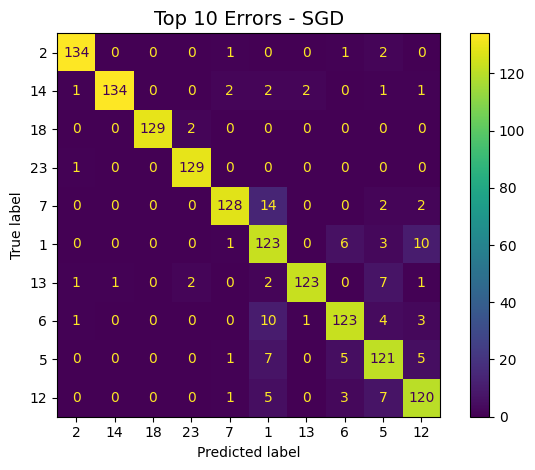

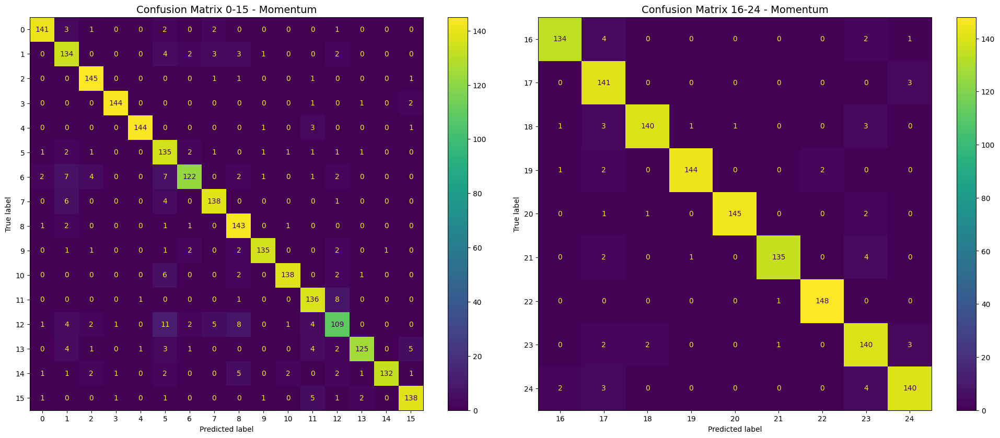

<Figure size 1170x830 with 0 Axes>

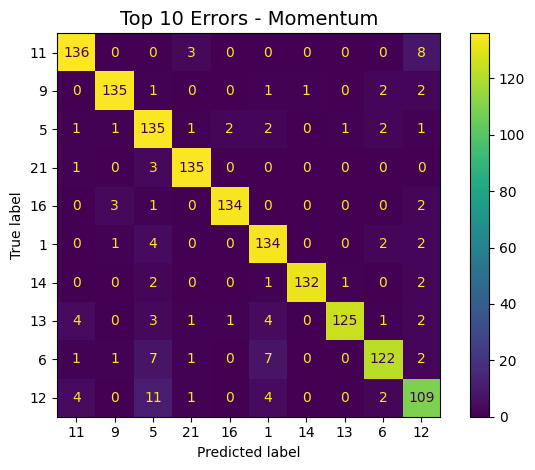

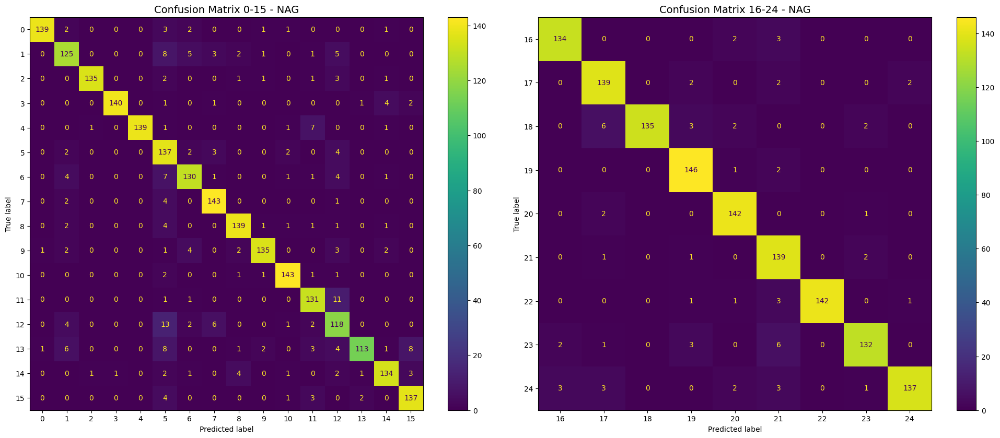

<Figure size 1170x830 with 0 Axes>

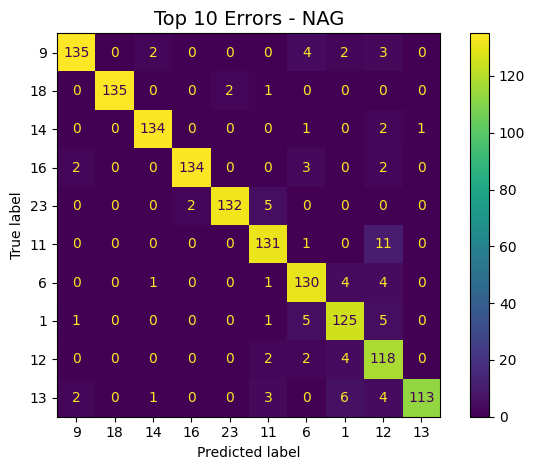

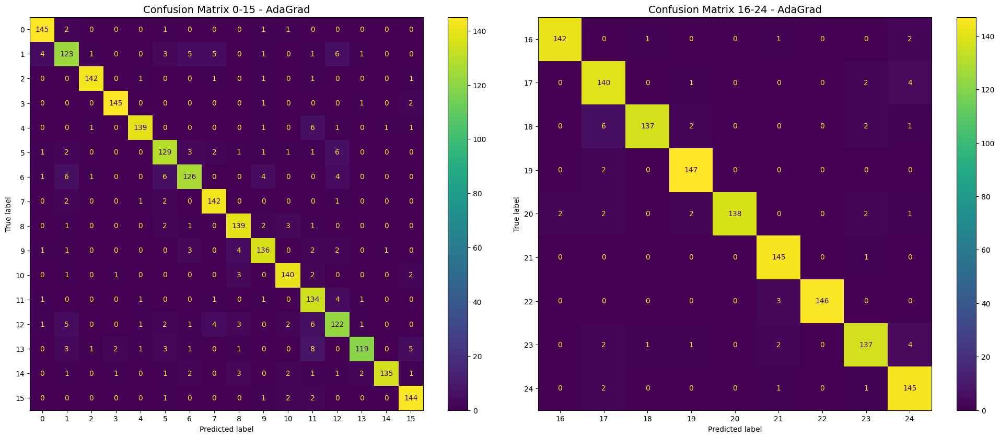

<Figure size 1170x830 with 0 Axes>

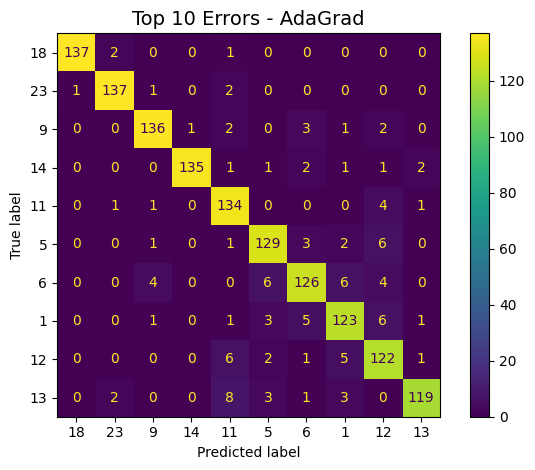

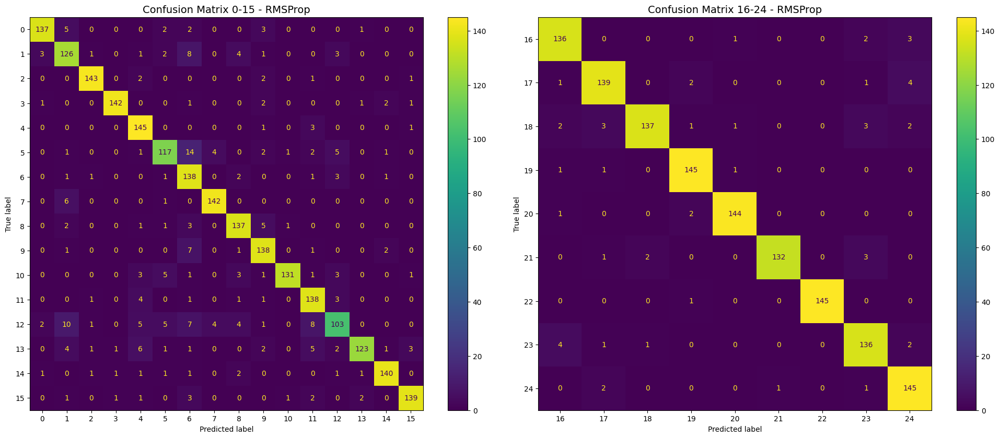

<Figure size 1170x830 with 0 Axes>

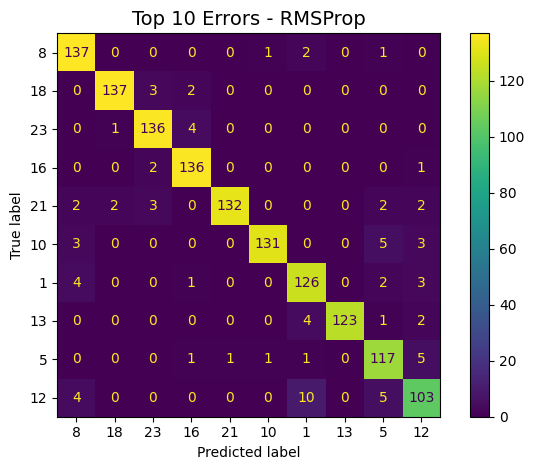

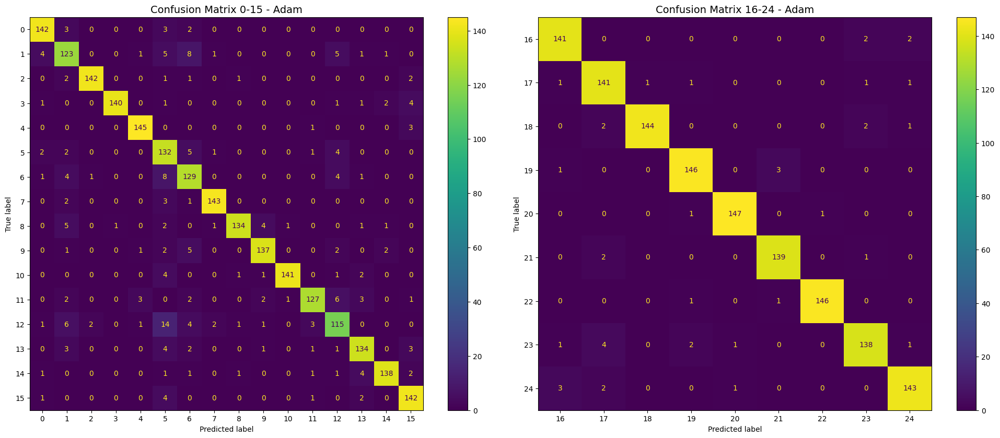

<Figure size 1170x830 with 0 Axes>

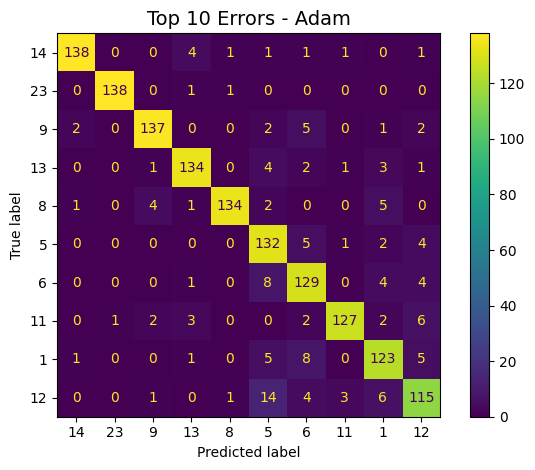

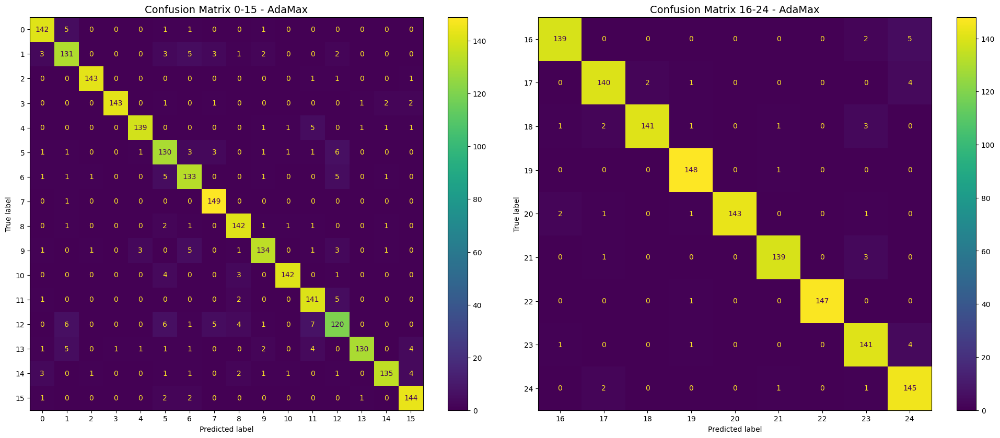

<Figure size 1170x830 with 0 Axes>

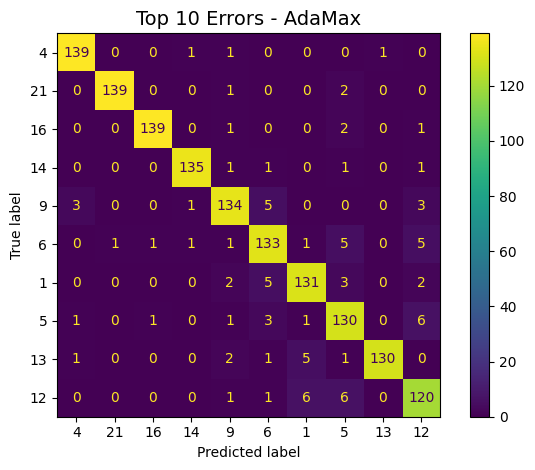

In [111]:
def filter_top_errors(cm, top_n=10):
    errors = np.sum(cm, axis=1) - np.diag(cm)
    top_classes = np.argsort(errors)[-top_n:]

    filtered_cm = cm[np.ix_(top_classes, top_classes)]
    return filtered_cm, top_classes
for optimizer_name, cm in confusion_matrices.items():
    fig, axes = plt.subplots(1, 2, figsize=(20, 8))

    max_classes = cm.shape[0]
    disp_0_15 = ConfusionMatrixDisplay(confusion_matrix=cm[:16, :16], display_labels=np.arange(0, min(16, max_classes)))
    disp_0_15.plot(cmap='viridis', values_format='d', ax=axes[0])
    axes[0].set_title(f"Confusion Matrix 0-15 - {optimizer_name}", fontsize=14)
    axes[0].tick_params(axis='both', labelsize=10)

    start_idx = 16
    end_idx = min(max_classes, 26)
    disp_16_25 = ConfusionMatrixDisplay(confusion_matrix=cm[start_idx:end_idx, start_idx:end_idx],
                                        display_labels=np.arange(start_idx, end_idx))
    disp_16_25.plot(cmap='viridis', values_format='d', ax=axes[1])
    axes[1].set_title(f"Confusion Matrix {start_idx}-{end_idx-1} - {optimizer_name}", fontsize=14)
    axes[1].tick_params(axis='both', labelsize=10)

    plt.tight_layout()
    plt.show()

    plt.figure(figsize=(11.7, 8.3))
    filtered_cm, top_classes = filter_top_errors(cm, top_n=10)
    disp_top_10 = ConfusionMatrixDisplay(confusion_matrix=filtered_cm, display_labels=top_classes)
    disp_top_10.plot(cmap='viridis', values_format='d')
    plt.title(f"Top 10 Errors - {optimizer_name}", fontsize=14)
    plt.xticks(fontsize=10)
    plt.yticks(fontsize=10)
    plt.grid(False)
    plt.tight_layout()
    plt.show()


**KRZYWE ROC - AUC DLA SIEDMIU OPTYMALIZATORÓW**

Generowanie krzywej ROC-AUC dla optymalizatora: SGD
Generowanie krzywej ROC-AUC dla optymalizatora: Momentum
Generowanie krzywej ROC-AUC dla optymalizatora: NAG
Generowanie krzywej ROC-AUC dla optymalizatora: AdaGrad
Generowanie krzywej ROC-AUC dla optymalizatora: RMSProp
Generowanie krzywej ROC-AUC dla optymalizatora: Adam
Generowanie krzywej ROC-AUC dla optymalizatora: AdaMax


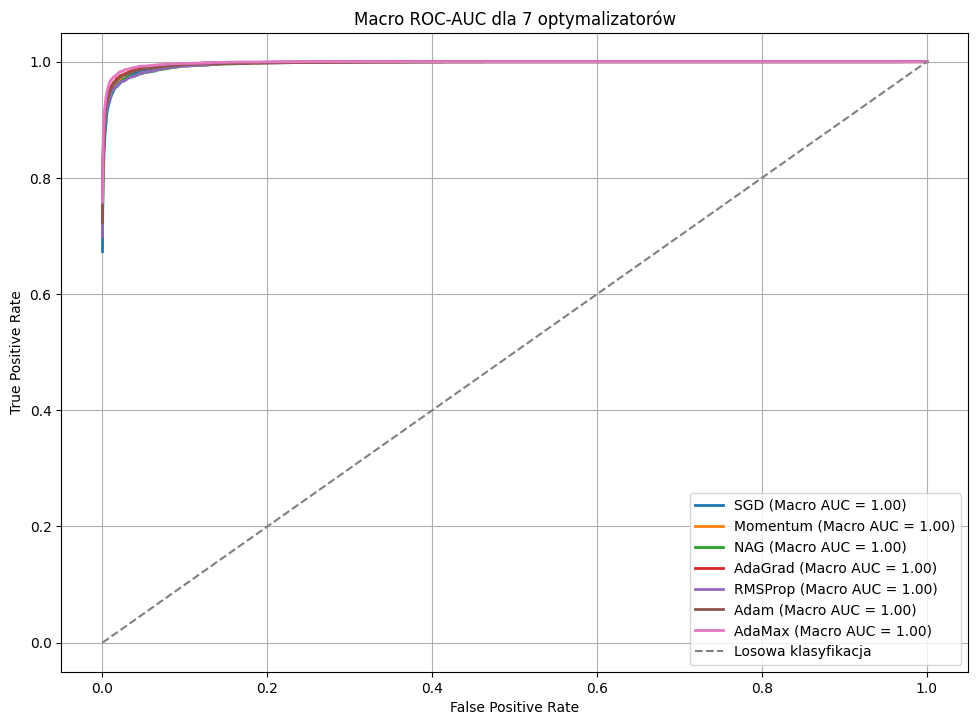

In [112]:
plt.figure(figsize=(11.7, 8.3))

y_test_binarized = label_binarize(y_test, classes=np.arange(num_classes))

for optimizer_name, y_pred_prob in y_pred_probs.items():
    print(f"Generowanie krzywej ROC-AUC dla optymalizatora: {optimizer_name}")

    fpr_macro = np.unique(np.concatenate([
        roc_curve(y_test_binarized[:, j], y_pred_prob[:, j])[0]
        for j in range(num_classes) if np.sum(y_test_binarized[:, j]) > 0
    ]))

    mean_tpr = np.zeros_like(fpr_macro)

    for j in range(num_classes):
        if np.sum(y_test_binarized[:, j]) == 0:
            continue
        fpr, tpr, _ = roc_curve(y_test_binarized[:, j], y_pred_prob[:, j])
        mean_tpr += np.interp(fpr_macro, fpr, tpr)

    mean_tpr /= num_classes
    auc_macro = auc(fpr_macro, mean_tpr)

    plt.plot(fpr_macro, mean_tpr, linestyle='-', label=f'{optimizer_name} (Macro AUC = {auc_macro:.2f})', linewidth=2)

plt.plot([0, 1], [0, 1], color='gray', linestyle='--', label='Losowa klasyfikacja')

plt.title("Macro ROC-AUC dla 7 optymalizatorów")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.legend(loc="lower right")
plt.grid(True)

plt.savefig("Macro_ROC_AUC_25_classes.png")
plt.show()


# **MODEL ZAAWANSOWANY - 7 WARSTW CONV**

**ARCHITEKTURA MODELU 7 - WARSTWOWEGO**

In [113]:
def seven_layer_model(input_shape, num_classes):
    model = models.Sequential([

        layers.Conv2D(64, (3, 3), activation='relu', padding='same', input_shape=input_shape),
        layers.BatchNormalization(),
        layers.MaxPooling2D((2, 2)),
        layers.Dropout(0.2),


        layers.Conv2D(128, (3, 3), activation='relu', padding='same'),
        layers.BatchNormalization(),
        layers.MaxPooling2D((2, 2)),
        layers.Dropout(0.3),


        layers.Conv2D(256, (3, 3), activation='relu', padding='same'),
        layers.BatchNormalization(),
        layers.MaxPooling2D((2, 2)),
        layers.Dropout(0.3),


        layers.Conv2D(512, (3, 3), activation='relu', padding='same'),
        layers.BatchNormalization(),
        layers.MaxPooling2D((2, 2)),
        layers.Dropout(0.4),


        layers.Conv2D(512, (3, 3), activation='relu', padding='same'),
        layers.BatchNormalization(),
        layers.MaxPooling2D((2, 2)),
        layers.Dropout(0.4),


        layers.Conv2D(1024, (3, 3), activation='relu', padding='same'),
        layers.BatchNormalization(),
        layers.Dropout(0.5),


        layers.Conv2D(1024, (3, 3), activation='relu', padding='same'),
        layers.BatchNormalization(),
        layers.Dropout(0.5),


        layers.GlobalAveragePooling2D(),
        layers.Dense(512, activation='relu'),
        layers.Dropout(0.5),
        layers.Dense(num_classes, activation='softmax')
    ])
    return model

**PROCES TRENINGU MODELU**

In [114]:
EPOCHS = 100
results = []
classification_reports = {}
y_pred_probs = {}
confusion_matrices = {}

optimizers = {
    'SGD': SGD(learning_rate=0.01),
    'Momentum': SGD(learning_rate=0.01, momentum=0.9),
    'NAG': SGD(learning_rate=0.01, momentum=0.9, nesterov=True),
    'AdaGrad': Adagrad(learning_rate=0.01),
    'RMSProp': RMSprop(learning_rate=0.001),
    'Adam': Adam(learning_rate=0.001),
    'AdaMax': Adamax(learning_rate=0.001),
}
for optimizer_name, optimizer in optimizers.items():
        print(f"\nTrening modelu Birds z optymalizatorem: {optimizer_name}")

        model = seven_layer_model(input_shape, num_classes)
        model.compile(optimizer=optimizer,
                      loss='sparse_categorical_crossentropy',
                      metrics=['accuracy'])

        early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

        start_time = time.time()
        history = model.fit(
            X_train, y_train,
            validation_data=(X_val, y_val),
            epochs=EPOCHS,
            callbacks=[early_stopping],
            verbose=1
        )
        elapsed_time = time.time() - start_time

        test_loss, test_accuracy = model.evaluate(X_test, y_test, verbose=0)
        y_pred = np.argmax(model.predict(X_test), axis=-1)
        y_true = y_test
        precision, recall, f1, _ = precision_recall_fscore_support(y_true, y_pred, average="weighted",zero_division=0)
        accuracy = accuracy_score(y_true, y_pred)

        results.append({
            "Dataset": "Birds",
            "Optimizer": optimizer_name,
            "Test Accuracy": accuracy,
            "Precision": precision,
            "Recall": recall,
            "F1 Score": f1,
            "Convergence Speed": len(history.history['loss']),
            "Training Time (s)": elapsed_time,
            "Test Loss": test_loss
        })
        classification_reports[optimizer_name] = classification_report(y_true, y_pred, target_names=[str(i) for i in np.unique(y_true)], zero_division=0)


        y_pred_probs[optimizer_name] = model.predict(X_test)
        confusion_matrices[optimizer_name] = confusion_matrix(y_true, y_pred)


Trening modelu Birds z optymalizatorem: SGD


/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
938/938 ━━━━━━━━━━━━━━━━━━━━ 40s 32ms/step - accuracy: 0.1090 - loss: 3.0262 - val_accuracy: 0.0715 - val_loss: 5.4892
Epoch 2/100
938/938 ━━━━━━━━━━━━━━━━━━━━ 11s 12ms/step - accuracy: 0.2510 - loss: 2.3801 - val_accuracy: 0.2117 - val_loss: 3.1524
Epoch 3/100
938/938 ━━━━━━━━━━━━━━━━━━━━ 11s 12ms/step - accuracy: 0.3571 - loss: 2.0201 - val_accuracy: 0.3645 - val_loss: 2.1703
Epoch 4/100
938/938 ━━━━━━━━━━━━━━━━━━━━ 11s 12ms/step - accuracy: 0.4376 - loss: 1.7593 - val_accuracy: 0.4488 - val_loss: 1.9402
Epoch 5/100
938/938 ━━━━━━━━━━━━━━━━━━━━ 11s 12ms/step - accuracy: 0.4925 - loss: 1.5750 - val_accuracy: 0.4485 - val_loss: 2.0867
Epoch 6/100
938/938 ━━━━━━━━━━━━━━━━━━━━ 11s 12ms/step - accuracy: 0.5428 - loss: 1.4095 - val_accuracy: 0.3525 - val_loss: 3.1734
Epoch 7/100
938/938 ━━━━━━━━━━━━━━━━━━━━ 11s 12ms/step - accuracy: 0.5865 - loss: 1.2836 - val_accuracy: 0.4056 - val_loss: 2.4201
Epoch 8/100
938/938 ━━━━━━━━━━━━━━━━━━━━ 11s 12ms/step - accuracy: 0.6343 - loss: 1

/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
938/938 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - accuracy: 0.1392 - loss: 3.0656 - val_accuracy: 0.3333 - val_loss: 2.1124
Epoch 2/100
938/938 ━━━━━━━━━━━━━━━━━━━━ 12s 13ms/step - accuracy: 0.3545 - loss: 2.0289 - val_accuracy: 0.3443 - val_loss: 2.2313
Epoch 3/100
938/938 ━━━━━━━━━━━━━━━━━━━━ 12s 13ms/step - accuracy: 0.4577 - loss: 1.6936 - val_accuracy: 0.4976 - val_loss: 1.7102
Epoch 4/100
938/938 ━━━━━━━━━━━━━━━━━━━━ 12s 13ms/step - accuracy: 0.5468 - loss: 1.4220 - val_accuracy: 0.6179 - val_loss: 1.2766
Epoch 5/100
938/938 ━━━━━━━━━━━━━━━━━━━━ 12s 13ms/step - accuracy: 0.6229 - loss: 1.1933 - val_accuracy: 0.6435 - val_loss: 1.1976
Epoch 6/100
938/938 ━━━━━━━━━━━━━━━━━━━━ 12s 13ms/step - accuracy: 0.6714 - loss: 1.0370 - val_accuracy: 0.6016 - val_loss: 1.4269
Epoch 7/100
938/938 ━━━━━━━━━━━━━━━━━━━━ 12s 13ms/step - accuracy: 0.7181 - loss: 0.9111 - val_accuracy: 0.7683 - val_loss: 0.8040
Epoch 8/100
938/938 ━━━━━━━━━━━━━━━━━━━━ 12s 13ms/step - accuracy: 0.7506 - loss: 0

/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
938/938 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - accuracy: 0.1565 - loss: 2.9410 - val_accuracy: 0.2621 - val_loss: 2.3995
Epoch 2/100
938/938 ━━━━━━━━━━━━━━━━━━━━ 13s 13ms/step - accuracy: 0.3811 - loss: 1.9433 - val_accuracy: 0.4717 - val_loss: 1.7223
Epoch 3/100
938/938 ━━━━━━━━━━━━━━━━━━━━ 12s 13ms/step - accuracy: 0.5020 - loss: 1.5716 - val_accuracy: 0.4229 - val_loss: 2.0455
Epoch 4/100
938/938 ━━━━━━━━━━━━━━━━━━━━ 12s 13ms/step - accuracy: 0.5825 - loss: 1.3212 - val_accuracy: 0.5613 - val_loss: 1.5072
Epoch 5/100
938/938 ━━━━━━━━━━━━━━━━━━━━ 12s 13ms/step - accuracy: 0.6505 - loss: 1.1199 - val_accuracy: 0.6208 - val_loss: 1.2545
Epoch 6/100
938/938 ━━━━━━━━━━━━━━━━━━━━ 12s 13ms/step - accuracy: 0.7027 - loss: 0.9473 - val_accuracy: 0.6656 - val_loss: 1.1554
Epoch 7/100
938/938 ━━━━━━━━━━━━━━━━━━━━ 12s 13ms/step - accuracy: 0.7406 - loss: 0.8269 - val_accuracy: 0.7205 - val_loss: 0.9460
Epoch 8/100
938/938 ━━━━━━━━━━━━━━━━━━━━ 12s 13ms/step - accuracy: 0.7709 - loss: 0

/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
938/938 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - accuracy: 0.1447 - loss: 2.9140 - val_accuracy: 0.2987 - val_loss: 2.3656
Epoch 2/100
938/938 ━━━━━━━━━━━━━━━━━━━━ 12s 13ms/step - accuracy: 0.3750 - loss: 1.9505 - val_accuracy: 0.4408 - val_loss: 1.9028
Epoch 3/100
938/938 ━━━━━━━━━━━━━━━━━━━━ 12s 13ms/step - accuracy: 0.4936 - loss: 1.5818 - val_accuracy: 0.4608 - val_loss: 2.0723
Epoch 4/100
938/938 ━━━━━━━━━━━━━━━━━━━━ 12s 13ms/step - accuracy: 0.5800 - loss: 1.3252 - val_accuracy: 0.6451 - val_loss: 1.2125
Epoch 5/100
938/938 ━━━━━━━━━━━━━━━━━━━━ 12s 13ms/step - accuracy: 0.6398 - loss: 1.1293 - val_accuracy: 0.6667 - val_loss: 1.1110
Epoch 6/100
938/938 ━━━━━━━━━━━━━━━━━━━━ 12s 13ms/step - accuracy: 0.6784 - loss: 1.0129 - val_accuracy: 0.6877 - val_loss: 1.0388
Epoch 7/100
938/938 ━━━━━━━━━━━━━━━━━━━━ 12s 13ms/step - accuracy: 0.7203 - loss: 0.8845 - val_accuracy: 0.7245 - val_loss: 0.9257
Epoch 8/100
938/938 ━━━━━━━━━━━━━━━━━━━━ 12s 13ms/step - accuracy: 0.7492 - loss: 0

/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
938/938 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - accuracy: 0.1666 - loss: 3.1747 - val_accuracy: 0.3864 - val_loss: 1.9529
Epoch 2/100
938/938 ━━━━━━━━━━━━━━━━━━━━ 12s 13ms/step - accuracy: 0.4026 - loss: 1.8798 - val_accuracy: 0.4389 - val_loss: 1.8501
Epoch 3/100
938/938 ━━━━━━━━━━━━━━━━━━━━ 12s 13ms/step - accuracy: 0.5113 - loss: 1.5699 - val_accuracy: 0.5373 - val_loss: 1.6053
Epoch 4/100
938/938 ━━━━━━━━━━━━━━━━━━━━ 12s 13ms/step - accuracy: 0.6089 - loss: 1.2902 - val_accuracy: 0.5731 - val_loss: 1.4085
Epoch 5/100
938/938 ━━━━━━━━━━━━━━━━━━━━ 12s 13ms/step - accuracy: 0.6644 - loss: 1.1057 - val_accuracy: 0.7133 - val_loss: 0.9903
Epoch 6/100
938/938 ━━━━━━━━━━━━━━━━━━━━ 12s 13ms/step - accuracy: 0.7113 - loss: 0.9777 - val_accuracy: 0.7123 - val_loss: 1.0220
Epoch 7/100
938/938 ━━━━━━━━━━━━━━━━━━━━ 12s 13ms/step - accuracy: 0.7334 - loss: 0.9016 - val_accuracy: 0.7392 - val_loss: 0.8952
Epoch 8/100
938/938 ━━━━━━━━━━━━━━━━━━━━ 12s 13ms/step - accuracy: 0.7544 - loss: 0

/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
938/938 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - accuracy: 0.1793 - loss: 3.0179 - val_accuracy: 0.4723 - val_loss: 1.6821
Epoch 2/100
938/938 ━━━━━━━━━━━━━━━━━━━━ 13s 14ms/step - accuracy: 0.4753 - loss: 1.6501 - val_accuracy: 0.6035 - val_loss: 1.2306
Epoch 3/100
938/938 ━━━━━━━━━━━━━━━━━━━━ 13s 14ms/step - accuracy: 0.6074 - loss: 1.2461 - val_accuracy: 0.6533 - val_loss: 1.1108
Epoch 4/100
938/938 ━━━━━━━━━━━━━━━━━━━━ 13s 14ms/step - accuracy: 0.6780 - loss: 1.0181 - val_accuracy: 0.7125 - val_loss: 0.9498
Epoch 5/100
938/938 ━━━━━━━━━━━━━━━━━━━━ 13s 14ms/step - accuracy: 0.7419 - loss: 0.8366 - val_accuracy: 0.7493 - val_loss: 0.8078
Epoch 6/100
938/938 ━━━━━━━━━━━━━━━━━━━━ 13s 14ms/step - accuracy: 0.7769 - loss: 0.7350 - val_accuracy: 0.7869 - val_loss: 0.6926
Epoch 7/100
938/938 ━━━━━━━━━━━━━━━━━━━━ 13s 14ms/step - accuracy: 0.8023 - loss: 0.6375 - val_accuracy: 0.7901 - val_loss: 0.7682
Epoch 8/100
938/938 ━━━━━━━━━━━━━━━━━━━━ 13s 14ms/step - accuracy: 0.8255 - loss: 0

/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
938/938 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - accuracy: 0.1594 - loss: 3.1130 - val_accuracy: 0.4040 - val_loss: 1.9195
Epoch 2/100
938/938 ━━━━━━━━━━━━━━━━━━━━ 13s 14ms/step - accuracy: 0.4529 - loss: 1.7412 - val_accuracy: 0.5728 - val_loss: 1.3430
Epoch 3/100
938/938 ━━━━━━━━━━━━━━━━━━━━ 13s 14ms/step - accuracy: 0.6063 - loss: 1.2466 - val_accuracy: 0.6837 - val_loss: 1.0320
Epoch 4/100
938/938 ━━━━━━━━━━━━━━━━━━━━ 13s 14ms/step - accuracy: 0.7038 - loss: 0.9575 - val_accuracy: 0.7115 - val_loss: 0.9100
Epoch 5/100
938/938 ━━━━━━━━━━━━━━━━━━━━ 13s 14ms/step - accuracy: 0.7641 - loss: 0.7574 - val_accuracy: 0.7325 - val_loss: 0.8818
Epoch 6/100
938/938 ━━━━━━━━━━━━━━━━━━━━ 13s 14ms/step - accuracy: 0.8022 - loss: 0.6295 - val_accuracy: 0.8024 - val_loss: 0.6443
Epoch 7/100
938/938 ━━━━━━━━━━━━━━━━━━━━ 13s 14ms/step - accuracy: 0.8245 - loss: 0.5632 - val_accuracy: 0.8147 - val_loss: 0.6081
Epoch 8/100
938/938 ━━━━━━━━━━━━━━━━━━━━ 13s 14ms/step - accuracy: 0.8521 - loss: 0

**ZAPIS DO CSV**

In [115]:
results_df = pd.DataFrame(results)
results_df.to_csv("training_results.csv", index=False)

**PREZENTACJA WYNIKÓW W FORMIE WYKRESÓW**

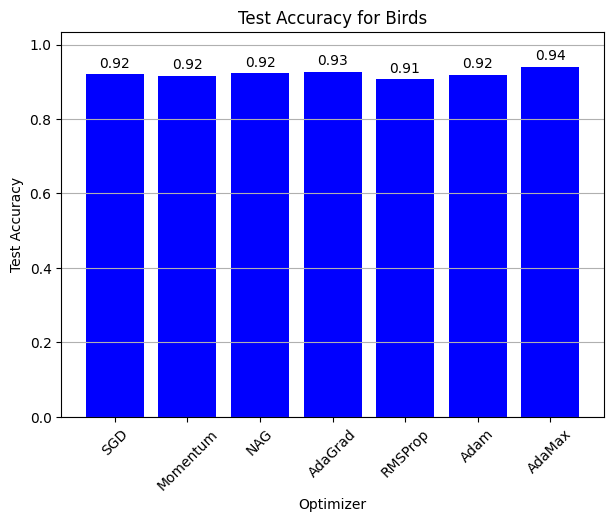

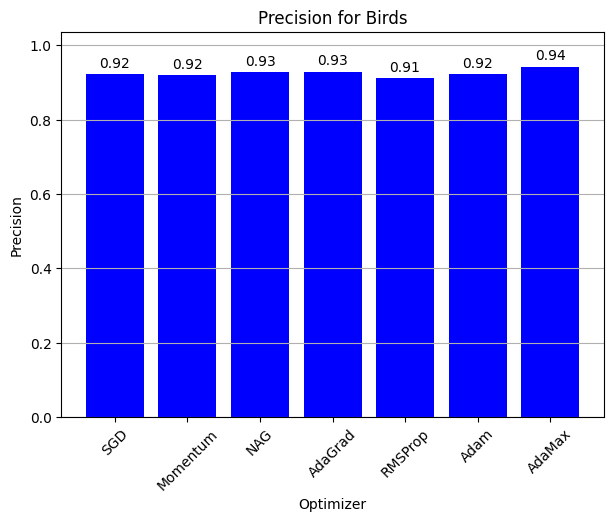

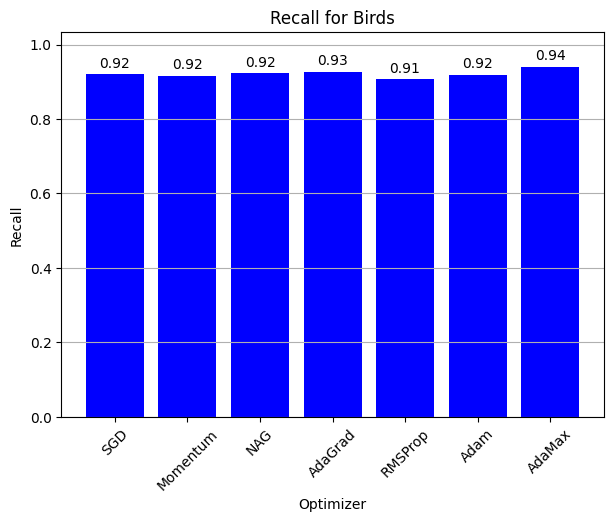

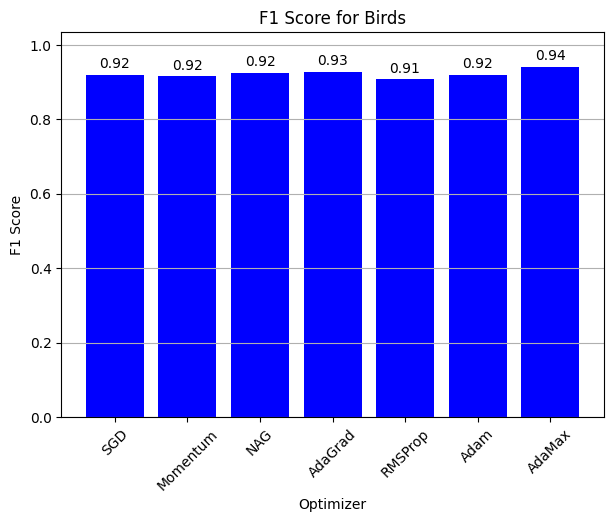

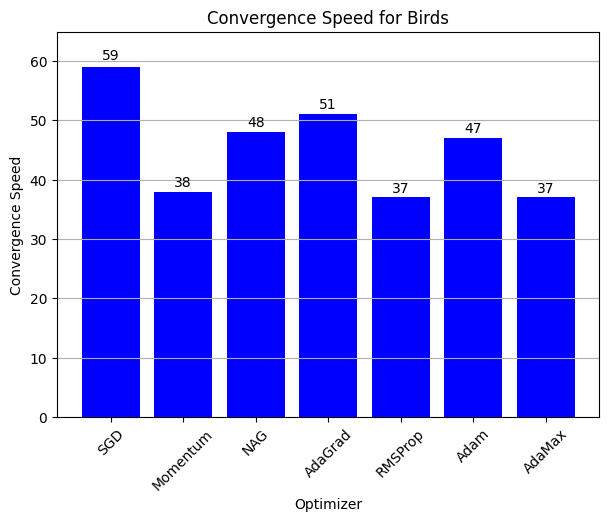

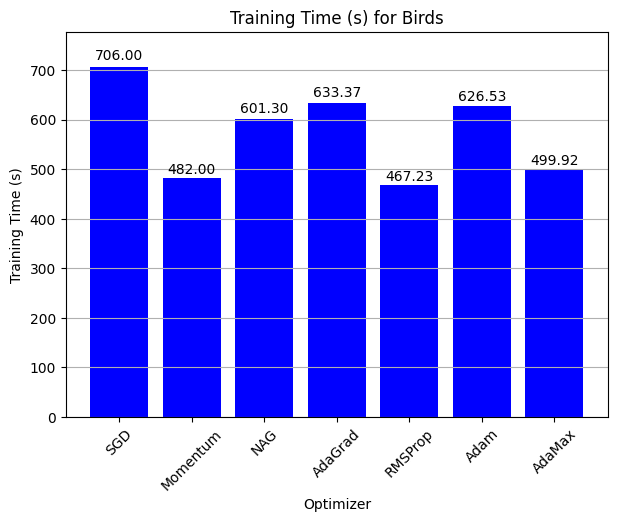

In [116]:
metrics = ["Test Accuracy", "Precision", "Recall", "F1 Score", "Convergence Speed", "Training Time (s)"]

for metric in metrics:
    plt.figure(figsize=(7, 5))

    subset = results_df[results_df["Dataset"] == "Birds"]

    bars = plt.bar(subset["Optimizer"], subset[metric], color='blue')
    plt.title(f"{metric} for Birds")
    plt.xlabel("Optimizer")
    plt.ylabel(metric)
    plt.xticks(rotation=45)
    plt.grid(axis='y')

    plt.ylim(0, max(subset[metric]) * 1.1)

    for bar in bars:
        yval = bar.get_height()
        if metric == "Convergence Speed":
            plt.text(bar.get_x() + bar.get_width() / 2, yval * 1.02, f'{int(yval)}', ha='center')
        else:
            plt.text(bar.get_x() + bar.get_width() / 2, yval * 1.02, f'{yval:.2f}', ha='center')

    plt.savefig(f"{metric}_Birds_comparison.png")

    plt.show()


**RAPORT KLASYFIKACJI DLA SIEDMIU OPTYMALIZATORÓW**

In [117]:
for optimizer_name, report in classification_reports.items():
    print(f"\nClassification Report - {optimizer_name} (Birds):\n")
    print(report)


Classification Report - SGD (Birds):

              precision    recall  f1-score   support

           0       0.94      0.96      0.95       150
           1       0.91      0.83      0.87       150
           2       0.99      0.95      0.97       150
           3       0.97      0.96      0.96       150
           4       0.98      0.95      0.96       150
           5       0.80      0.91      0.85       150
           6       0.86      0.85      0.86       150
           7       0.93      0.93      0.93       150
           8       0.87      0.93      0.90       150
           9       0.92      0.95      0.93       150
          10       0.95      0.99      0.97       150
          11       0.84      0.93      0.88       150
          12       0.82      0.79      0.80       150
          13       0.98      0.82      0.89       150
          14       0.95      0.91      0.93       150
          15       0.88      0.97      0.93       150
          16       0.98      0.93      0.9

**MACIERZ POMYŁEK TOP10 NAJBARDZIEJ MYLĄCYCH SIĘ KLAS**

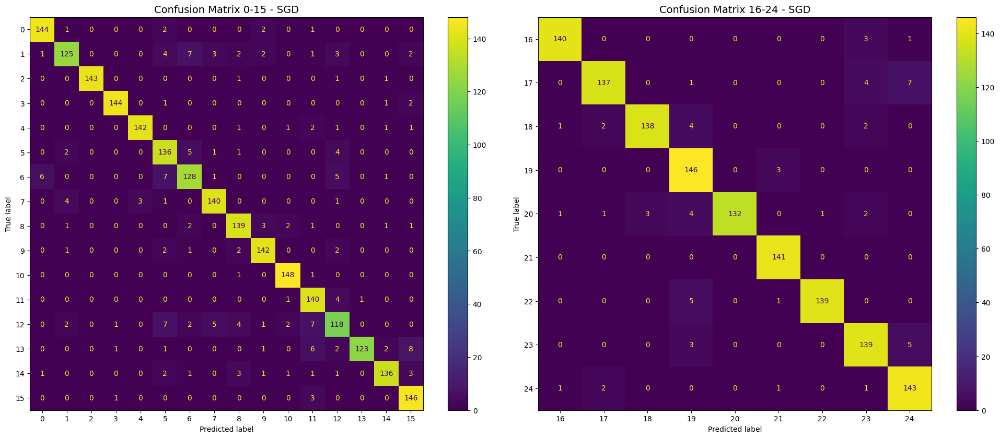

<Figure size 1170x830 with 0 Axes>

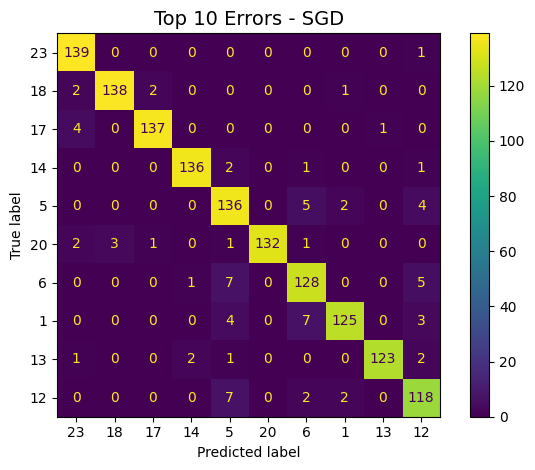

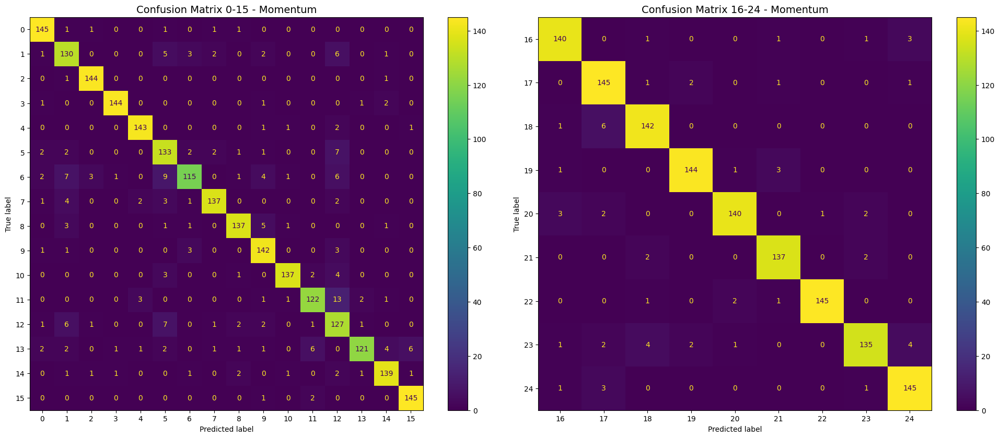

<Figure size 1170x830 with 0 Axes>

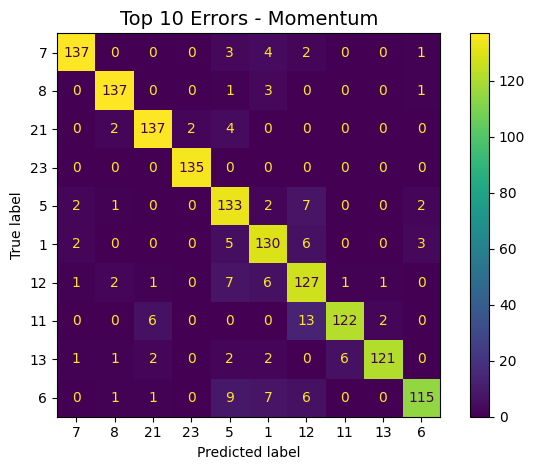

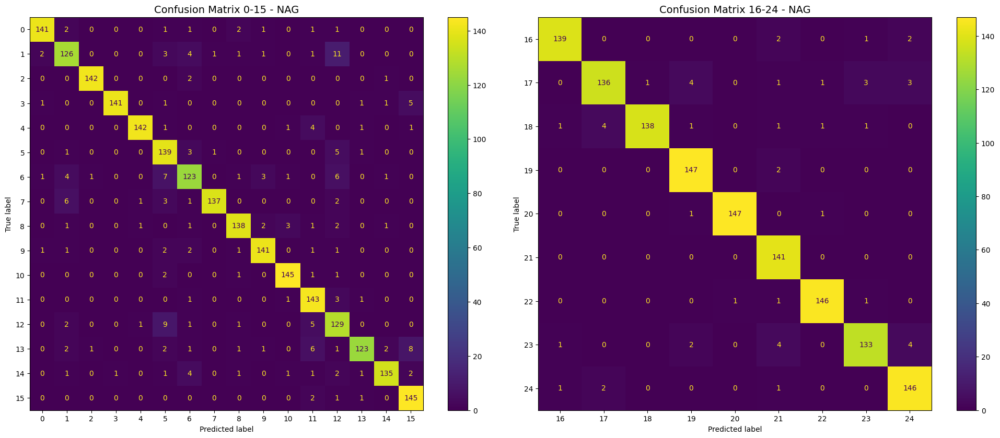

<Figure size 1170x830 with 0 Axes>

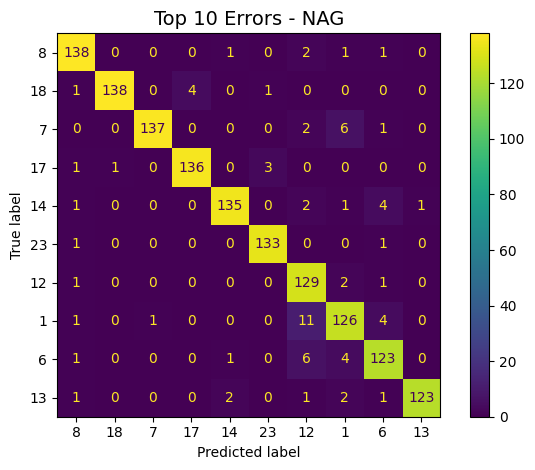

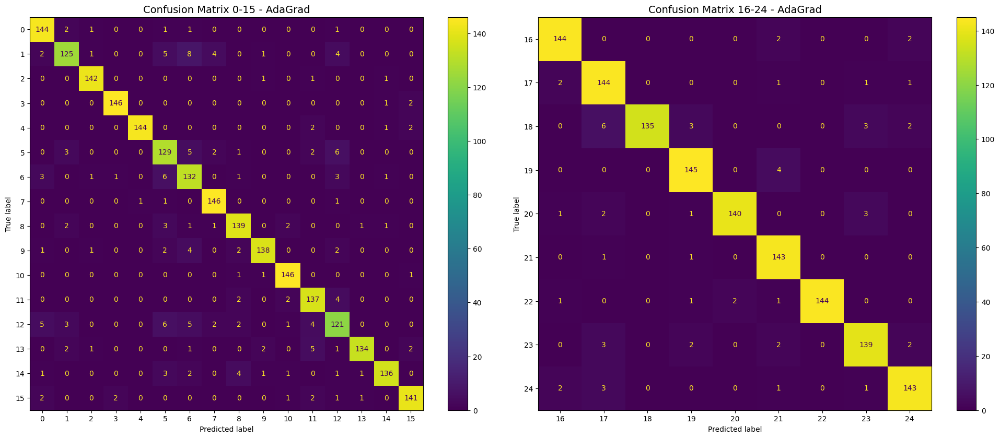

<Figure size 1170x830 with 0 Axes>

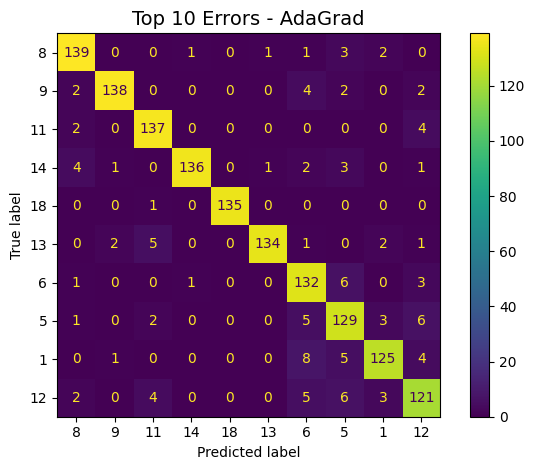

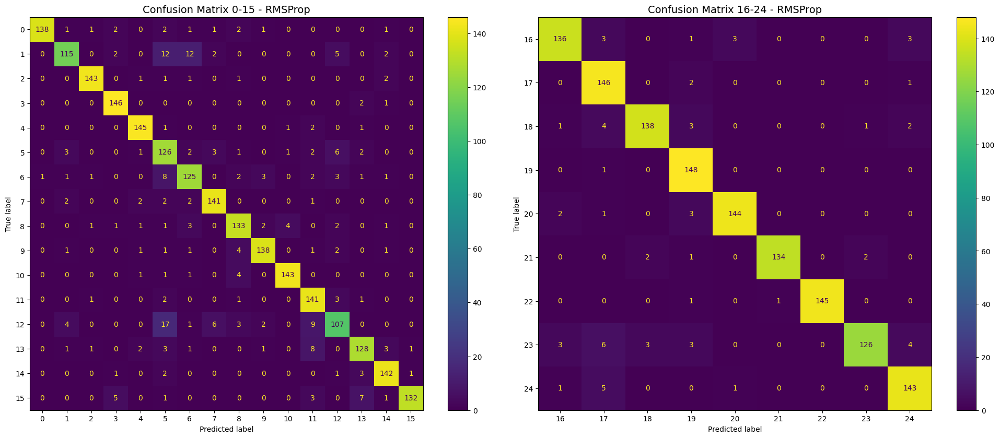

<Figure size 1170x830 with 0 Axes>

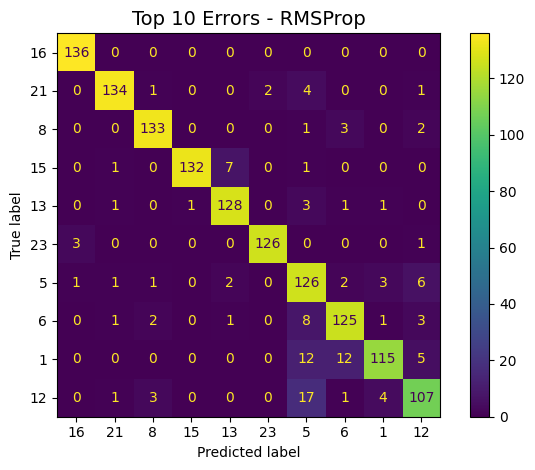

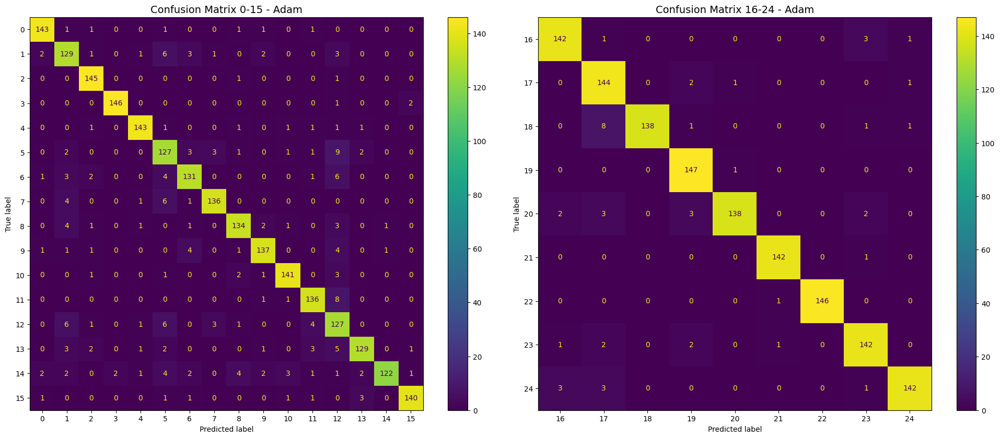

<Figure size 1170x830 with 0 Axes>

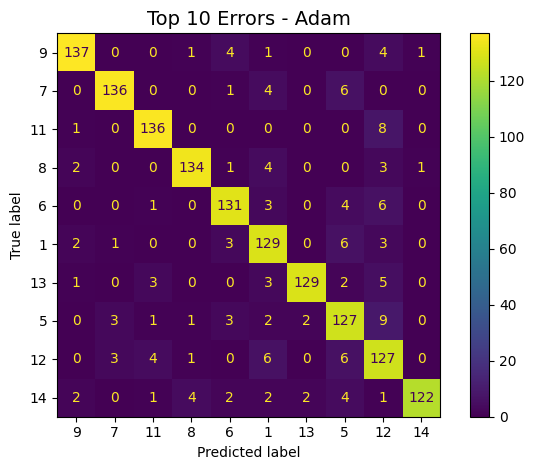

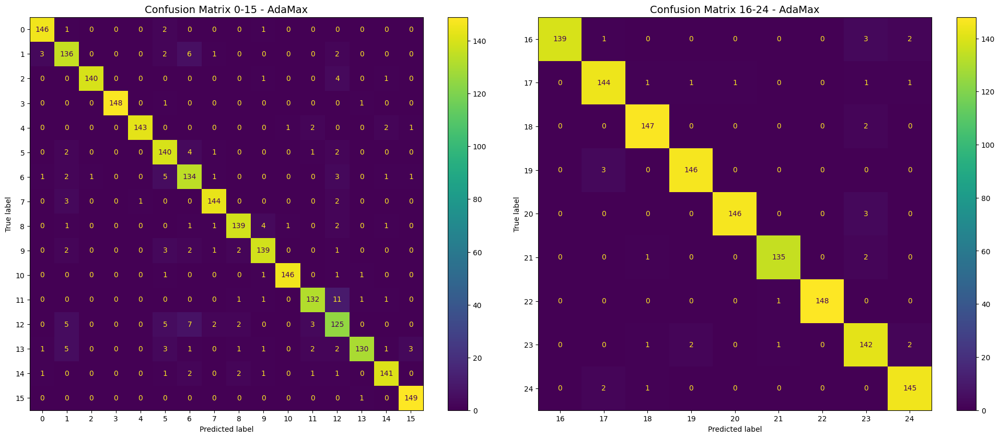

<Figure size 1170x830 with 0 Axes>

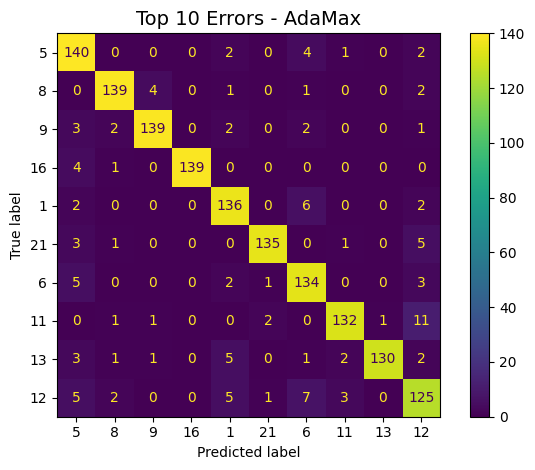

In [118]:
def filter_top_errors(cm, top_n=10):
    errors = np.sum(cm, axis=1) - np.diag(cm)
    top_classes = np.argsort(errors)[-top_n:]

    filtered_cm = cm[np.ix_(top_classes, top_classes)]
    return filtered_cm, top_classes
for optimizer_name, cm in confusion_matrices.items():
    fig, axes = plt.subplots(1, 2, figsize=(20, 8))

    max_classes = cm.shape[0]
    disp_0_15 = ConfusionMatrixDisplay(confusion_matrix=cm[:16, :16], display_labels=np.arange(0, min(16, max_classes)))
    disp_0_15.plot(cmap='viridis', values_format='d', ax=axes[0])
    axes[0].set_title(f"Confusion Matrix 0-15 - {optimizer_name}", fontsize=14)
    axes[0].tick_params(axis='both', labelsize=10)

    start_idx = 16
    end_idx = min(max_classes, 26)
    disp_16_25 = ConfusionMatrixDisplay(confusion_matrix=cm[start_idx:end_idx, start_idx:end_idx],
                                        display_labels=np.arange(start_idx, end_idx))
    disp_16_25.plot(cmap='viridis', values_format='d', ax=axes[1])
    axes[1].set_title(f"Confusion Matrix {start_idx}-{end_idx-1} - {optimizer_name}", fontsize=14)
    axes[1].tick_params(axis='both', labelsize=10)

    plt.tight_layout()
    plt.show()

    plt.figure(figsize=(11.7, 8.3))
    filtered_cm, top_classes = filter_top_errors(cm, top_n=10)
    disp_top_10 = ConfusionMatrixDisplay(confusion_matrix=filtered_cm, display_labels=top_classes)
    disp_top_10.plot(cmap='viridis', values_format='d')
    plt.title(f"Top 10 Errors - {optimizer_name}", fontsize=14)
    plt.xticks(fontsize=10)
    plt.yticks(fontsize=10)
    plt.grid(False)
    plt.tight_layout()
    plt.show()


**KRZYWE ROC-AUC DLA SIEDMIU OPTYMALIZATORÓW**

Generowanie krzywej ROC-AUC dla optymalizatora: SGD
Generowanie krzywej ROC-AUC dla optymalizatora: Momentum
Generowanie krzywej ROC-AUC dla optymalizatora: NAG
Generowanie krzywej ROC-AUC dla optymalizatora: AdaGrad
Generowanie krzywej ROC-AUC dla optymalizatora: RMSProp
Generowanie krzywej ROC-AUC dla optymalizatora: Adam
Generowanie krzywej ROC-AUC dla optymalizatora: AdaMax


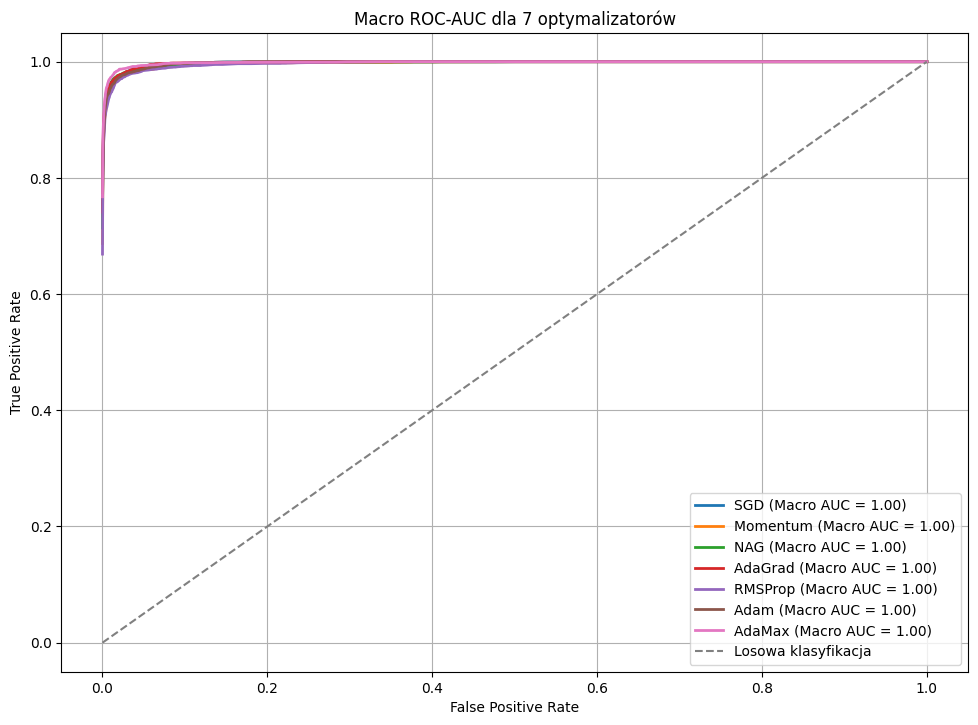

In [119]:
plt.figure(figsize=(11.7, 8.3))

y_test_binarized = label_binarize(y_test, classes=np.arange(num_classes))

for optimizer_name, y_pred_prob in y_pred_probs.items():
    print(f"Generowanie krzywej ROC-AUC dla optymalizatora: {optimizer_name}")

    fpr_macro = np.unique(np.concatenate([
        roc_curve(y_test_binarized[:, j], y_pred_prob[:, j])[0]
        for j in range(num_classes) if np.sum(y_test_binarized[:, j]) > 0
    ]))

    mean_tpr = np.zeros_like(fpr_macro)

    for j in range(num_classes):
        if np.sum(y_test_binarized[:, j]) == 0:
            continue
        fpr, tpr, _ = roc_curve(y_test_binarized[:, j], y_pred_prob[:, j])
        mean_tpr += np.interp(fpr_macro, fpr, tpr)

    mean_tpr /= num_classes
    auc_macro = auc(fpr_macro, mean_tpr)

    plt.plot(fpr_macro, mean_tpr, linestyle='-', label=f'{optimizer_name} (Macro AUC = {auc_macro:.2f})', linewidth=2)

plt.plot([0, 1], [0, 1], color='gray', linestyle='--', label='Losowa klasyfikacja')

plt.title("Macro ROC-AUC dla 7 optymalizatorów")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.legend(loc="lower right")
plt.grid(True)

plt.savefig("Macro_ROC_AUC_25_classes.png")
plt.show()


# **TRENING ZBIORU FOOD NA 3 MODELACH(niezbalansowany)**





In [135]:
X_train, y_train = X_train_food, y_train_food
X_val, y_val = X_val_food, y_val_food
X_test, y_test = X_test_food, y_test_food

input_shape = X_train.shape[1:]
num_classes = len(class_names_food)


# **MODEL PROSTY - 3 WARSTWY CONV**




**ARCHITEKTURA MODELU 3-WARSTWOWEGO**

In [136]:
def three_layer_model(input_shape, num_classes):
    model = models.Sequential([
        layers.Conv2D(64, (3, 3), activation='relu', input_shape=input_shape),

        layers.MaxPooling2D((2, 2)),
        layers.Dropout(0.2),

        layers.Conv2D(128, (3, 3), activation='relu'),

        layers.MaxPooling2D((2, 2)),
        layers.Dropout(0.2),

        layers.Conv2D(256, (3, 3), activation='relu'),

        layers.MaxPooling2D((2, 2)),
        layers.Dropout(0.3),

        layers.GlobalAveragePooling2D(),
        layers.Dense(256, activation='relu'),
        layers.Dropout(0.4),
        layers.Dense(num_classes, activation='softmax')
    ])
    return model


**PROCES TRENINGU MODELU**

In [137]:
EPOCHS = 100
results = []
classification_reports = {}
y_pred_probs = {}
confusion_matrices = {}

optimizers = {
    'SGD': SGD(learning_rate=0.01),
    'Momentum': SGD(learning_rate=0.01, momentum=0.9),
    'NAG': SGD(learning_rate=0.01, momentum=0.9, nesterov=True),
    'AdaGrad': Adagrad(learning_rate=0.01),
    'RMSProp': RMSprop(learning_rate=0.001),
    'Adam': Adam(learning_rate=0.001),
    'AdaMax': Adamax(learning_rate=0.001),
}
for optimizer_name, optimizer in optimizers.items():
        print(f"\nTrening modelu Food z optymalizatorem: {optimizer_name}")

        model = three_layer_model(input_shape, num_classes)
        model.compile(optimizer=optimizer,
                      loss='sparse_categorical_crossentropy',
                      metrics=['accuracy'])

        early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

        start_time = time.time()
        history = model.fit(
            X_train, y_train,
            validation_data=(X_val, y_val),
            epochs=EPOCHS,
            callbacks=[early_stopping],
            verbose=1
        )
        elapsed_time = time.time() - start_time

        test_loss, test_accuracy = model.evaluate(X_test, y_test, verbose=0)
        y_pred = np.argmax(model.predict(X_test), axis=-1)
        y_true = y_test
        precision, recall, f1, _ = precision_recall_fscore_support(y_true, y_pred, average="weighted",zero_division=0)
        accuracy = accuracy_score(y_true, y_pred)

        results.append({
            "Dataset": "Food",
            "Optimizer": optimizer_name,
            "Test Accuracy": accuracy,
            "Precision": precision,
            "Recall": recall,
            "F1 Score": f1,
            "Convergence Speed": len(history.history['loss']),
            "Training Time (s)": elapsed_time,
            "Test Loss": test_loss
        })
        classification_reports[optimizer_name] = classification_report(y_true, y_pred, target_names=[str(i) for i in np.unique(y_true)], zero_division=0)


        y_pred_probs[optimizer_name] = model.predict(X_test)
        confusion_matrices[optimizer_name] = confusion_matrix(y_true, y_pred)


Trening modelu Food z optymalizatorem: SGD


/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
795/795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - accuracy: 0.0736 - loss: 2.9709 - val_accuracy: 0.1121 - val_loss: 2.9240
Epoch 2/100
795/795 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - accuracy: 0.1080 - loss: 2.8712 - val_accuracy: 0.1510 - val_loss: 2.7737
Epoch 3/100
795/795 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - accuracy: 0.1458 - loss: 2.7402 - val_accuracy: 0.2139 - val_loss: 2.5993
Epoch 4/100
795/795 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - accuracy: 0.1978 - loss: 2.5423 - val_accuracy: 0.2584 - val_loss: 2.3728
Epoch 5/100
795/795 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - accuracy: 0.2394 - loss: 2.3784 - val_accuracy: 0.3010 - val_loss: 2.2694
Epoch 6/100
795/795 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - accuracy: 0.2706 - loss: 2.2771 - val_accuracy: 0.3060 - val_loss: 2.2028
Epoch 7/100
795/795 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - accuracy: 0.2949 - loss: 2.2059 - val_accuracy: 0.3411 - val_loss: 2.1232
Epoch 8/100
795/795 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - accuracy: 0.3112 - loss: 2.1469 - val_ac

/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
795/795 ━━━━━━━━━━━━━━━━━━━━ 15s 14ms/step - accuracy: 0.1114 - loss: 2.8448 - val_accuracy: 0.2806 - val_loss: 2.2142
Epoch 2/100
795/795 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - accuracy: 0.2677 - loss: 2.2723 - val_accuracy: 0.3645 - val_loss: 2.0401
Epoch 3/100
795/795 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - accuracy: 0.3213 - loss: 2.1025 - val_accuracy: 0.3614 - val_loss: 1.9754
Epoch 4/100
795/795 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - accuracy: 0.3495 - loss: 2.0223 - val_accuracy: 0.3871 - val_loss: 1.9409
Epoch 5/100
795/795 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - accuracy: 0.3694 - loss: 1.9531 - val_accuracy: 0.4034 - val_loss: 1.8478
Epoch 6/100
795/795 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - accuracy: 0.3927 - loss: 1.8891 - val_accuracy: 0.4184 - val_loss: 1.7744
Epoch 7/100
795/795 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - accuracy: 0.4170 - loss: 1.8371 - val_accuracy: 0.4453 - val_loss: 1.7564
Epoch 8/100
795/795 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - accuracy: 0.4251 - loss: 1.7969 - val_ac

/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
795/795 ━━━━━━━━━━━━━━━━━━━━ 15s 14ms/step - accuracy: 0.1229 - loss: 2.7899 - val_accuracy: 0.2963 - val_loss: 2.1524
Epoch 2/100
795/795 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - accuracy: 0.2939 - loss: 2.1916 - val_accuracy: 0.3718 - val_loss: 2.0063
Epoch 3/100
795/795 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - accuracy: 0.3323 - loss: 2.0637 - val_accuracy: 0.3805 - val_loss: 1.9717
Epoch 4/100
795/795 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - accuracy: 0.3645 - loss: 1.9914 - val_accuracy: 0.4059 - val_loss: 1.8593
Epoch 5/100
795/795 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - accuracy: 0.3723 - loss: 1.9393 - val_accuracy: 0.4215 - val_loss: 1.7813
Epoch 6/100
795/795 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - accuracy: 0.4037 - loss: 1.8531 - val_accuracy: 0.4438 - val_loss: 1.7437
Epoch 7/100
795/795 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - accuracy: 0.4208 - loss: 1.8008 - val_accuracy: 0.4432 - val_loss: 1.7391
Epoch 8/100
795/795 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - accuracy: 0.4418 - loss: 1.7335 - val_ac

/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
795/795 ━━━━━━━━━━━━━━━━━━━━ 15s 14ms/step - accuracy: 0.0753 - loss: 2.9458 - val_accuracy: 0.1638 - val_loss: 2.6783
Epoch 2/100
795/795 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - accuracy: 0.1823 - loss: 2.5794 - val_accuracy: 0.2712 - val_loss: 2.3140
Epoch 3/100
795/795 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - accuracy: 0.2624 - loss: 2.3088 - val_accuracy: 0.3329 - val_loss: 2.1451
Epoch 4/100
795/795 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - accuracy: 0.2955 - loss: 2.1981 - val_accuracy: 0.3501 - val_loss: 2.0728
Epoch 5/100
795/795 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - accuracy: 0.3212 - loss: 2.1079 - val_accuracy: 0.3655 - val_loss: 2.0179
Epoch 6/100
795/795 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - accuracy: 0.3403 - loss: 2.0594 - val_accuracy: 0.3689 - val_loss: 2.0199
Epoch 7/100
795/795 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - accuracy: 0.3488 - loss: 2.0364 - val_accuracy: 0.3771 - val_loss: 1.9721
Epoch 8/100
795/795 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - accuracy: 0.3590 - loss: 2.0037 - val_ac

/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
795/795 ━━━━━━━━━━━━━━━━━━━━ 15s 14ms/step - accuracy: 0.1741 - loss: 2.6119 - val_accuracy: 0.3473 - val_loss: 2.0636
Epoch 2/100
795/795 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - accuracy: 0.3438 - loss: 2.0570 - val_accuracy: 0.4028 - val_loss: 1.8391
Epoch 3/100
795/795 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - accuracy: 0.3924 - loss: 1.9054 - val_accuracy: 0.4360 - val_loss: 1.7723
Epoch 4/100
795/795 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - accuracy: 0.4353 - loss: 1.7694 - val_accuracy: 0.4723 - val_loss: 1.6688
Epoch 5/100
795/795 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - accuracy: 0.4652 - loss: 1.7021 - val_accuracy: 0.4986 - val_loss: 1.5641
Epoch 6/100
795/795 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - accuracy: 0.4854 - loss: 1.6304 - val_accuracy: 0.5108 - val_loss: 1.5443
Epoch 7/100
795/795 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - accuracy: 0.5043 - loss: 1.5551 - val_accuracy: 0.5102 - val_loss: 1.5883
Epoch 8/100
795/795 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - accuracy: 0.5317 - loss: 1.5131 - val_ac

/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
795/795 ━━━━━━━━━━━━━━━━━━━━ 16s 14ms/step - accuracy: 0.1723 - loss: 2.6230 - val_accuracy: 0.3724 - val_loss: 1.9736
Epoch 2/100
795/795 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - accuracy: 0.3463 - loss: 2.0419 - val_accuracy: 0.4209 - val_loss: 1.8575
Epoch 3/100
795/795 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - accuracy: 0.4070 - loss: 1.8597 - val_accuracy: 0.4341 - val_loss: 1.7331
Epoch 4/100
795/795 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - accuracy: 0.4363 - loss: 1.7577 - val_accuracy: 0.4889 - val_loss: 1.5873
Epoch 5/100
795/795 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - accuracy: 0.4693 - loss: 1.6662 - val_accuracy: 0.5020 - val_loss: 1.5255
Epoch 6/100
795/795 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - accuracy: 0.4896 - loss: 1.5789 - val_accuracy: 0.5346 - val_loss: 1.5006
Epoch 7/100
795/795 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - accuracy: 0.5207 - loss: 1.4974 - val_accuracy: 0.5368 - val_loss: 1.4713
Epoch 8/100
795/795 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - accuracy: 0.5351 - loss: 1.4464 - val_ac

/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
795/795 ━━━━━━━━━━━━━━━━━━━━ 16s 14ms/step - accuracy: 0.1672 - loss: 2.6284 - val_accuracy: 0.3542 - val_loss: 2.0254
Epoch 2/100
795/795 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - accuracy: 0.3439 - loss: 2.0411 - val_accuracy: 0.4093 - val_loss: 1.8569
Epoch 3/100
795/795 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - accuracy: 0.3840 - loss: 1.9099 - val_accuracy: 0.4360 - val_loss: 1.7563
Epoch 4/100
795/795 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - accuracy: 0.4195 - loss: 1.8078 - val_accuracy: 0.4610 - val_loss: 1.6721
Epoch 5/100
795/795 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - accuracy: 0.4435 - loss: 1.7263 - val_accuracy: 0.4832 - val_loss: 1.6190
Epoch 6/100
795/795 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - accuracy: 0.4717 - loss: 1.6496 - val_accuracy: 0.4773 - val_loss: 1.6111
Epoch 7/100
795/795 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - accuracy: 0.4879 - loss: 1.6059 - val_accuracy: 0.5296 - val_loss: 1.4649
Epoch 8/100
795/795 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - accuracy: 0.5058 - loss: 1.5299 - val_ac

**ZAPIS WYNIKÓW DO CSV**

In [138]:
results_df = pd.DataFrame(results)
results_df.to_csv("training_results.csv", index=False)

**PREZENTACJA WYNIKÓW W FORMIE WYKRESÓW**

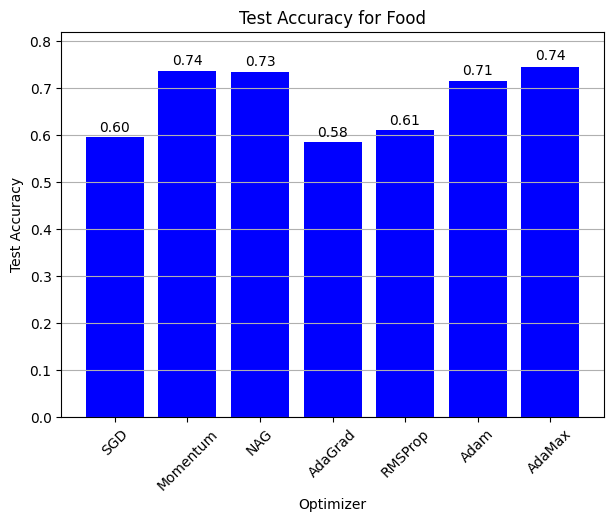

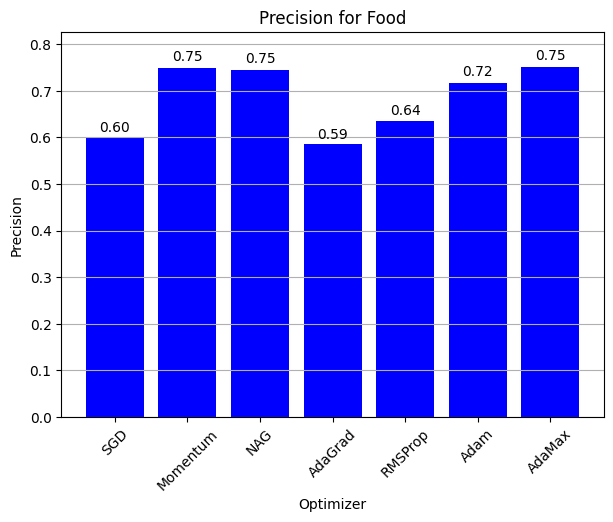

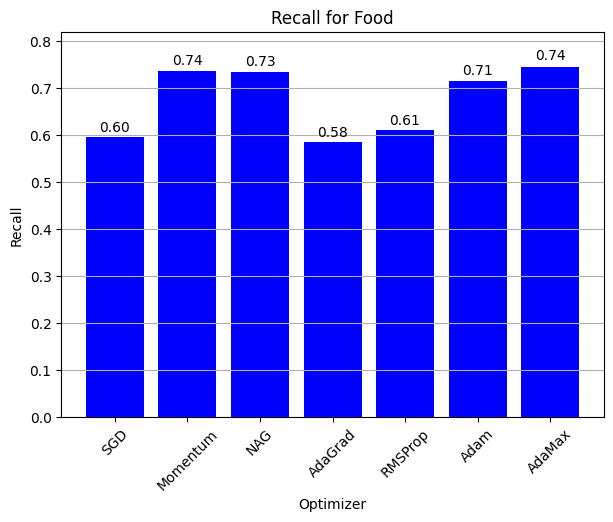

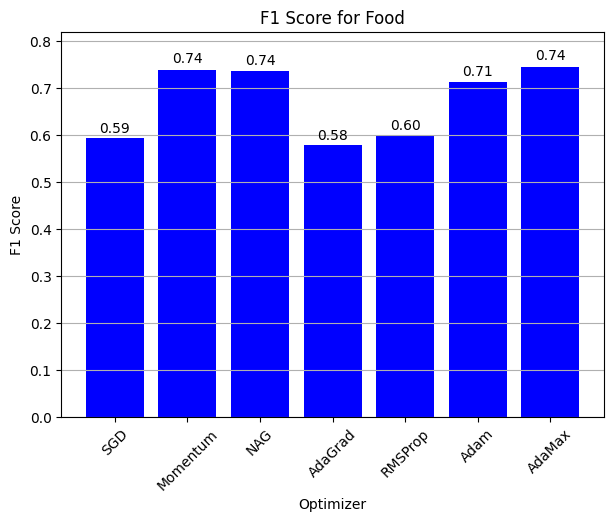

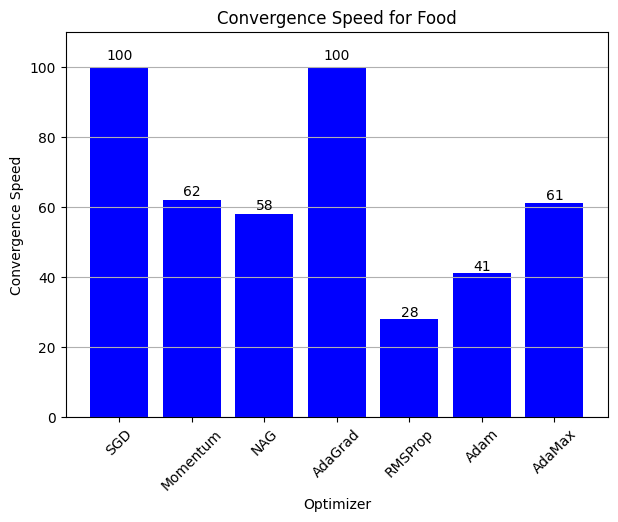

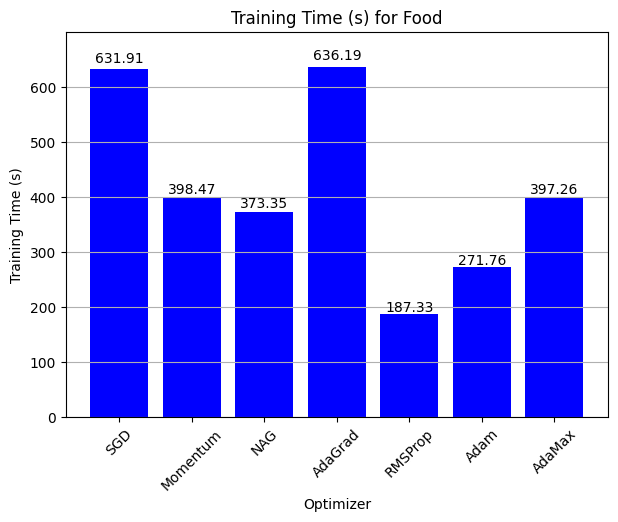

In [139]:
metrics = ["Test Accuracy", "Precision", "Recall", "F1 Score", "Convergence Speed", "Training Time (s)"]

for metric in metrics:
    plt.figure(figsize=(7, 5))

    subset = results_df[results_df["Dataset"] == "Food"]

    bars = plt.bar(subset["Optimizer"], subset[metric], color='blue')
    plt.title(f"{metric} for Food")
    plt.xlabel("Optimizer")
    plt.ylabel(metric)
    plt.xticks(rotation=45)
    plt.grid(axis='y')

    plt.ylim(0, max(subset[metric]) * 1.1)

    for bar in bars:
        yval = bar.get_height()
        if metric == "Convergence Speed":
            plt.text(bar.get_x() + bar.get_width() / 2, yval * 1.02, f'{int(yval)}', ha='center')
        else:
            plt.text(bar.get_x() + bar.get_width() / 2, yval * 1.02, f'{yval:.2f}', ha='center')

    plt.savefig(f"{metric}_Food_comparison.png")

    plt.show()


**RAPORT KLASYFIKACJI DLA SIEDMIU OPTYMALIZATORÓW**

In [140]:
for optimizer_name, report in classification_reports.items():
    print(f"\nClassification Report - {optimizer_name} (Food):\n")
    print(report)


Classification Report - SGD (Food):

              precision    recall  f1-score   support

           0       0.65      0.58      0.61       113
           1       0.76      0.56      0.64       111
           2       0.63      0.70      0.66       179
           3       0.57      0.45      0.50       146
           4       0.49      0.69      0.57       177
           5       0.87      0.81      0.84       197
           6       0.40      0.40      0.40       159
           7       0.55      0.38      0.45       125
           8       0.45      0.46      0.45       102
           9       0.59      0.78      0.67       215
          10       0.46      0.51      0.48       170
          11       0.62      0.65      0.64       165
          12       0.61      0.60      0.60       214
          13       0.66      0.67      0.67       218
          14       0.73      0.53      0.61       138
          15       0.67      0.70      0.69       215
          16       0.50      0.35      0.41

**MACIERZ POMYŁEK DLA SIEDMIU OPTYMALIZATORÓW**

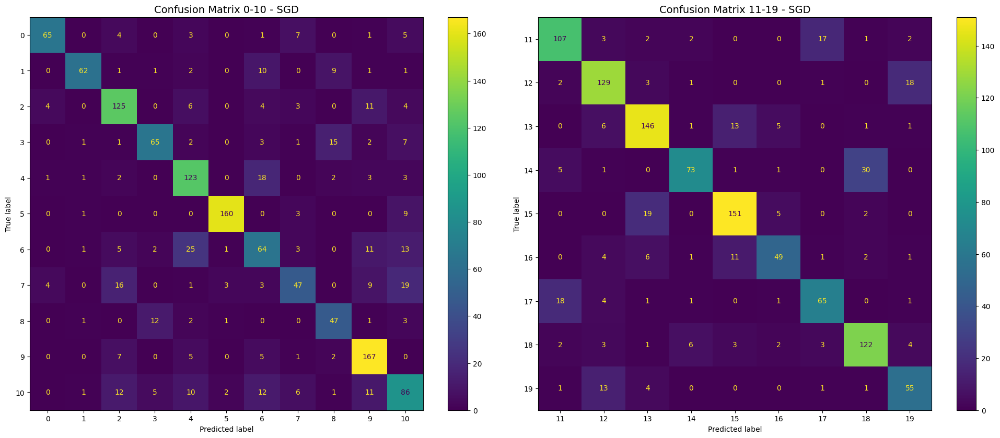

<Figure size 1170x830 with 0 Axes>

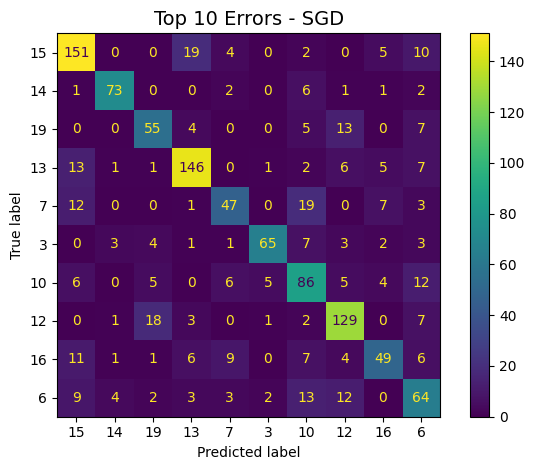

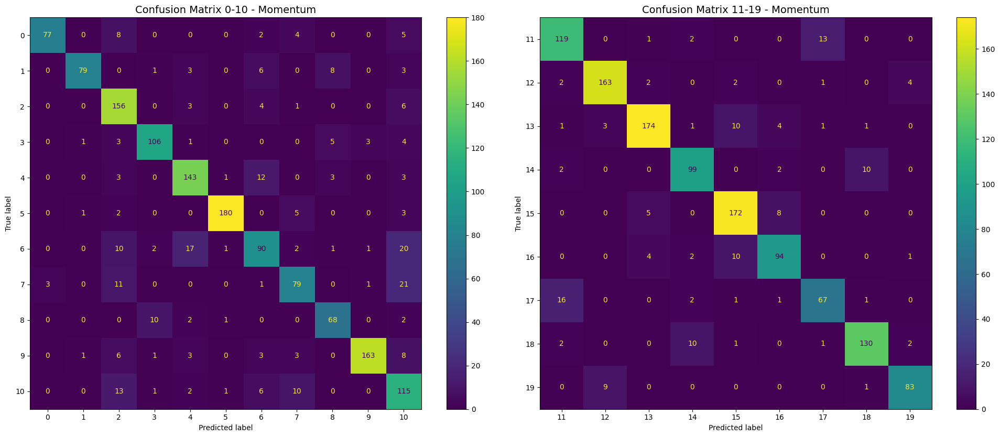

<Figure size 1170x830 with 0 Axes>

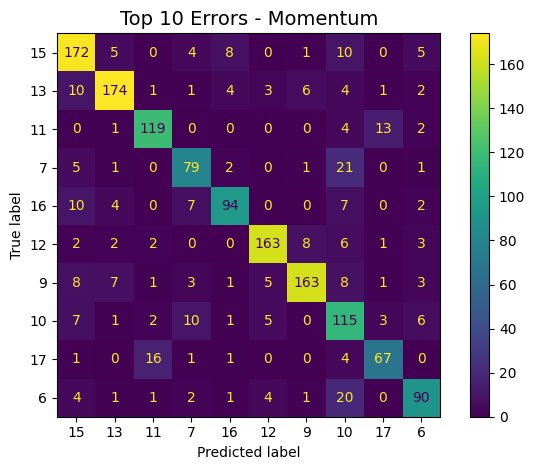

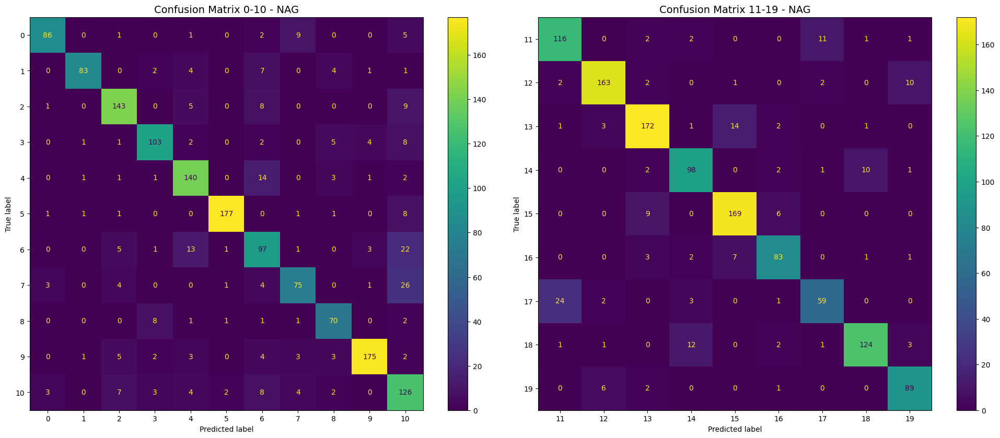

<Figure size 1170x830 with 0 Axes>

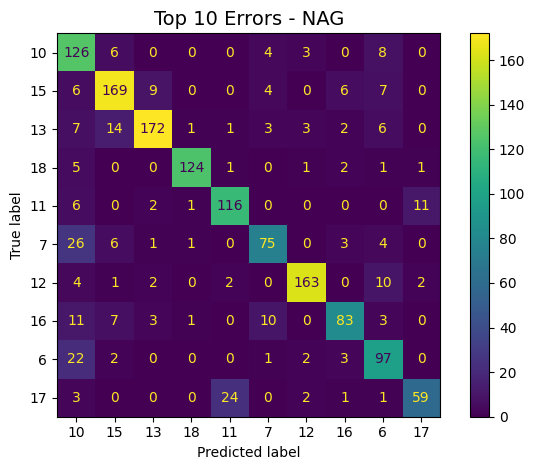

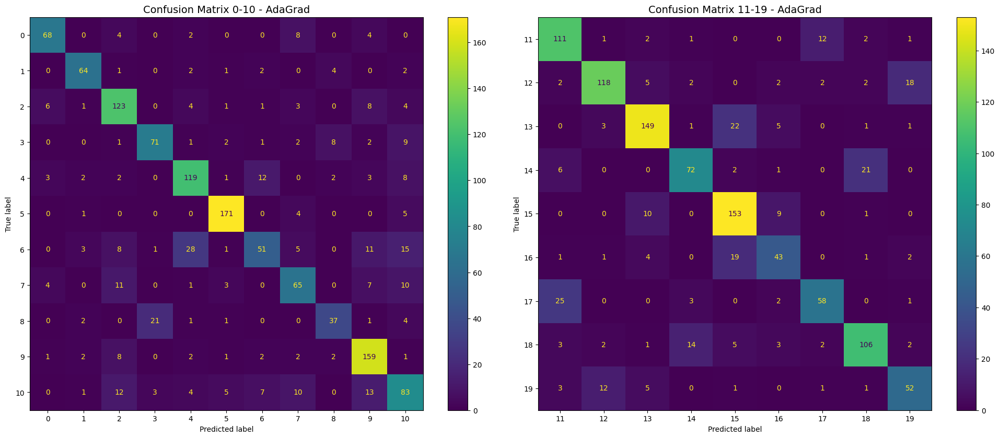

<Figure size 1170x830 with 0 Axes>

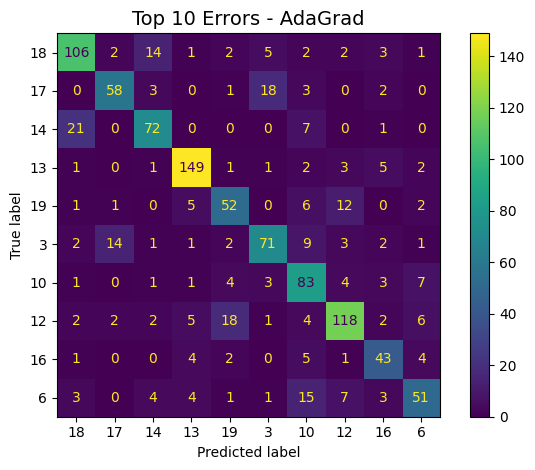

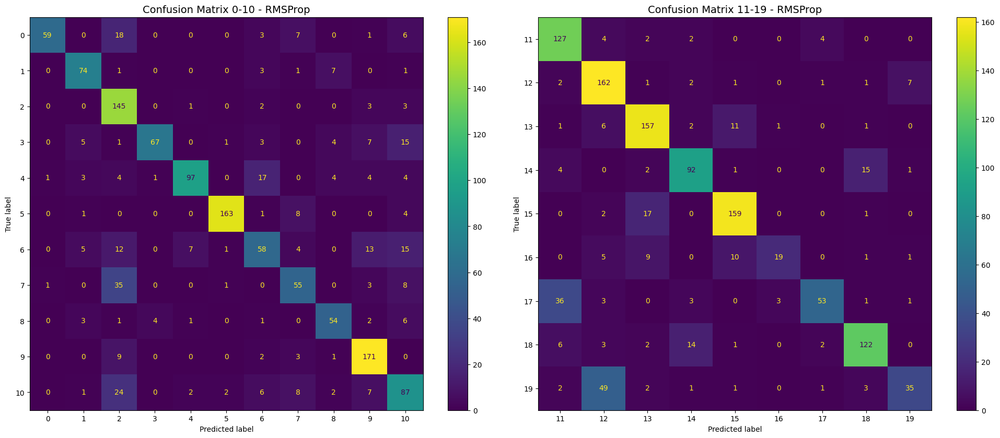

<Figure size 1170x830 with 0 Axes>

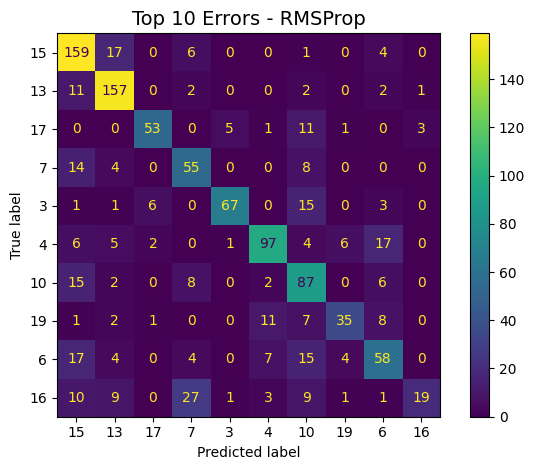

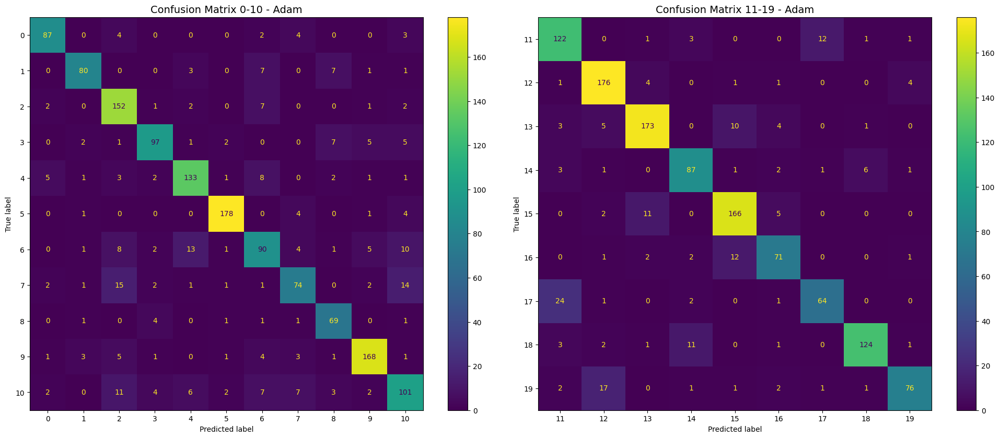

<Figure size 1170x830 with 0 Axes>

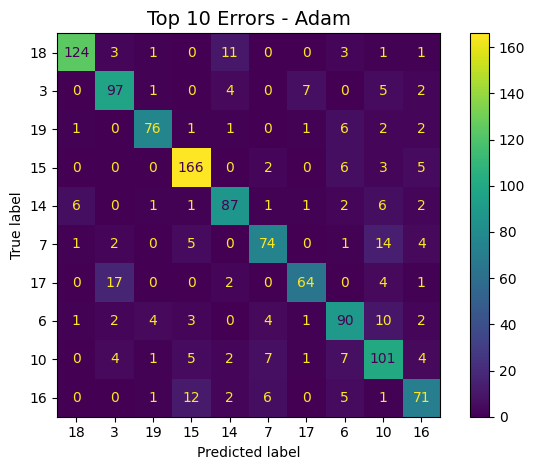

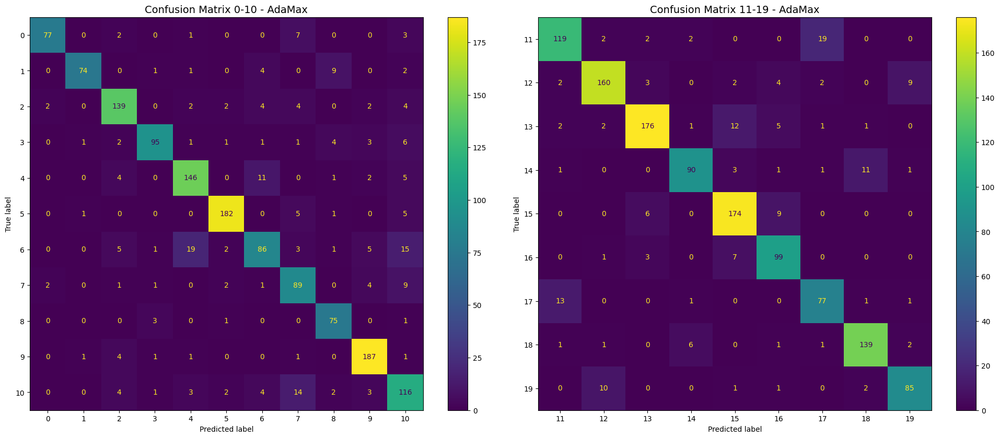

<Figure size 1170x830 with 0 Axes>

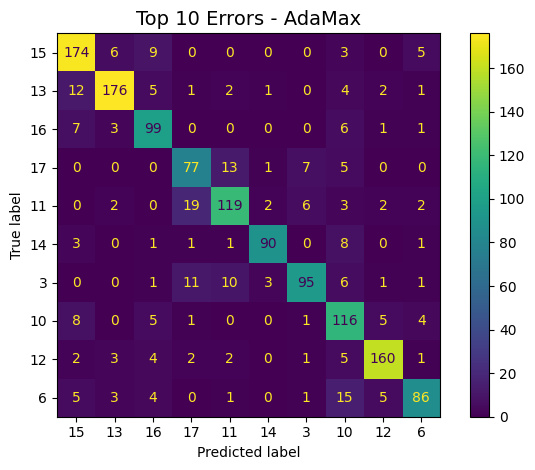

In [141]:
def filter_top_errors(cm, top_n=10):
    errors = np.sum(cm, axis=1) - np.diag(cm)
    top_classes = np.argsort(errors)[-top_n:]

    filtered_cm = cm[np.ix_(top_classes, top_classes)]
    return filtered_cm, top_classes

for optimizer_name, cm in confusion_matrices.items():
    fig, axes = plt.subplots(1, 2, figsize=(20, 8))

    max_classes = cm.shape[0]
    disp_0_10 = ConfusionMatrixDisplay(confusion_matrix=cm[:11, :11], display_labels=np.arange(0, min(11, max_classes)))
    disp_0_10.plot(cmap='viridis', values_format='d', ax=axes[0])
    axes[0].set_title(f"Confusion Matrix 0-10 - {optimizer_name}", fontsize=14)
    axes[0].tick_params(axis='both', labelsize=10)

    start_idx = 11
    end_idx = min(max_classes, 20)
    disp_11_19 = ConfusionMatrixDisplay(confusion_matrix=cm[start_idx:end_idx, start_idx:end_idx],
                                        display_labels=np.arange(start_idx, end_idx))
    disp_11_19.plot(cmap='viridis', values_format='d', ax=axes[1])
    axes[1].set_title(f"Confusion Matrix {start_idx}-{end_idx-1} - {optimizer_name}", fontsize=14)
    axes[1].tick_params(axis='both', labelsize=10)

    plt.tight_layout()
    plt.show()

    plt.figure(figsize=(11.7, 8.3))
    filtered_cm, top_classes = filter_top_errors(cm, top_n=10)
    disp_top_10 = ConfusionMatrixDisplay(confusion_matrix=filtered_cm, display_labels=top_classes)
    disp_top_10.plot(cmap='viridis', values_format='d')
    plt.title(f"Top 10 Errors - {optimizer_name}", fontsize=14)
    plt.xticks(fontsize=10)
    plt.yticks(fontsize=10)
    plt.grid(False)
    plt.tight_layout()
    plt.show()



**KRZYWE ROC-AUC SIEDMIU OPTYMALIZATORÓW**

Generowanie krzywej ROC-AUC dla optymalizatora: SGD
Generowanie krzywej ROC-AUC dla optymalizatora: Momentum
Generowanie krzywej ROC-AUC dla optymalizatora: NAG
Generowanie krzywej ROC-AUC dla optymalizatora: AdaGrad
Generowanie krzywej ROC-AUC dla optymalizatora: RMSProp
Generowanie krzywej ROC-AUC dla optymalizatora: Adam
Generowanie krzywej ROC-AUC dla optymalizatora: AdaMax


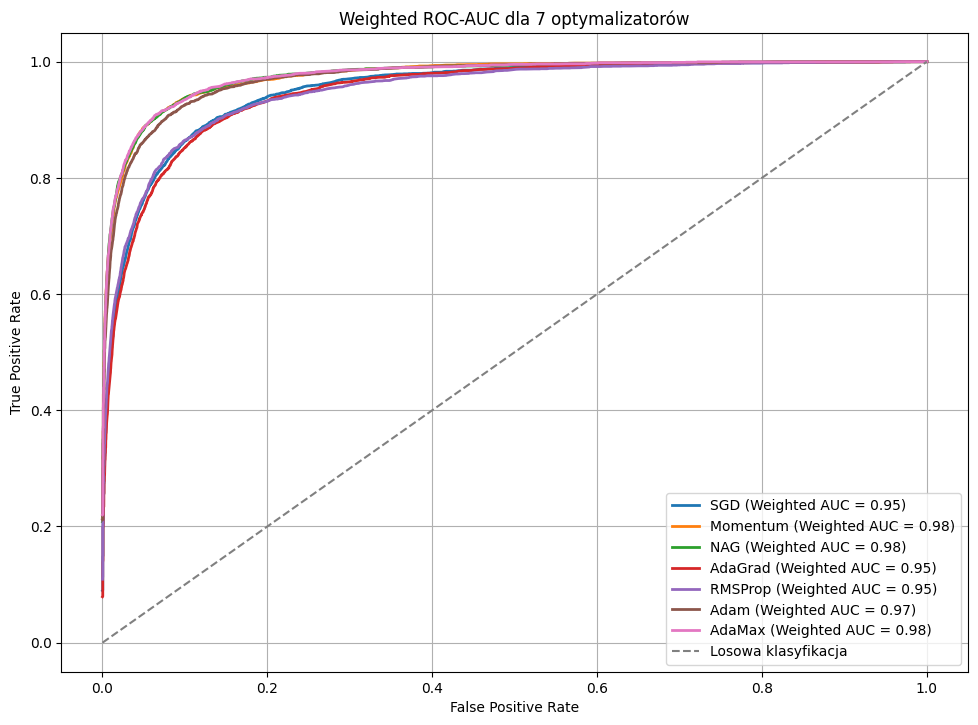

In [142]:
plt.figure(figsize=(11.7, 8.3))

y_test_binarized = label_binarize(y_test, classes=np.arange(num_classes))

for optimizer_name, y_pred_prob in y_pred_probs.items():
    print(f"Generowanie krzywej ROC-AUC dla optymalizatora: {optimizer_name}")

    fpr_macro = np.unique(np.concatenate([
        roc_curve(y_test_binarized[:, j], y_pred_prob[:, j])[0]
        for j in range(num_classes) if np.sum(y_test_binarized[:, j]) > 0
    ]))

    mean_tpr = np.zeros_like(fpr_macro)
    class_weights = np.sum(y_test_binarized, axis=0) / np.sum(y_test_binarized)
    weighted_tpr = np.zeros_like(fpr_macro)

    for j in range(num_classes):
        if np.sum(y_test_binarized[:, j]) == 0:
            continue
        fpr, tpr, _ = roc_curve(y_test_binarized[:, j], y_pred_prob[:, j])
        weighted_tpr += np.interp(fpr_macro, fpr, tpr) * class_weights[j]

    auc_weighted = auc(fpr_macro, weighted_tpr)

    plt.plot(fpr_macro, weighted_tpr, linestyle='-', label=f'{optimizer_name} (Weighted AUC = {auc_weighted:.2f})', linewidth=2)

plt.plot([0, 1], [0, 1], color='gray', linestyle='--', label='Losowa klasyfikacja')

plt.title("Weighted ROC-AUC dla 7 optymalizatorów")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.legend(loc="lower right")
plt.grid(True)

plt.savefig("Weighted_ROC_AUC_20_classes.png")
plt.show()


# **MODEL ŚREDNIOZAAWANSOWANY - 5 WARSTW CONV**

**ARCHITEKTURA MODELU 5 - WARSTWOWEGO**

In [143]:
def five_layer_model(input_shape, num_classes):
    model = models.Sequential([
        layers.Conv2D(64, (3, 3), activation='relu', input_shape=input_shape),
        layers.BatchNormalization(),
        layers.MaxPooling2D((2, 2)),
        layers.Dropout(0.3),

        layers.Conv2D(128, (3, 3), activation='relu'),
        layers.BatchNormalization(),
        layers.MaxPooling2D((2, 2)),
        layers.Dropout(0.3),

        layers.Conv2D(256, (3, 3), activation='relu'),
        layers.BatchNormalization(),
        layers.MaxPooling2D((2, 2)),
        layers.Dropout(0.4),

        layers.Conv2D(512, (3, 3), activation='relu'),
        layers.BatchNormalization(),
        layers.MaxPooling2D((2, 2)),
        layers.Dropout(0.4),


        layers.Conv2D(1024, (3, 3), activation='relu'),
        layers.BatchNormalization(),
        layers.MaxPooling2D((2, 2)),
        layers.Dropout(0.4),

        layers.GlobalAveragePooling2D(),
        layers.Dense(256, activation='relu'),
        layers.Dropout(0.5),
        layers.Dense(num_classes, activation='softmax')
    ])
    return model


**PROCES TRENINGU MODELU**

In [144]:
EPOCHS = 100
results = []
classification_reports = {}
y_pred_probs = {}
confusion_matrices = {}

optimizers = {
    'SGD': SGD(learning_rate=0.01),
    'Momentum': SGD(learning_rate=0.01, momentum=0.9),
    'NAG': SGD(learning_rate=0.01, momentum=0.9, nesterov=True),
    'AdaGrad': Adagrad(learning_rate=0.01),
    'RMSProp': RMSprop(learning_rate=0.001),
    'Adam': Adam(learning_rate=0.001),
    'AdaMax': Adamax(learning_rate=0.001),
}
for optimizer_name, optimizer in optimizers.items():
        print(f"\nTrening modelu Food z optymalizatorem: {optimizer_name}")

        model = five_layer_model(input_shape, num_classes)
        model.compile(optimizer=optimizer,
                      loss='sparse_categorical_crossentropy',
                      metrics=['accuracy'])

        early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

        start_time = time.time()
        history = model.fit(
            X_train, y_train,
            validation_data=(X_val, y_val),
            epochs=EPOCHS,
            callbacks=[early_stopping],
            verbose=1
        )
        elapsed_time = time.time() - start_time

        test_loss, test_accuracy = model.evaluate(X_test, y_test, verbose=0)
        y_pred = np.argmax(model.predict(X_test), axis=-1)
        y_true = y_test
        precision, recall, f1, _ = precision_recall_fscore_support(y_true, y_pred, average="weighted",zero_division=0)
        accuracy = accuracy_score(y_true, y_pred)

        results.append({
            "Dataset": "Food",
            "Optimizer": optimizer_name,
            "Test Accuracy": accuracy,
            "Precision": precision,
            "Recall": recall,
            "F1 Score": f1,
            "Convergence Speed": len(history.history['loss']),
            "Training Time (s)": elapsed_time,
            "Test Loss": test_loss
        })
        classification_reports[optimizer_name] = classification_report(y_true, y_pred, target_names=[str(i) for i in np.unique(y_true)], zero_division=0)


        y_pred_probs[optimizer_name] = model.predict(X_test)
        confusion_matrices[optimizer_name] = confusion_matrix(y_true, y_pred)


Trening modelu Food z optymalizatorem: SGD


/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
795/795 ━━━━━━━━━━━━━━━━━━━━ 28s 26ms/step - accuracy: 0.2108 - loss: 2.6885 - val_accuracy: 0.0874 - val_loss: 6.8097
Epoch 2/100
795/795 ━━━━━━━━━━━━━━━━━━━━ 8s 10ms/step - accuracy: 0.3475 - loss: 2.0582 - val_accuracy: 0.1209 - val_loss: 6.6150
Epoch 3/100
795/795 ━━━━━━━━━━━━━━━━━━━━ 8s 10ms/step - accuracy: 0.4035 - loss: 1.8994 - val_accuracy: 0.3198 - val_loss: 2.6296
Epoch 4/100
795/795 ━━━━━━━━━━━━━━━━━━━━ 8s 10ms/step - accuracy: 0.4351 - loss: 1.7855 - val_accuracy: 0.2643 - val_loss: 3.3096
Epoch 5/100
795/795 ━━━━━━━━━━━━━━━━━━━━ 8s 10ms/step - accuracy: 0.4618 - loss: 1.7003 - val_accuracy: 0.2505 - val_loss: 3.8017
Epoch 6/100
795/795 ━━━━━━━━━━━━━━━━━━━━ 8s 10ms/step - accuracy: 0.4735 - loss: 1.6427 - val_accuracy: 0.2546 - val_loss: 4.1543
Epoch 7/100
795/795 ━━━━━━━━━━━━━━━━━━━━ 8s 10ms/step - accuracy: 0.5068 - loss: 1.5782 - val_accuracy: 0.2220 - val_loss: 4.8744
Epoch 8/100
795/795 ━━━━━━━━━━━━━━━━━━━━ 8s 10ms/step - accuracy: 0.5185 - loss: 1.5091 -

/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
795/795 ━━━━━━━━━━━━━━━━━━━━ 23s 19ms/step - accuracy: 0.2029 - loss: 2.7397 - val_accuracy: 0.2142 - val_loss: 3.4587
Epoch 2/100
795/795 ━━━━━━━━━━━━━━━━━━━━ 8s 10ms/step - accuracy: 0.3158 - loss: 2.2144 - val_accuracy: 0.1804 - val_loss: 3.2283
Epoch 3/100
795/795 ━━━━━━━━━━━━━━━━━━━━ 8s 10ms/step - accuracy: 0.3477 - loss: 2.0965 - val_accuracy: 0.4075 - val_loss: 2.1760
Epoch 4/100
795/795 ━━━━━━━━━━━━━━━━━━━━ 8s 10ms/step - accuracy: 0.3823 - loss: 1.9892 - val_accuracy: 0.3708 - val_loss: 2.2012
Epoch 5/100
795/795 ━━━━━━━━━━━━━━━━━━━━ 8s 10ms/step - accuracy: 0.4060 - loss: 1.9243 - val_accuracy: 0.4447 - val_loss: 1.8522
Epoch 6/100
795/795 ━━━━━━━━━━━━━━━━━━━━ 8s 10ms/step - accuracy: 0.4336 - loss: 1.8353 - val_accuracy: 0.4660 - val_loss: 1.8320
Epoch 7/100
795/795 ━━━━━━━━━━━━━━━━━━━━ 8s 10ms/step - accuracy: 0.4557 - loss: 1.7715 - val_accuracy: 0.4873 - val_loss: 1.6912
Epoch 8/100
795/795 ━━━━━━━━━━━━━━━━━━━━ 8s 10ms/step - accuracy: 0.4750 - loss: 1.7109 -

/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
795/795 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - accuracy: 0.2086 - loss: 2.7280 - val_accuracy: 0.2020 - val_loss: 3.3315
Epoch 2/100
795/795 ━━━━━━━━━━━━━━━━━━━━ 8s 10ms/step - accuracy: 0.3087 - loss: 2.2085 - val_accuracy: 0.3085 - val_loss: 2.5507
Epoch 3/100
795/795 ━━━━━━━━━━━━━━━━━━━━ 8s 10ms/step - accuracy: 0.3543 - loss: 2.0728 - val_accuracy: 0.3320 - val_loss: 2.2409
Epoch 4/100
795/795 ━━━━━━━━━━━━━━━━━━━━ 8s 10ms/step - accuracy: 0.3925 - loss: 1.9699 - val_accuracy: 0.3154 - val_loss: 2.4745
Epoch 5/100
795/795 ━━━━━━━━━━━━━━━━━━━━ 8s 10ms/step - accuracy: 0.4200 - loss: 1.8735 - val_accuracy: 0.4247 - val_loss: 1.9292
Epoch 6/100
795/795 ━━━━━━━━━━━━━━━━━━━━ 8s 10ms/step - accuracy: 0.4482 - loss: 1.7820 - val_accuracy: 0.4450 - val_loss: 1.9545
Epoch 7/100
795/795 ━━━━━━━━━━━━━━━━━━━━ 8s 10ms/step - accuracy: 0.4679 - loss: 1.7101 - val_accuracy: 0.4028 - val_loss: 2.3263
Epoch 8/100
795/795 ━━━━━━━━━━━━━━━━━━━━ 8s 10ms/step - accuracy: 0.4861 - loss: 1.6575 -

/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
795/795 ━━━━━━━━━━━━━━━━━━━━ 24s 20ms/step - accuracy: 0.2239 - loss: 2.6687 - val_accuracy: 0.2866 - val_loss: 2.9047
Epoch 2/100
795/795 ━━━━━━━━━━━━━━━━━━━━ 8s 10ms/step - accuracy: 0.3916 - loss: 1.9506 - val_accuracy: 0.3545 - val_loss: 2.5834
Epoch 3/100
795/795 ━━━━━━━━━━━━━━━━━━━━ 8s 10ms/step - accuracy: 0.4453 - loss: 1.7538 - val_accuracy: 0.2433 - val_loss: 3.6809
Epoch 4/100
795/795 ━━━━━━━━━━━━━━━━━━━━ 8s 10ms/step - accuracy: 0.4914 - loss: 1.6153 - val_accuracy: 0.4397 - val_loss: 2.1584
Epoch 5/100
795/795 ━━━━━━━━━━━━━━━━━━━━ 8s 10ms/step - accuracy: 0.5242 - loss: 1.5114 - val_accuracy: 0.3771 - val_loss: 2.5661
Epoch 6/100
795/795 ━━━━━━━━━━━━━━━━━━━━ 8s 10ms/step - accuracy: 0.5466 - loss: 1.4462 - val_accuracy: 0.4886 - val_loss: 1.8365
Epoch 7/100
795/795 ━━━━━━━━━━━━━━━━━━━━ 8s 10ms/step - accuracy: 0.5639 - loss: 1.3714 - val_accuracy: 0.5196 - val_loss: 1.7860
Epoch 8/100
795/795 ━━━━━━━━━━━━━━━━━━━━ 8s 10ms/step - accuracy: 0.5809 - loss: 1.3200 -

/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
795/795 ━━━━━━━━━━━━━━━━━━━━ 24s 20ms/step - accuracy: 0.2164 - loss: 3.0678 - val_accuracy: 0.2747 - val_loss: 2.6785
Epoch 2/100
795/795 ━━━━━━━━━━━━━━━━━━━━ 8s 10ms/step - accuracy: 0.3794 - loss: 2.0567 - val_accuracy: 0.2612 - val_loss: 2.7125
Epoch 3/100
795/795 ━━━━━━━━━━━━━━━━━━━━ 8s 10ms/step - accuracy: 0.4419 - loss: 1.8546 - val_accuracy: 0.3608 - val_loss: 2.3931
Epoch 4/100
795/795 ━━━━━━━━━━━━━━━━━━━━ 8s 10ms/step - accuracy: 0.4693 - loss: 1.7681 - val_accuracy: 0.5409 - val_loss: 1.4862
Epoch 5/100
795/795 ━━━━━━━━━━━━━━━━━━━━ 8s 10ms/step - accuracy: 0.4950 - loss: 1.6923 - val_accuracy: 0.2869 - val_loss: 3.3561
Epoch 6/100
795/795 ━━━━━━━━━━━━━━━━━━━━ 8s 10ms/step - accuracy: 0.5126 - loss: 1.6331 - val_accuracy: 0.5327 - val_loss: 1.4933
Epoch 7/100
795/795 ━━━━━━━━━━━━━━━━━━━━ 8s 10ms/step - accuracy: 0.5230 - loss: 1.6277 - val_accuracy: 0.5158 - val_loss: 1.6807
Epoch 8/100
795/795 ━━━━━━━━━━━━━━━━━━━━ 8s 10ms/step - accuracy: 0.5347 - loss: 1.5758 -

/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
795/795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - accuracy: 0.2226 - loss: 2.7585 - val_accuracy: 0.3054 - val_loss: 2.5195
Epoch 2/100
795/795 ━━━━━━━━━━━━━━━━━━━━ 8s 11ms/step - accuracy: 0.3846 - loss: 1.9765 - val_accuracy: 0.3821 - val_loss: 2.0109
Epoch 3/100
795/795 ━━━━━━━━━━━━━━━━━━━━ 8s 11ms/step - accuracy: 0.4491 - loss: 1.7596 - val_accuracy: 0.3827 - val_loss: 1.9471
Epoch 4/100
795/795 ━━━━━━━━━━━━━━━━━━━━ 8s 11ms/step - accuracy: 0.4909 - loss: 1.6322 - val_accuracy: 0.4416 - val_loss: 1.7988
Epoch 5/100
795/795 ━━━━━━━━━━━━━━━━━━━━ 8s 11ms/step - accuracy: 0.5168 - loss: 1.5326 - val_accuracy: 0.5534 - val_loss: 1.5053
Epoch 6/100
795/795 ━━━━━━━━━━━━━━━━━━━━ 8s 11ms/step - accuracy: 0.5475 - loss: 1.4466 - val_accuracy: 0.4967 - val_loss: 1.7425
Epoch 7/100
795/795 ━━━━━━━━━━━━━━━━━━━━ 8s 11ms/step - accuracy: 0.5796 - loss: 1.3654 - val_accuracy: 0.4651 - val_loss: 1.8869
Epoch 8/100
795/795 ━━━━━━━━━━━━━━━━━━━━ 8s 11ms/step - accuracy: 0.5918 - loss: 1.3087 -

/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
795/795 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - accuracy: 0.2495 - loss: 2.7261 - val_accuracy: 0.2114 - val_loss: 2.8428
Epoch 2/100
795/795 ━━━━━━━━━━━━━━━━━━━━ 8s 11ms/step - accuracy: 0.3990 - loss: 1.9409 - val_accuracy: 0.3605 - val_loss: 2.2816
Epoch 3/100
795/795 ━━━━━━━━━━━━━━━━━━━━ 8s 11ms/step - accuracy: 0.4607 - loss: 1.7311 - val_accuracy: 0.4679 - val_loss: 1.7469
Epoch 4/100
795/795 ━━━━━━━━━━━━━━━━━━━━ 8s 11ms/step - accuracy: 0.5122 - loss: 1.5773 - val_accuracy: 0.3671 - val_loss: 2.1276
Epoch 5/100
795/795 ━━━━━━━━━━━━━━━━━━━━ 8s 11ms/step - accuracy: 0.5526 - loss: 1.4156 - val_accuracy: 0.5033 - val_loss: 1.6505
Epoch 6/100
795/795 ━━━━━━━━━━━━━━━━━━━━ 8s 11ms/step - accuracy: 0.5942 - loss: 1.3059 - val_accuracy: 0.5064 - val_loss: 1.7355
Epoch 7/100
795/795 ━━━━━━━━━━━━━━━━━━━━ 8s 11ms/step - accuracy: 0.6151 - loss: 1.2182 - val_accuracy: 0.5925 - val_loss: 1.3749
Epoch 8/100
795/795 ━━━━━━━━━━━━━━━━━━━━ 8s 11ms/step - accuracy: 0.6409 - loss: 1.1560 -

**ZAPIS WYNIKÓW DO CSV**

In [145]:
results_df = pd.DataFrame(results)
results_df.to_csv("training_results.csv", index=False)

**PREZENTACJA WYNIKÓW W POSTACI WYKRESÓW**

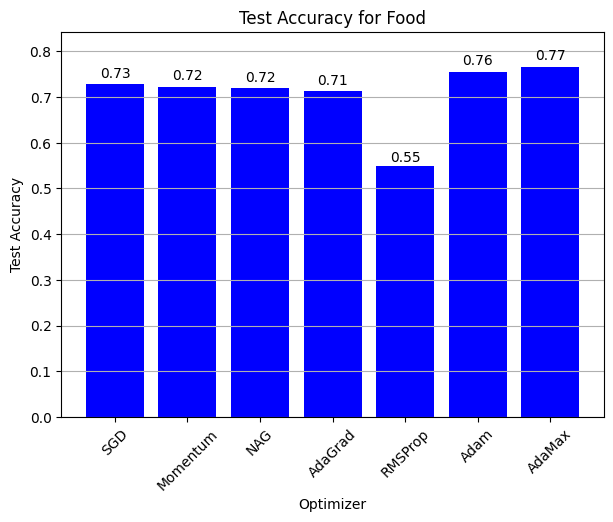

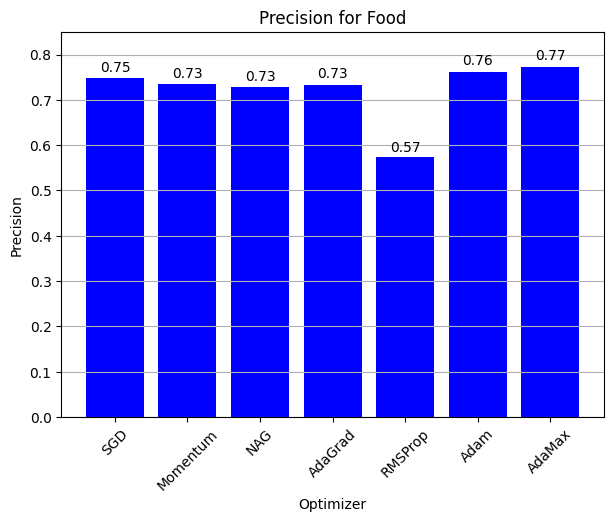

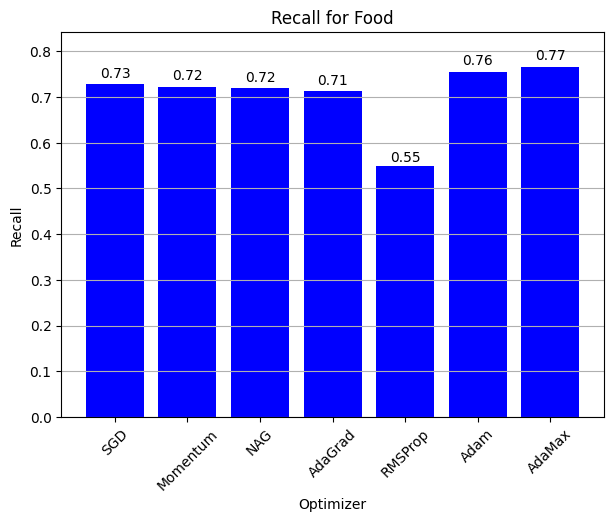

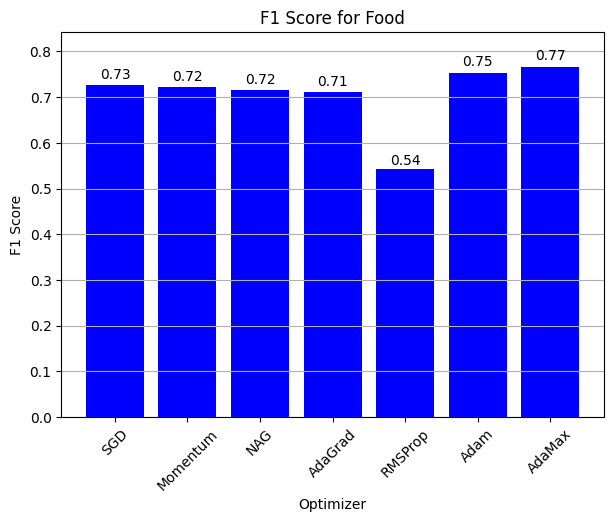

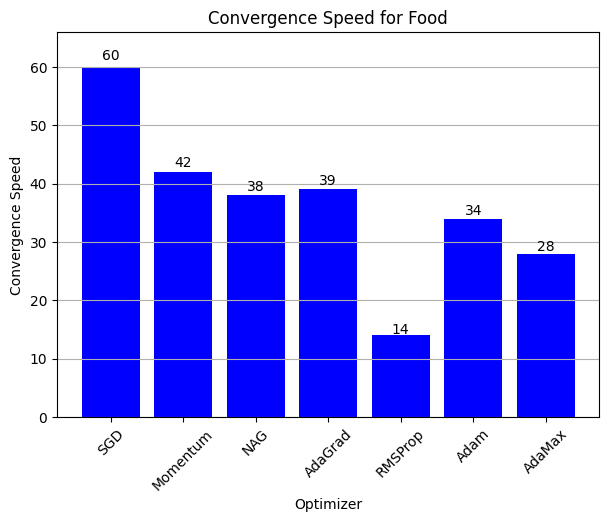

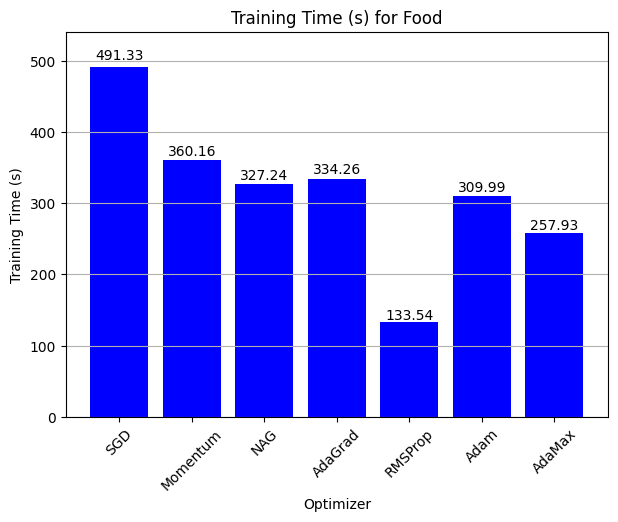

In [146]:
metrics = ["Test Accuracy", "Precision", "Recall", "F1 Score", "Convergence Speed", "Training Time (s)"]

for metric in metrics:
    plt.figure(figsize=(7, 5))

    subset = results_df[results_df["Dataset"] == "Food"]

    bars = plt.bar(subset["Optimizer"], subset[metric], color='blue')
    plt.title(f"{metric} for Food")
    plt.xlabel("Optimizer")
    plt.ylabel(metric)
    plt.xticks(rotation=45)
    plt.grid(axis='y')

    plt.ylim(0, max(subset[metric]) * 1.1)

    for bar in bars:
        yval = bar.get_height()
        if metric == "Convergence Speed":
            plt.text(bar.get_x() + bar.get_width() / 2, yval * 1.02, f'{int(yval)}', ha='center')
        else:
            plt.text(bar.get_x() + bar.get_width() / 2, yval * 1.02, f'{yval:.2f}', ha='center')

    plt.savefig(f"{metric}_Food_comparison.png")

    plt.show()


**RAPORT KLASYFIKACJI DLA SIEDMIU OPTYMALIZATORÓW**

In [147]:
for optimizer_name, report in classification_reports.items():
    print(f"\nClassification Report - {optimizer_name} (Food):\n")
    print(report)


Classification Report - SGD (Food):

              precision    recall  f1-score   support

           0       0.69      0.83      0.75       113
           1       0.91      0.61      0.73       111
           2       0.78      0.80      0.79       179
           3       0.78      0.68      0.73       146
           4       0.70      0.84      0.77       177
           5       0.88      0.89      0.88       197
           6       0.67      0.46      0.54       159
           7       0.65      0.66      0.65       125
           8       0.78      0.55      0.64       102
           9       0.59      0.94      0.73       215
          10       0.62      0.57      0.59       170
          11       0.54      0.83      0.65       165
          12       0.79      0.83      0.81       214
          13       0.72      0.79      0.76       218
          14       0.91      0.54      0.68       138
          15       0.86      0.68      0.76       215
          16       0.69      0.70      0.70

**MACIERZ POMYŁEK DLA SIEDMIU OPTYMALIZATORÓW**

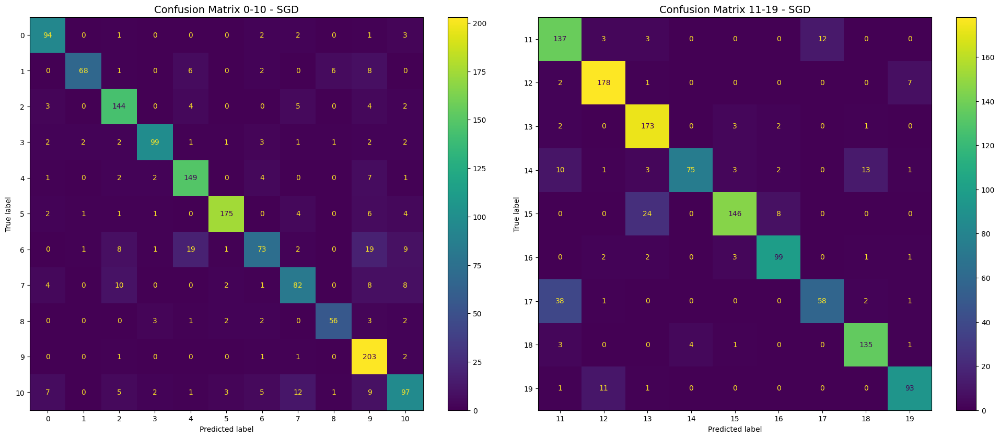

<Figure size 1170x830 with 0 Axes>

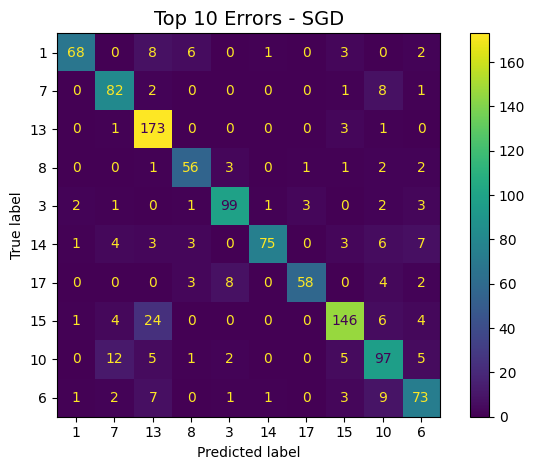

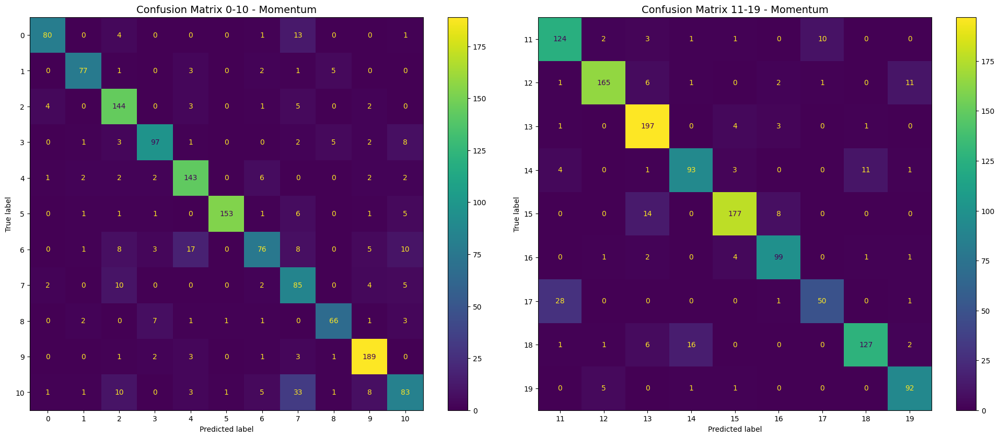

<Figure size 1170x830 with 0 Axes>

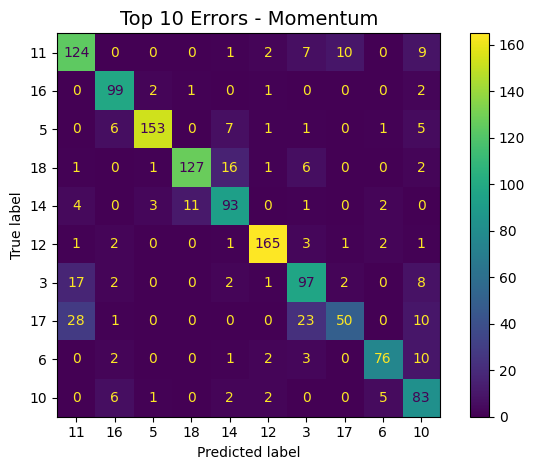

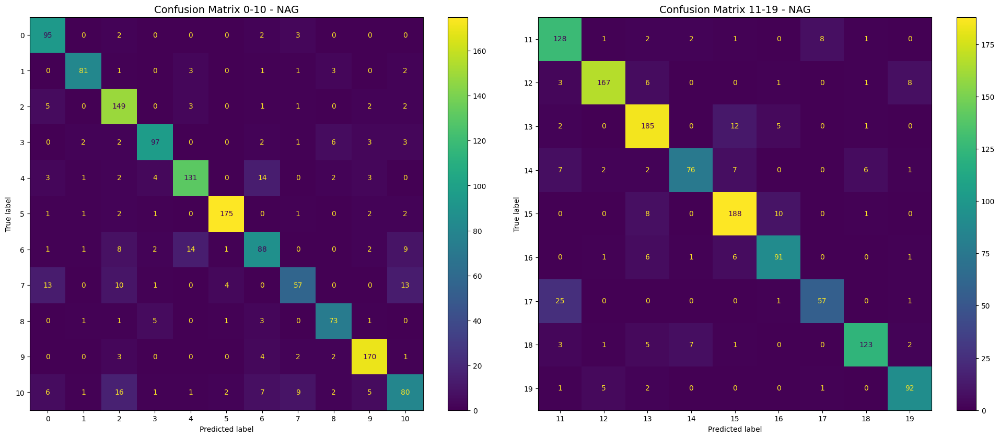

<Figure size 1170x830 with 0 Axes>

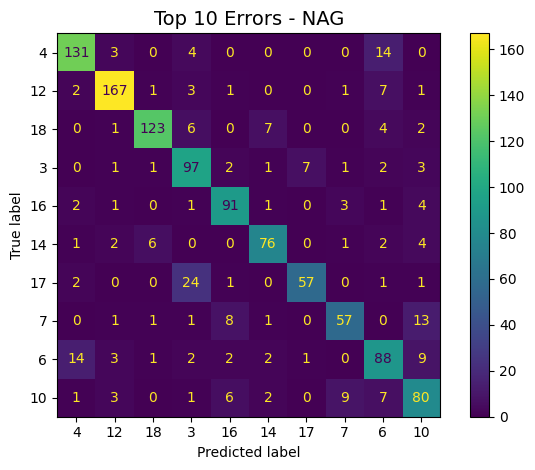

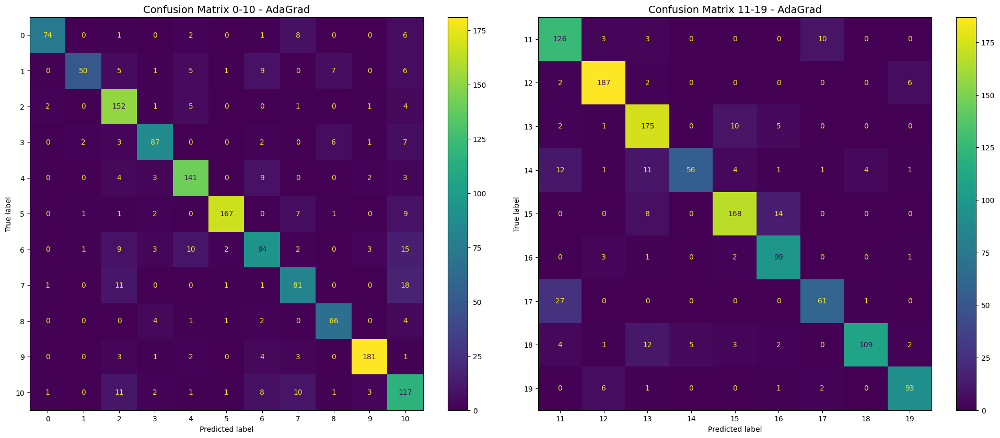

<Figure size 1170x830 with 0 Axes>

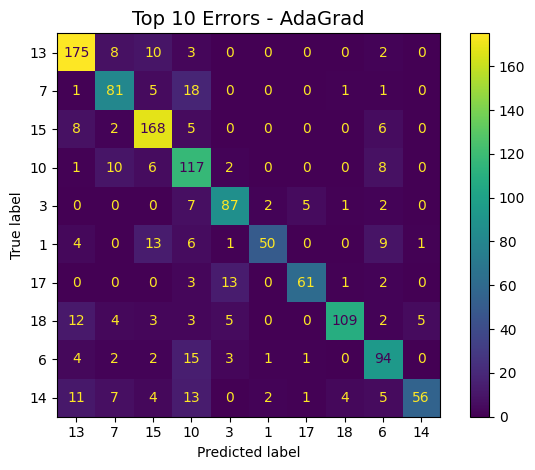

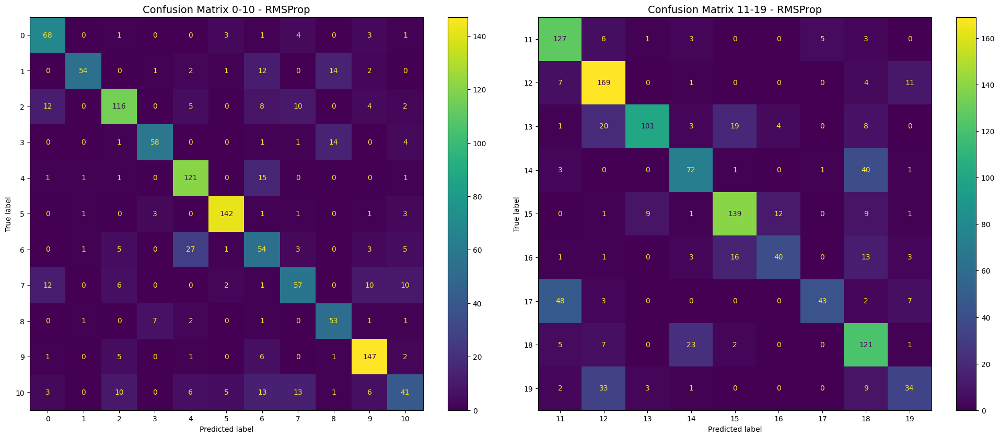

<Figure size 1170x830 with 0 Axes>

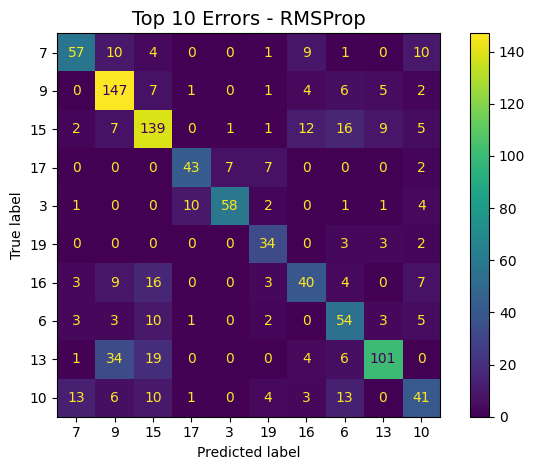

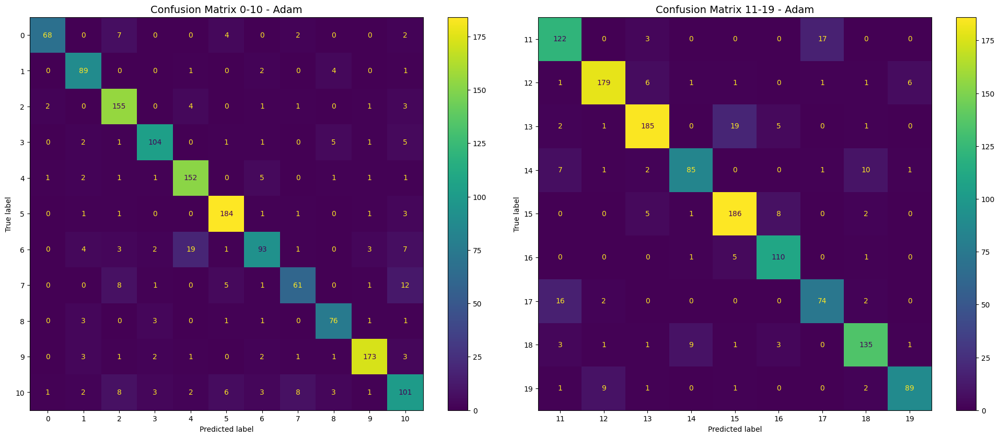

<Figure size 1170x830 with 0 Axes>

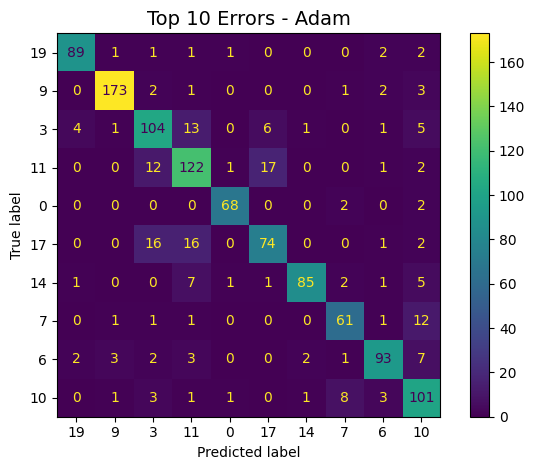

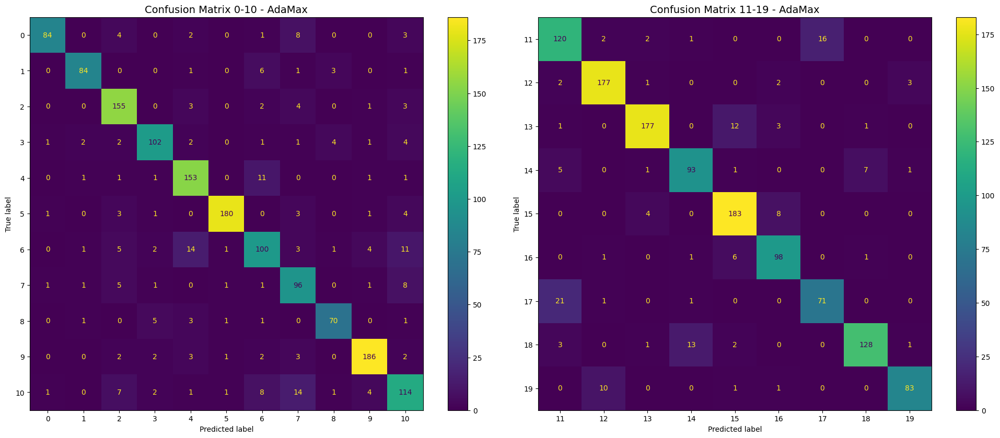

<Figure size 1170x830 with 0 Axes>

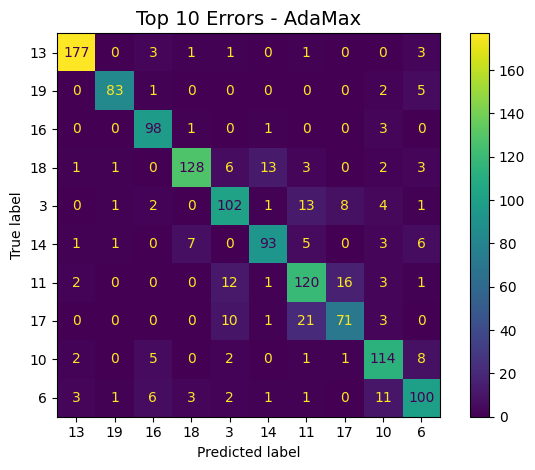

In [148]:
def filter_top_errors(cm, top_n=10):
    errors = np.sum(cm, axis=1) - np.diag(cm)
    top_classes = np.argsort(errors)[-top_n:]

    filtered_cm = cm[np.ix_(top_classes, top_classes)]
    return filtered_cm, top_classes

for optimizer_name, cm in confusion_matrices.items():
    fig, axes = plt.subplots(1, 2, figsize=(20, 8))

    max_classes = cm.shape[0]
    disp_0_10 = ConfusionMatrixDisplay(confusion_matrix=cm[:11, :11], display_labels=np.arange(0, min(11, max_classes)))
    disp_0_10.plot(cmap='viridis', values_format='d', ax=axes[0])
    axes[0].set_title(f"Confusion Matrix 0-10 - {optimizer_name}", fontsize=14)
    axes[0].tick_params(axis='both', labelsize=10)

    start_idx = 11
    end_idx = min(max_classes, 20)
    disp_11_19 = ConfusionMatrixDisplay(confusion_matrix=cm[start_idx:end_idx, start_idx:end_idx],
                                        display_labels=np.arange(start_idx, end_idx))
    disp_11_19.plot(cmap='viridis', values_format='d', ax=axes[1])
    axes[1].set_title(f"Confusion Matrix {start_idx}-{end_idx-1} - {optimizer_name}", fontsize=14)
    axes[1].tick_params(axis='both', labelsize=10)

    plt.tight_layout()
    plt.show()

    plt.figure(figsize=(11.7, 8.3))
    filtered_cm, top_classes = filter_top_errors(cm, top_n=10)
    disp_top_10 = ConfusionMatrixDisplay(confusion_matrix=filtered_cm, display_labels=top_classes)
    disp_top_10.plot(cmap='viridis', values_format='d')
    plt.title(f"Top 10 Errors - {optimizer_name}", fontsize=14)
    plt.xticks(fontsize=10)
    plt.yticks(fontsize=10)
    plt.grid(False)
    plt.tight_layout()
    plt.show()



**KRZYWA ROC-AUC DLA SIEDMIU OPTYMALIZATORÓW** 

Generowanie krzywej ROC-AUC dla optymalizatora: SGD
Generowanie krzywej ROC-AUC dla optymalizatora: Momentum
Generowanie krzywej ROC-AUC dla optymalizatora: NAG
Generowanie krzywej ROC-AUC dla optymalizatora: AdaGrad
Generowanie krzywej ROC-AUC dla optymalizatora: RMSProp
Generowanie krzywej ROC-AUC dla optymalizatora: Adam
Generowanie krzywej ROC-AUC dla optymalizatora: AdaMax


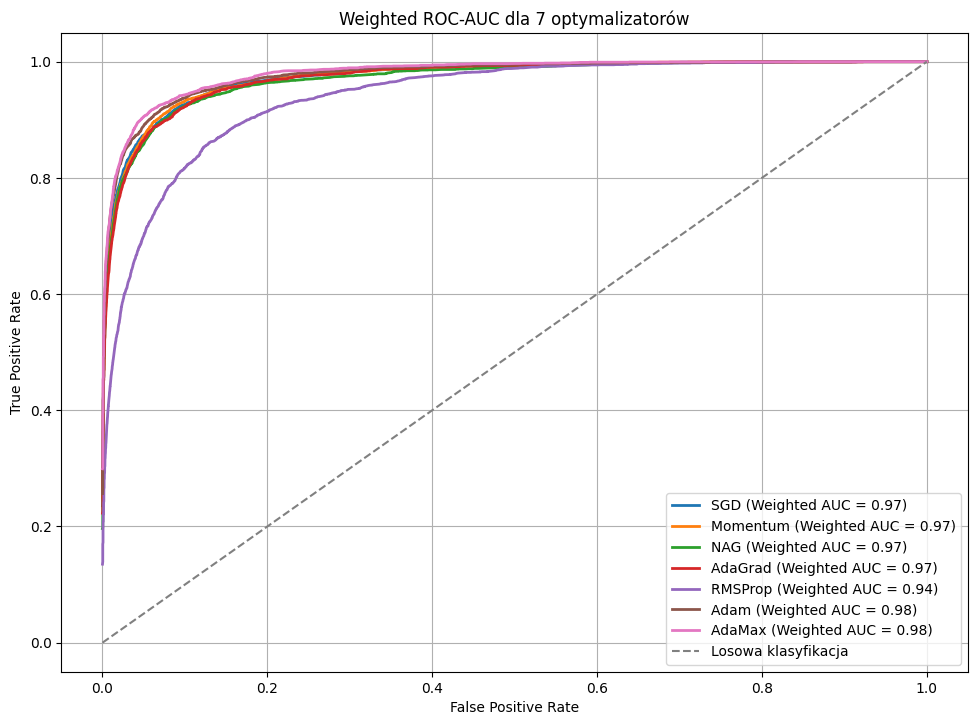

In [149]:
plt.figure(figsize=(11.7, 8.3))

y_test_binarized = label_binarize(y_test, classes=np.arange(num_classes))

for optimizer_name, y_pred_prob in y_pred_probs.items():
    print(f"Generowanie krzywej ROC-AUC dla optymalizatora: {optimizer_name}")

    fpr_macro = np.unique(np.concatenate([
        roc_curve(y_test_binarized[:, j], y_pred_prob[:, j])[0]
        for j in range(num_classes) if np.sum(y_test_binarized[:, j]) > 0
    ]))

    mean_tpr = np.zeros_like(fpr_macro)
    class_weights = np.sum(y_test_binarized, axis=0) / np.sum(y_test_binarized)
    weighted_tpr = np.zeros_like(fpr_macro)

    for j in range(num_classes):
        if np.sum(y_test_binarized[:, j]) == 0:
            continue
        fpr, tpr, _ = roc_curve(y_test_binarized[:, j], y_pred_prob[:, j])
        weighted_tpr += np.interp(fpr_macro, fpr, tpr) * class_weights[j]

    auc_weighted = auc(fpr_macro, weighted_tpr)

    plt.plot(fpr_macro, weighted_tpr, linestyle='-', label=f'{optimizer_name} (Weighted AUC = {auc_weighted:.2f})', linewidth=2)

plt.plot([0, 1], [0, 1], color='gray', linestyle='--', label='Losowa klasyfikacja')

plt.title("Weighted ROC-AUC dla 7 optymalizatorów")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.legend(loc="lower right")
plt.grid(True)

plt.savefig("Weighted_ROC_AUC_20_classes.png")
plt.show()

# **MODEL ZAAWANSOWANY - 7 WARSTW CONV**

**ARCHITEKTURA MODELU 7-WARSTOWEGO**

In [150]:
def seven_layer_model(input_shape, num_classes):
    model = models.Sequential([

        layers.Conv2D(64, (3, 3), activation='relu', padding='same', input_shape=input_shape),
        layers.BatchNormalization(),
        layers.MaxPooling2D((2, 2)),
        layers.Dropout(0.2),


        layers.Conv2D(128, (3, 3), activation='relu', padding='same'),
        layers.BatchNormalization(),
        layers.MaxPooling2D((2, 2)),
        layers.Dropout(0.3),


        layers.Conv2D(256, (3, 3), activation='relu', padding='same'),
        layers.BatchNormalization(),
        layers.MaxPooling2D((2, 2)),
        layers.Dropout(0.3),


        layers.Conv2D(512, (3, 3), activation='relu', padding='same'),
        layers.BatchNormalization(),
        layers.MaxPooling2D((2, 2)),
        layers.Dropout(0.4),


        layers.Conv2D(512, (3, 3), activation='relu', padding='same'),
        layers.BatchNormalization(),
        layers.MaxPooling2D((2, 2)),
        layers.Dropout(0.4),


        layers.Conv2D(1024, (3, 3), activation='relu', padding='same'),
        layers.BatchNormalization(),
        layers.Dropout(0.5),


        layers.Conv2D(1024, (3, 3), activation='relu', padding='same'),
        layers.BatchNormalization(),
        layers.Dropout(0.5),


        layers.GlobalAveragePooling2D(),
        layers.Dense(512, activation='relu'),
        layers.Dropout(0.5),
        layers.Dense(num_classes, activation='softmax')
    ])
    return model

**PROCES TRENINGU MODELU** 

In [151]:
EPOCHS = 100
results = []
classification_reports = {}
y_pred_probs = {}
confusion_matrices = {}

optimizers = {
    'SGD': SGD(learning_rate=0.01),
    'Momentum': SGD(learning_rate=0.01, momentum=0.9),
    'NAG': SGD(learning_rate=0.01, momentum=0.9, nesterov=True),
    'AdaGrad': Adagrad(learning_rate=0.01),
    'RMSProp': RMSprop(learning_rate=0.001),
    'Adam': Adam(learning_rate=0.001),
    'AdaMax': Adamax(learning_rate=0.001),
}
for optimizer_name, optimizer in optimizers.items():
        print(f"\nTrening modelu Food z optymalizatorem: {optimizer_name}")

        model = seven_layer_model(input_shape, num_classes)
        model.compile(optimizer=optimizer,
                      loss='sparse_categorical_crossentropy',
                      metrics=['accuracy'])

        early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

        start_time = time.time()
        history = model.fit(
            X_train, y_train,
            validation_data=(X_val, y_val),
            epochs=EPOCHS,
            callbacks=[early_stopping],
            verbose=1
        )
        elapsed_time = time.time() - start_time

        test_loss, test_accuracy = model.evaluate(X_test, y_test, verbose=0)
        y_pred = np.argmax(model.predict(X_test), axis=-1)
        y_true = y_test
        precision, recall, f1, _ = precision_recall_fscore_support(y_true, y_pred, average="weighted",zero_division=0)
        accuracy = accuracy_score(y_true, y_pred)

        results.append({
            "Dataset": "Food",
            "Optimizer": optimizer_name,
            "Test Accuracy": accuracy,
            "Precision": precision,
            "Recall": recall,
            "F1 Score": f1,
            "Convergence Speed": len(history.history['loss']),
            "Training Time (s)": elapsed_time,
            "Test Loss": test_loss
        })
        classification_reports[optimizer_name] = classification_report(y_true, y_pred, target_names=[str(i) for i in np.unique(y_true)], zero_division=0)


        y_pred_probs[optimizer_name] = model.predict(X_test)
        confusion_matrices[optimizer_name] = confusion_matrix(y_true, y_pred)


Trening modelu Food z optymalizatorem: SGD


/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
795/795 ━━━━━━━━━━━━━━━━━━━━ 37s 35ms/step - accuracy: 0.2036 - loss: 2.5451 - val_accuracy: 0.0670 - val_loss: 5.1804
Epoch 2/100
795/795 ━━━━━━━━━━━━━━━━━━━━ 10s 12ms/step - accuracy: 0.3468 - loss: 2.0663 - val_accuracy: 0.1694 - val_loss: 3.9845
Epoch 3/100
795/795 ━━━━━━━━━━━━━━━━━━━━ 10s 12ms/step - accuracy: 0.4104 - loss: 1.8691 - val_accuracy: 0.2330 - val_loss: 3.4924
Epoch 4/100
795/795 ━━━━━━━━━━━━━━━━━━━━ 10s 12ms/step - accuracy: 0.4541 - loss: 1.7059 - val_accuracy: 0.2512 - val_loss: 3.5119
Epoch 5/100
795/795 ━━━━━━━━━━━━━━━━━━━━ 10s 12ms/step - accuracy: 0.4979 - loss: 1.5827 - val_accuracy: 0.3658 - val_loss: 2.3073
Epoch 6/100
795/795 ━━━━━━━━━━━━━━━━━━━━ 9s 12ms/step - accuracy: 0.5152 - loss: 1.5008 - val_accuracy: 0.2449 - val_loss: 3.7561
Epoch 7/100
795/795 ━━━━━━━━━━━━━━━━━━━━ 9s 12ms/step - accuracy: 0.5367 - loss: 1.4382 - val_accuracy: 0.2950 - val_loss: 3.2192
Epoch 8/100
795/795 ━━━━━━━━━━━━━━━━━━━━ 10s 12ms/step - accuracy: 0.5652 - loss: 1.3

/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
795/795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - accuracy: 0.1971 - loss: 2.7688 - val_accuracy: 0.2123 - val_loss: 2.8793
Epoch 2/100
795/795 ━━━━━━━━━━━━━━━━━━━━ 10s 13ms/step - accuracy: 0.3824 - loss: 1.9343 - val_accuracy: 0.3132 - val_loss: 2.4723
Epoch 3/100
795/795 ━━━━━━━━━━━━━━━━━━━━ 10s 13ms/step - accuracy: 0.4628 - loss: 1.6906 - val_accuracy: 0.2756 - val_loss: 2.7935
Epoch 4/100
795/795 ━━━━━━━━━━━━━━━━━━━━ 10s 13ms/step - accuracy: 0.5077 - loss: 1.5417 - val_accuracy: 0.5321 - val_loss: 1.5758
Epoch 5/100
795/795 ━━━━━━━━━━━━━━━━━━━━ 10s 13ms/step - accuracy: 0.5454 - loss: 1.4311 - val_accuracy: 0.4789 - val_loss: 2.0285
Epoch 6/100
795/795 ━━━━━━━━━━━━━━━━━━━━ 10s 13ms/step - accuracy: 0.5782 - loss: 1.3310 - val_accuracy: 0.5932 - val_loss: 1.3113
Epoch 7/100
795/795 ━━━━━━━━━━━━━━━━━━━━ 10s 13ms/step - accuracy: 0.6053 - loss: 1.2523 - val_accuracy: 0.4209 - val_loss: 2.4844
Epoch 8/100
795/795 ━━━━━━━━━━━━━━━━━━━━ 10s 13ms/step - accuracy: 0.6298 - loss: 1

/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
795/795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - accuracy: 0.2225 - loss: 2.6574 - val_accuracy: 0.2020 - val_loss: 3.5654
Epoch 2/100
795/795 ━━━━━━━━━━━━━━━━━━━━ 10s 13ms/step - accuracy: 0.4138 - loss: 1.8518 - val_accuracy: 0.3207 - val_loss: 2.4884
Epoch 3/100
795/795 ━━━━━━━━━━━━━━━━━━━━ 10s 13ms/step - accuracy: 0.4886 - loss: 1.6137 - val_accuracy: 0.3075 - val_loss: 2.5023
Epoch 4/100
795/795 ━━━━━━━━━━━━━━━━━━━━ 10s 13ms/step - accuracy: 0.5202 - loss: 1.4999 - val_accuracy: 0.4122 - val_loss: 2.5244
Epoch 5/100
795/795 ━━━━━━━━━━━━━━━━━━━━ 10s 13ms/step - accuracy: 0.5517 - loss: 1.4019 - val_accuracy: 0.4372 - val_loss: 2.1790
Epoch 6/100
795/795 ━━━━━━━━━━━━━━━━━━━━ 10s 13ms/step - accuracy: 0.5886 - loss: 1.2936 - val_accuracy: 0.5600 - val_loss: 1.3904
Epoch 7/100
795/795 ━━━━━━━━━━━━━━━━━━━━ 10s 13ms/step - accuracy: 0.6174 - loss: 1.2005 - val_accuracy: 0.4804 - val_loss: 2.4109
Epoch 8/100
795/795 ━━━━━━━━━━━━━━━━━━━━ 10s 13ms/step - accuracy: 0.6399 - loss: 1

/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
795/795 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - accuracy: 0.2243 - loss: 2.5254 - val_accuracy: 0.1782 - val_loss: 3.4095
Epoch 2/100
795/795 ━━━━━━━━━━━━━━━━━━━━ 10s 13ms/step - accuracy: 0.4148 - loss: 1.8463 - val_accuracy: 0.2145 - val_loss: 3.7040
Epoch 3/100
795/795 ━━━━━━━━━━━━━━━━━━━━ 10s 13ms/step - accuracy: 0.4761 - loss: 1.6137 - val_accuracy: 0.3721 - val_loss: 2.4224
Epoch 4/100
795/795 ━━━━━━━━━━━━━━━━━━━━ 10s 12ms/step - accuracy: 0.5274 - loss: 1.4751 - val_accuracy: 0.3392 - val_loss: 2.4553
Epoch 5/100
795/795 ━━━━━━━━━━━━━━━━━━━━ 10s 13ms/step - accuracy: 0.5694 - loss: 1.3575 - val_accuracy: 0.4917 - val_loss: 1.8190
Epoch 6/100
795/795 ━━━━━━━━━━━━━━━━━━━━ 10s 13ms/step - accuracy: 0.5939 - loss: 1.2603 - val_accuracy: 0.5606 - val_loss: 1.5862
Epoch 7/100
795/795 ━━━━━━━━━━━━━━━━━━━━ 10s 13ms/step - accuracy: 0.6174 - loss: 1.2055 - val_accuracy: 0.4519 - val_loss: 2.1296
Epoch 8/100
795/795 ━━━━━━━━━━━━━━━━━━━━ 10s 12ms/step - accuracy: 0.6369 - loss: 1

/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
795/795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - accuracy: 0.1877 - loss: 3.1379 - val_accuracy: 0.2781 - val_loss: 2.3893
Epoch 2/100
795/795 ━━━━━━━━━━━━━━━━━━━━ 10s 13ms/step - accuracy: 0.3986 - loss: 1.9029 - val_accuracy: 0.3238 - val_loss: 2.4022
Epoch 3/100
795/795 ━━━━━━━━━━━━━━━━━━━━ 10s 13ms/step - accuracy: 0.4579 - loss: 1.7118 - val_accuracy: 0.4591 - val_loss: 1.7728
Epoch 4/100
795/795 ━━━━━━━━━━━━━━━━━━━━ 10s 13ms/step - accuracy: 0.4985 - loss: 1.5956 - val_accuracy: 0.4557 - val_loss: 1.7989
Epoch 5/100
795/795 ━━━━━━━━━━━━━━━━━━━━ 10s 13ms/step - accuracy: 0.5343 - loss: 1.5161 - val_accuracy: 0.5653 - val_loss: 1.4321
Epoch 6/100
795/795 ━━━━━━━━━━━━━━━━━━━━ 10s 13ms/step - accuracy: 0.5589 - loss: 1.4217 - val_accuracy: 0.5691 - val_loss: 1.3825
Epoch 7/100
795/795 ━━━━━━━━━━━━━━━━━━━━ 10s 13ms/step - accuracy: 0.5791 - loss: 1.3795 - val_accuracy: 0.6129 - val_loss: 1.2802
Epoch 8/100
795/795 ━━━━━━━━━━━━━━━━━━━━ 10s 13ms/step - accuracy: 0.5947 - loss: 1

/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
795/795 ━━━━━━━━━━━━━━━━━━━━ 34s 27ms/step - accuracy: 0.2383 - loss: 2.7638 - val_accuracy: 0.2283 - val_loss: 2.9259
Epoch 2/100
795/795 ━━━━━━━━━━━━━━━━━━━━ 11s 13ms/step - accuracy: 0.4358 - loss: 1.7835 - val_accuracy: 0.3620 - val_loss: 2.2716
Epoch 3/100
795/795 ━━━━━━━━━━━━━━━━━━━━ 11s 13ms/step - accuracy: 0.4987 - loss: 1.5709 - val_accuracy: 0.4294 - val_loss: 1.9724
Epoch 4/100
795/795 ━━━━━━━━━━━━━━━━━━━━ 11s 14ms/step - accuracy: 0.5532 - loss: 1.4184 - val_accuracy: 0.4529 - val_loss: 1.7304
Epoch 5/100
795/795 ━━━━━━━━━━━━━━━━━━━━ 11s 14ms/step - accuracy: 0.5790 - loss: 1.3350 - val_accuracy: 0.3097 - val_loss: 3.0635
Epoch 6/100
795/795 ━━━━━━━━━━━━━━━━━━━━ 11s 13ms/step - accuracy: 0.6104 - loss: 1.2318 - val_accuracy: 0.4194 - val_loss: 2.2210
Epoch 7/100
795/795 ━━━━━━━━━━━━━━━━━━━━ 11s 13ms/step - accuracy: 0.6407 - loss: 1.1341 - val_accuracy: 0.5832 - val_loss: 1.3454
Epoch 8/100
795/795 ━━━━━━━━━━━━━━━━━━━━ 11s 13ms/step - accuracy: 0.6621 - loss: 1

/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
795/795 ━━━━━━━━━━━━━━━━━━━━ 33s 26ms/step - accuracy: 0.2343 - loss: 2.7792 - val_accuracy: 0.3843 - val_loss: 2.0131
Epoch 2/100
795/795 ━━━━━━━━━━━━━━━━━━━━ 11s 14ms/step - accuracy: 0.4283 - loss: 1.7965 - val_accuracy: 0.4197 - val_loss: 1.8479
Epoch 3/100
795/795 ━━━━━━━━━━━━━━━━━━━━ 11s 14ms/step - accuracy: 0.5002 - loss: 1.5873 - val_accuracy: 0.5005 - val_loss: 1.6662
Epoch 4/100
795/795 ━━━━━━━━━━━━━━━━━━━━ 11s 13ms/step - accuracy: 0.5552 - loss: 1.4064 - val_accuracy: 0.4986 - val_loss: 1.7035
Epoch 5/100
795/795 ━━━━━━━━━━━━━━━━━━━━ 11s 14ms/step - accuracy: 0.6025 - loss: 1.2567 - val_accuracy: 0.4334 - val_loss: 1.8742
Epoch 6/100
795/795 ━━━━━━━━━━━━━━━━━━━━ 11s 14ms/step - accuracy: 0.6503 - loss: 1.1266 - val_accuracy: 0.6358 - val_loss: 1.2082
Epoch 7/100
795/795 ━━━━━━━━━━━━━━━━━━━━ 11s 14ms/step - accuracy: 0.6790 - loss: 1.0254 - val_accuracy: 0.6690 - val_loss: 1.0837
Epoch 8/100
795/795 ━━━━━━━━━━━━━━━━━━━━ 11s 14ms/step - accuracy: 0.7109 - loss: 0

**ZAPIS WYNIKÓW DO CSV**

In [152]:
results_df = pd.DataFrame(results)
results_df.to_csv("training_results.csv", index=False)

**PREZENTACJA WYNIKÓW UCZENIA W POSTACI WYKRESÓW SŁUPKOWYCH**

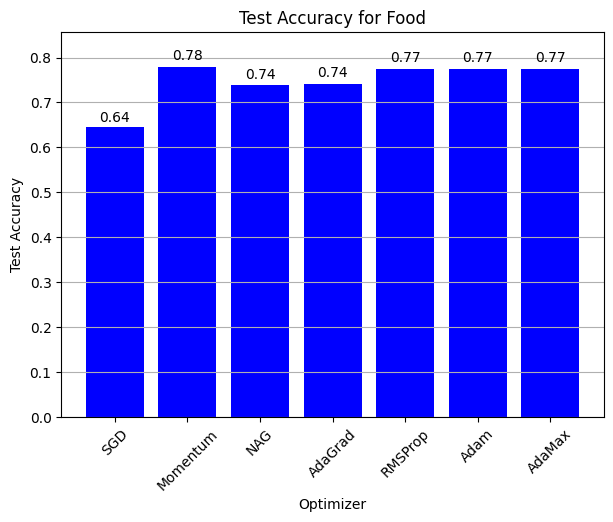

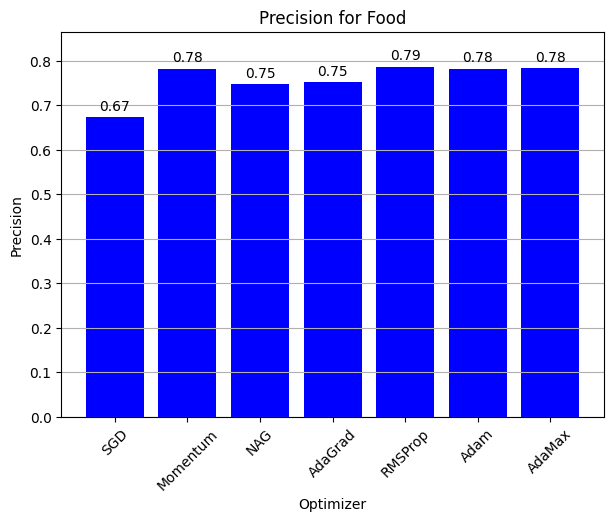

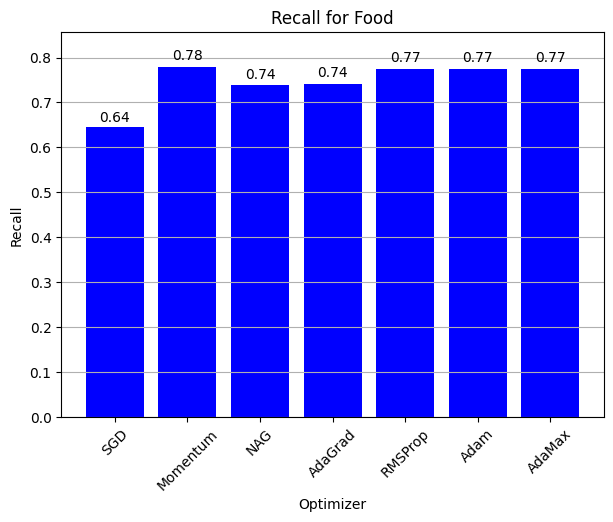

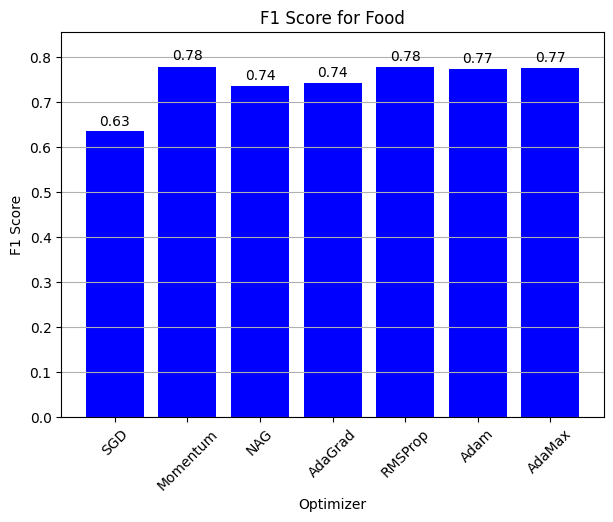

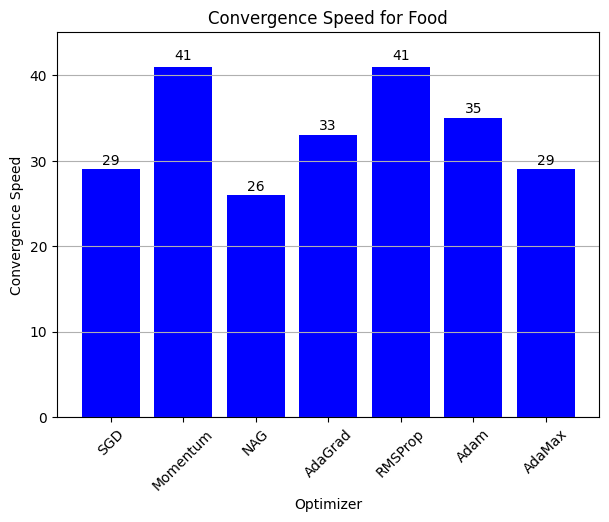

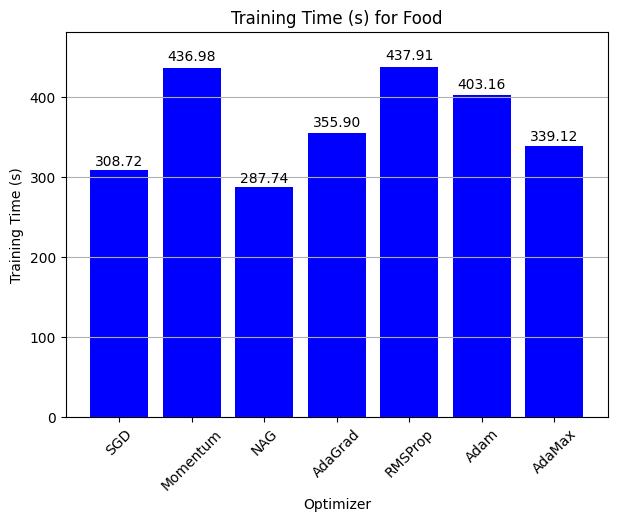

In [153]:
metrics = ["Test Accuracy", "Precision", "Recall", "F1 Score", "Convergence Speed", "Training Time (s)"]

for metric in metrics:
    plt.figure(figsize=(7, 5))

    subset = results_df[results_df["Dataset"] == "Food"]

    bars = plt.bar(subset["Optimizer"], subset[metric], color='blue')
    plt.title(f"{metric} for Food")
    plt.xlabel("Optimizer")
    plt.ylabel(metric)
    plt.xticks(rotation=45)
    plt.grid(axis='y')

    plt.ylim(0, max(subset[metric]) * 1.1)

    for bar in bars:
        yval = bar.get_height()
        if metric == "Convergence Speed":
            plt.text(bar.get_x() + bar.get_width() / 2, yval * 1.02, f'{int(yval)}', ha='center')
        else:
            plt.text(bar.get_x() + bar.get_width() / 2, yval * 1.02, f'{yval:.2f}', ha='center')

    plt.savefig(f"{metric}_Food_comparison.png")

    plt.show()


**RAPORT KLASYFIKACJI DLA KAŻDEGO Z OPTYMALIZATORÓW**

In [154]:
for optimizer_name, report in classification_reports.items():
    print(f"\nClassification Report - {optimizer_name} (Food):\n")
    print(report)


Classification Report - SGD (Food):

              precision    recall  f1-score   support

           0       0.65      0.74      0.69       113
           1       0.89      0.35      0.50       111
           2       0.68      0.73      0.70       179
           3       0.60      0.59      0.59       146
           4       0.67      0.70      0.68       177
           5       0.88      0.82      0.85       197
           6       0.42      0.55      0.48       159
           7       0.53      0.43      0.48       125
           8       0.69      0.45      0.54       102
           9       0.57      0.87      0.69       215
          10       0.56      0.49      0.52       170
          11       0.55      0.83      0.66       165
          12       0.66      0.86      0.74       214
          13       0.60      0.74      0.66       218
          14       0.97      0.24      0.38       138
          15       0.79      0.70      0.74       215
          16       0.67      0.52      0.59

**MACIERZ POMYŁEK SKŁADAJĄCA SIĘ Z TOP 10 NAJCZĘŚCIEJ MYLĄCYCH SIĘ KLAS**

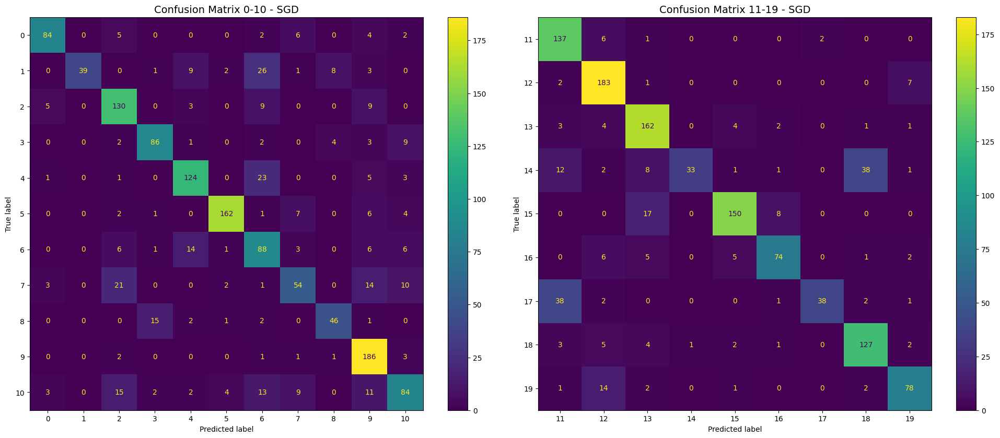

<Figure size 1170x830 with 0 Axes>

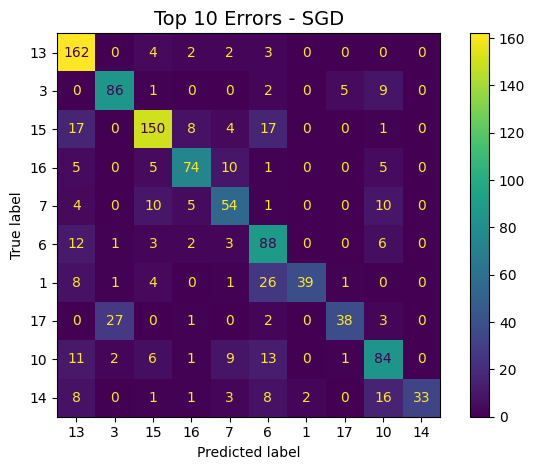

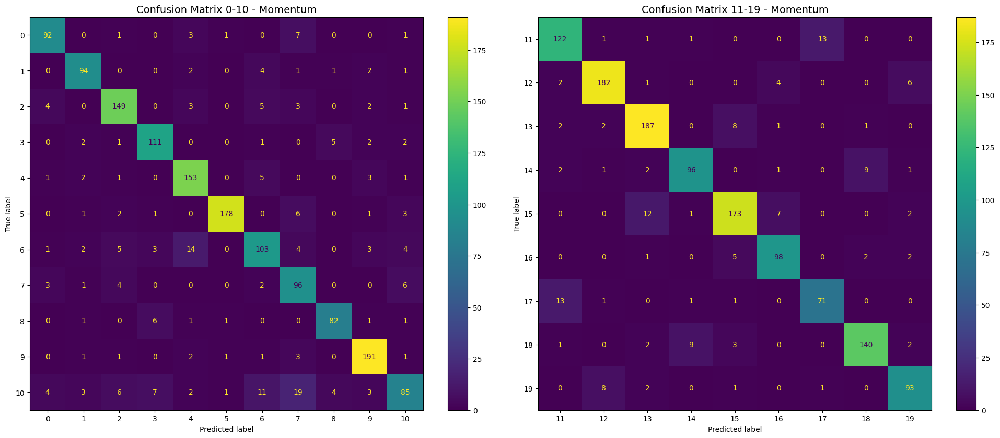

<Figure size 1170x830 with 0 Axes>

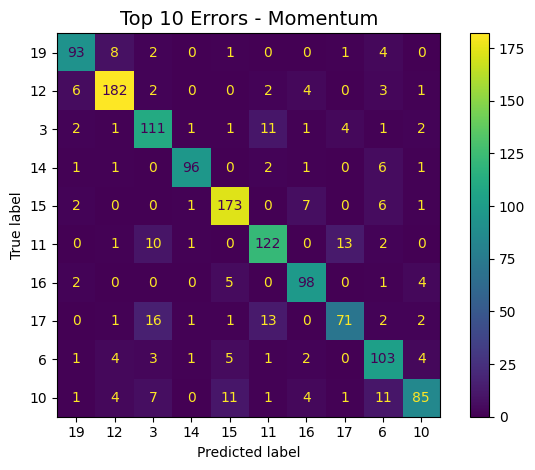

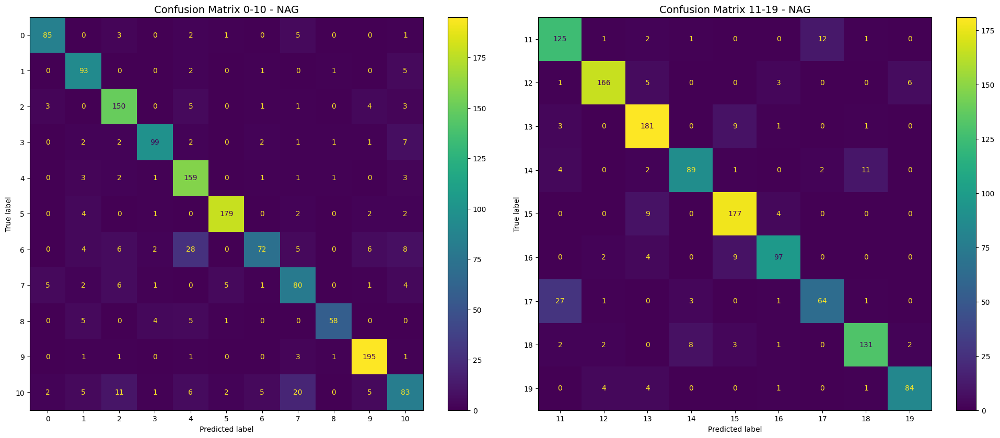

<Figure size 1170x830 with 0 Axes>

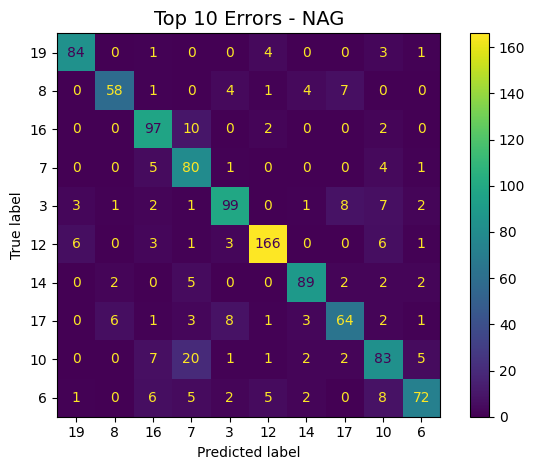

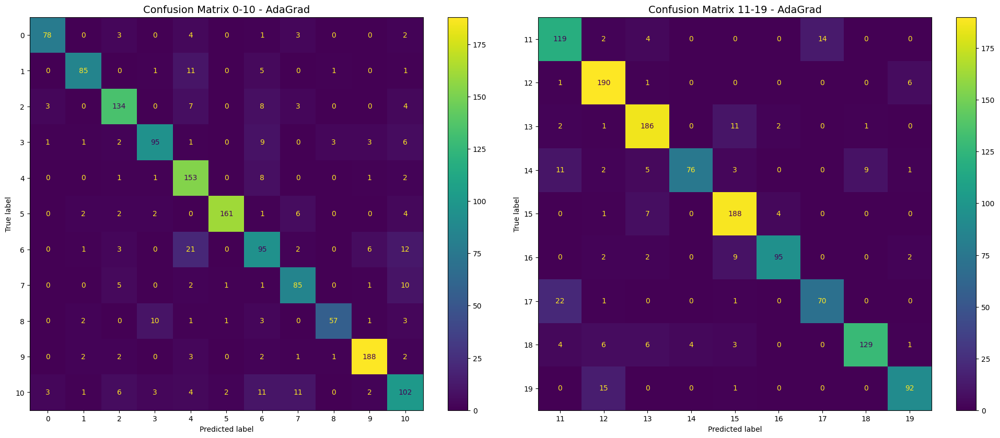

<Figure size 1170x830 with 0 Axes>

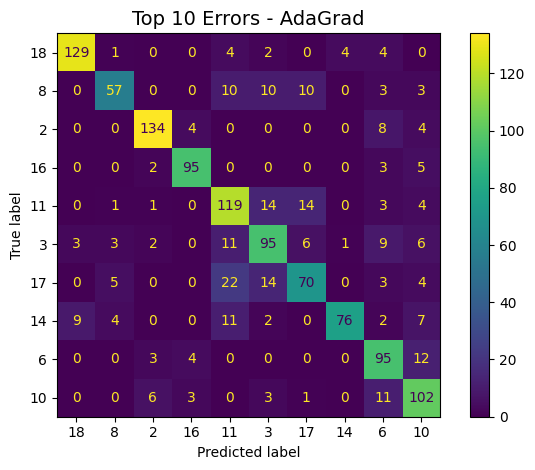

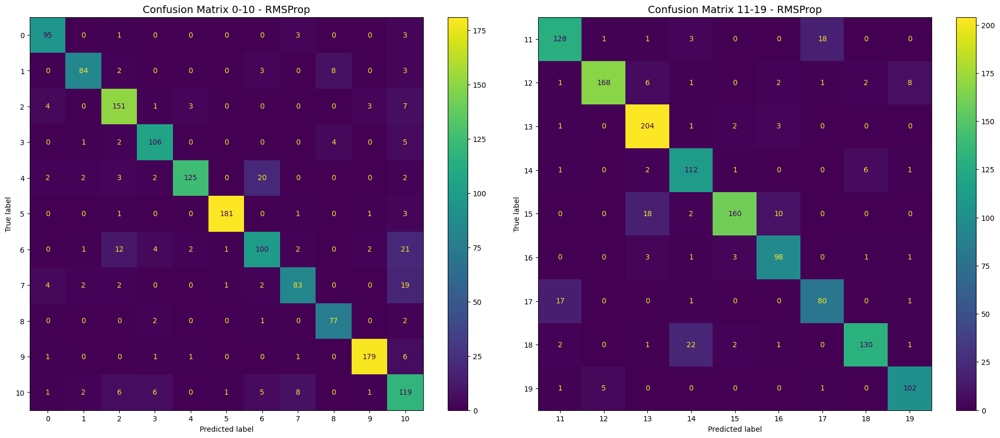

<Figure size 1170x830 with 0 Axes>

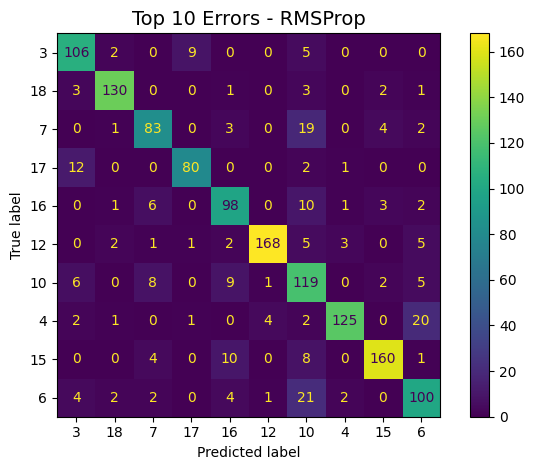

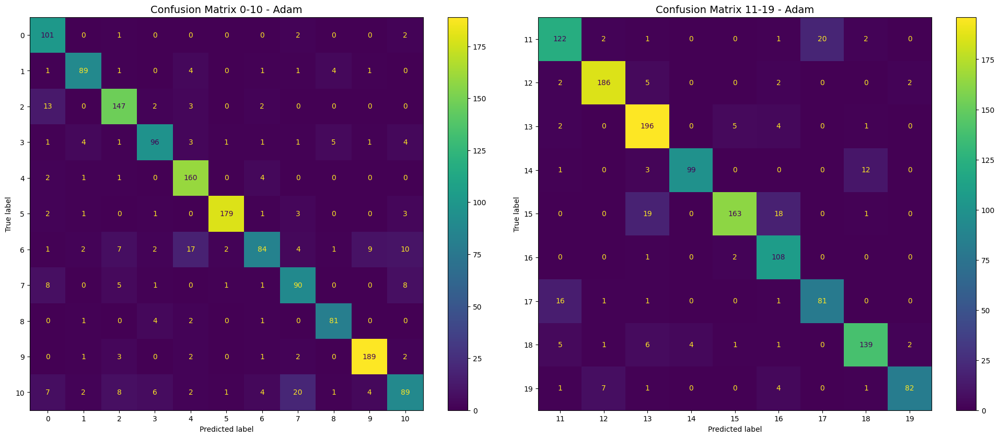

<Figure size 1170x830 with 0 Axes>

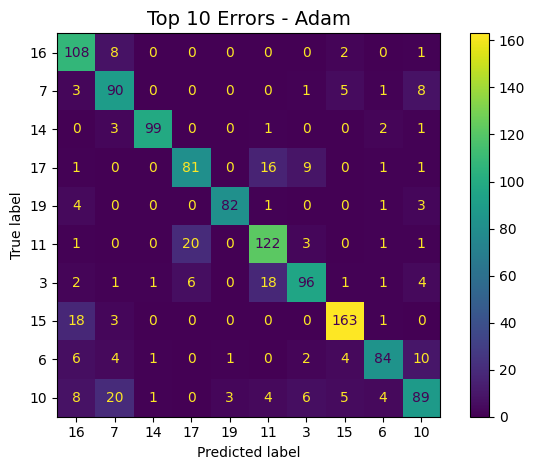

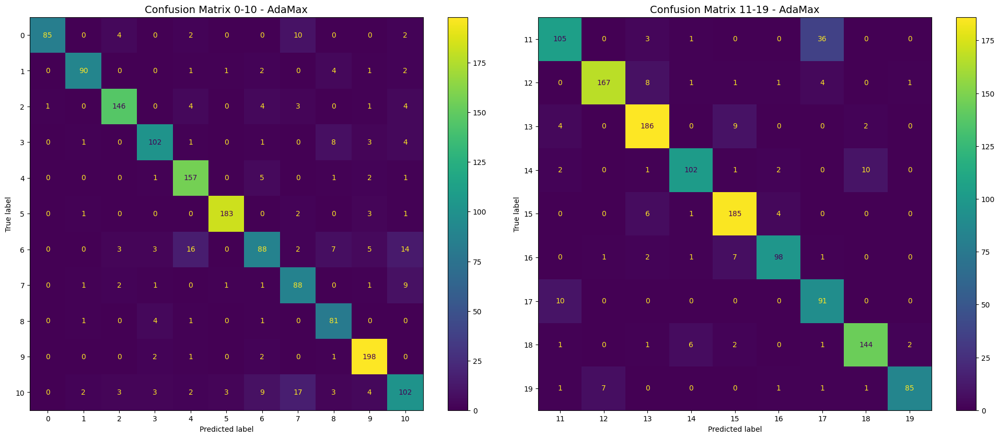

<Figure size 1170x830 with 0 Axes>

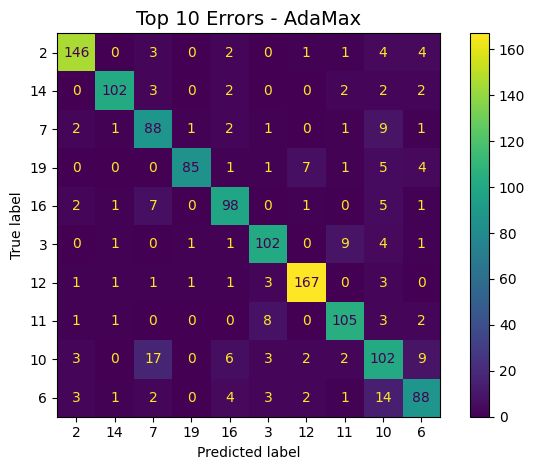

In [155]:
def filter_top_errors(cm, top_n=10):
    errors = np.sum(cm, axis=1) - np.diag(cm)
    top_classes = np.argsort(errors)[-top_n:]

    filtered_cm = cm[np.ix_(top_classes, top_classes)]
    return filtered_cm, top_classes

for optimizer_name, cm in confusion_matrices.items():
    fig, axes = plt.subplots(1, 2, figsize=(20, 8))

    max_classes = cm.shape[0]
    disp_0_10 = ConfusionMatrixDisplay(confusion_matrix=cm[:11, :11], display_labels=np.arange(0, min(11, max_classes)))
    disp_0_10.plot(cmap='viridis', values_format='d', ax=axes[0])
    axes[0].set_title(f"Confusion Matrix 0-10 - {optimizer_name}", fontsize=14)
    axes[0].tick_params(axis='both', labelsize=10)

    start_idx = 11
    end_idx = min(max_classes, 20)
    disp_11_19 = ConfusionMatrixDisplay(confusion_matrix=cm[start_idx:end_idx, start_idx:end_idx],
                                        display_labels=np.arange(start_idx, end_idx))
    disp_11_19.plot(cmap='viridis', values_format='d', ax=axes[1])
    axes[1].set_title(f"Confusion Matrix {start_idx}-{end_idx-1} - {optimizer_name}", fontsize=14)
    axes[1].tick_params(axis='both', labelsize=10)

    plt.tight_layout()
    plt.show()

    plt.figure(figsize=(11.7, 8.3))
    filtered_cm, top_classes = filter_top_errors(cm, top_n=10)
    disp_top_10 = ConfusionMatrixDisplay(confusion_matrix=filtered_cm, display_labels=top_classes)
    disp_top_10.plot(cmap='viridis', values_format='d')
    plt.title(f"Top 10 Errors - {optimizer_name}", fontsize=14)
    plt.xticks(fontsize=10)
    plt.yticks(fontsize=10)
    plt.grid(False)
    plt.tight_layout()
    plt.show()



**KRZYWE ROC-AUC DLA WSZYSTKICH OPTYMALIZATORÓW**

Generowanie krzywej ROC-AUC dla optymalizatora: SGD
Generowanie krzywej ROC-AUC dla optymalizatora: Momentum
Generowanie krzywej ROC-AUC dla optymalizatora: NAG
Generowanie krzywej ROC-AUC dla optymalizatora: AdaGrad
Generowanie krzywej ROC-AUC dla optymalizatora: RMSProp
Generowanie krzywej ROC-AUC dla optymalizatora: Adam
Generowanie krzywej ROC-AUC dla optymalizatora: AdaMax


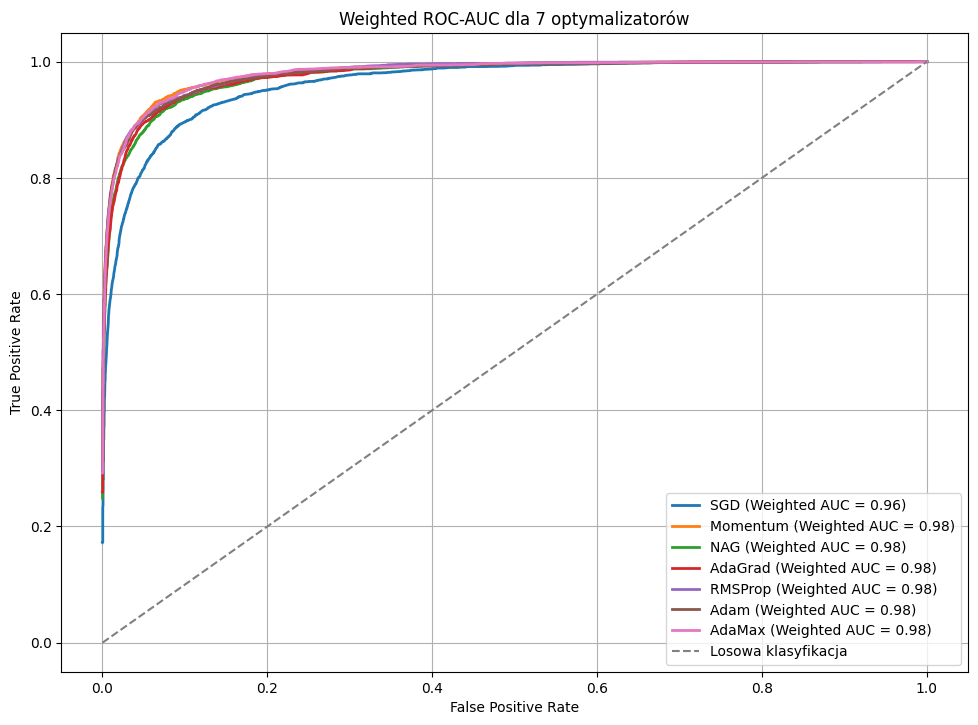

In [156]:
plt.figure(figsize=(11.7, 8.3))

y_test_binarized = label_binarize(y_test, classes=np.arange(num_classes))

for optimizer_name, y_pred_prob in y_pred_probs.items():
    print(f"Generowanie krzywej ROC-AUC dla optymalizatora: {optimizer_name}")

    fpr_macro = np.unique(np.concatenate([
        roc_curve(y_test_binarized[:, j], y_pred_prob[:, j])[0]
        for j in range(num_classes) if np.sum(y_test_binarized[:, j]) > 0
    ]))

    mean_tpr = np.zeros_like(fpr_macro)
    class_weights = np.sum(y_test_binarized, axis=0) / np.sum(y_test_binarized)
    weighted_tpr = np.zeros_like(fpr_macro)

    for j in range(num_classes):
        if np.sum(y_test_binarized[:, j]) == 0:
            continue
        fpr, tpr, _ = roc_curve(y_test_binarized[:, j], y_pred_prob[:, j])
        weighted_tpr += np.interp(fpr_macro, fpr, tpr) * class_weights[j]

    auc_weighted = auc(fpr_macro, weighted_tpr)

    plt.plot(fpr_macro, weighted_tpr, linestyle='-', label=f'{optimizer_name} (Weighted AUC = {auc_weighted:.2f})', linewidth=2)

plt.plot([0, 1], [0, 1], color='gray', linestyle='--', label='Losowa klasyfikacja')

plt.title("Weighted ROC-AUC dla 7 optymalizatorów")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.legend(loc="lower right")
plt.grid(True)

plt.savefig("Weighted_ROC_AUC_20_classes.png")
plt.show()
